# AT1: Text analysis<a href="#AT1:-Text-analysis" class="anchor-link">¶</a>

------------------------------------------------------------------------

**36118 Applied Natural Language Processing**

Reported by Afraz Ul Haque, Id: 25627377

# Table of Contents<a href="#Table-of-Contents" class="anchor-link">¶</a>

1.  Task Overview
2.  Data Understanding
3.  EDA
4.  Text Clustering
5.  Topic Modeling
6.  Network Graph Analysis
7.  Analysis Findings
8.  Conclusion

# 1. Task Overview<a href="#1.-Task-Overview" class="anchor-link">¶</a>

------------------------------------------------------------------------

Classifying skills is one way to learn about government goals, future
plans, the kinds of skills that will be needed in the future, etc. The
Australian Skills Classification (ASC) dataset will be analyzed and
evaluated using natural language processing (NLP) techniques in this
evaluation. Students will examine ASC's advantages and disadvantages,
evaluate how well it meets industry demands, and contrast it with other
taxonomies like ESCO, O\*Net, and SFIA by using text analysis.

This task requires a combination of technical and analytical skills,
including data exploration, visualization, and interpretation, to derive
meaningful conclusions. An essential aspect of the assignment is
effective storytelling—conveying insights through a structured and
engaging markdown report. Additionally, the analysis will provide a
forward-looking perspective on the key skills required for data
scientists in the future and the impact of AI on emerging roles. Through
this process, students will develop their ability to communicate complex
findings effectively, ensuring that their insights are not only
technically sound but also accessible to a broader audience.

In \[1\]:

    !pip install textstat
    !pip install pyLDAvis
    !pip install nltk spacy wordcloud
    import nltk
    nltk.download('punkt')
    nltk.download('stopwords')
    nltk.download('punkt_tab')
    !python -m spacy download en_core_web_sm

    Collecting textstat
      Downloading textstat-0.7.5-py3-none-any.whl.metadata (15 kB)
    Collecting pyphen (from textstat)
      Downloading pyphen-0.17.2-py3-none-any.whl.metadata (3.2 kB)
    Collecting cmudict (from textstat)
      Downloading cmudict-1.0.32-py3-none-any.whl.metadata (3.6 kB)
    Requirement already satisfied: setuptools in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from textstat) (75.6.0)
    Collecting importlib-metadata>=5 (from cmudict->textstat)
      Downloading importlib_metadata-8.6.1-py3-none-any.whl.metadata (4.7 kB)
    Collecting importlib-resources>=5 (from cmudict->textstat)
      Downloading importlib_resources-6.5.2-py3-none-any.whl.metadata (3.9 kB)
    Collecting zipp>=3.20 (from importlib-metadata>=5->cmudict->textstat)
      Downloading zipp-3.21.0-py3-none-any.whl.metadata (3.7 kB)
    Downloading textstat-0.7.5-py3-none-any.whl (105 kB)
    Downloading cmudict-1.0.32-py3-none-any.whl (939 kB)
       ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 939.4/939.4 kB 6.1 MB/s eta 0:00:00
    Downloading pyphen-0.17.2-py3-none-any.whl (2.1 MB)
       ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 6.4 MB/s eta 0:00:00a 0:00:01
    Downloading importlib_metadata-8.6.1-py3-none-any.whl (26 kB)
    Downloading importlib_resources-6.5.2-py3-none-any.whl (37 kB)
    Downloading zipp-3.21.0-py3-none-any.whl (9.6 kB)
    Installing collected packages: zipp, pyphen, importlib-resources, importlib-metadata, cmudict, textstat
    Successfully installed cmudict-1.0.32 importlib-metadata-8.6.1 importlib-resources-6.5.2 pyphen-0.17.2 textstat-0.7.5 zipp-3.21.0
    Collecting pyLDAvis
      Downloading pyLDAvis-3.4.1-py3-none-any.whl.metadata (4.2 kB)
    Requirement already satisfied: numpy>=1.24.2 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from pyLDAvis) (1.26.4)
    Requirement already satisfied: scipy in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from pyLDAvis) (1.15.2)
    Requirement already satisfied: pandas>=2.0.0 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from pyLDAvis) (2.2.3)
    Requirement already satisfied: joblib>=1.2.0 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from pyLDAvis) (1.4.2)
    Requirement already satisfied: jinja2 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from pyLDAvis) (3.1.5)
    Collecting numexpr (from pyLDAvis)
      Downloading numexpr-2.10.2-cp311-cp311-macosx_11_0_arm64.whl.metadata (8.1 kB)
    Collecting funcy (from pyLDAvis)
      Downloading funcy-2.0-py2.py3-none-any.whl.metadata (5.9 kB)
    Requirement already satisfied: scikit-learn>=1.0.0 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from pyLDAvis) (1.6.1)
    Collecting gensim (from pyLDAvis)
      Downloading gensim-4.3.3-cp311-cp311-macosx_11_0_arm64.whl.metadata (8.1 kB)
    Requirement already satisfied: setuptools in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from pyLDAvis) (75.6.0)
    Requirement already satisfied: python-dateutil>=2.8.2 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from pandas>=2.0.0->pyLDAvis) (2.9.0.post0)
    Requirement already satisfied: pytz>=2020.1 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from pandas>=2.0.0->pyLDAvis) (2025.1)
    Requirement already satisfied: tzdata>=2022.7 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from pandas>=2.0.0->pyLDAvis) (2025.1)
    Requirement already satisfied: threadpoolctl>=3.1.0 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from scikit-learn>=1.0.0->pyLDAvis) (3.5.0)
    Collecting scipy (from pyLDAvis)
      Downloading scipy-1.13.1-cp311-cp311-macosx_12_0_arm64.whl.metadata (60 kB)
    Collecting smart-open>=1.8.1 (from gensim->pyLDAvis)
      Downloading smart_open-7.1.0-py3-none-any.whl.metadata (24 kB)
    Requirement already satisfied: MarkupSafe>=2.0 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from jinja2->pyLDAvis) (3.0.2)
    Requirement already satisfied: six>=1.5 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from python-dateutil>=2.8.2->pandas>=2.0.0->pyLDAvis) (1.17.0)
    Requirement already satisfied: wrapt in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from smart-open>=1.8.1->gensim->pyLDAvis) (1.17.2)
    Downloading pyLDAvis-3.4.1-py3-none-any.whl (2.6 MB)
       ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 6.4 MB/s eta 0:00:00a 0:00:01
    Downloading funcy-2.0-py2.py3-none-any.whl (30 kB)
    Downloading gensim-4.3.3-cp311-cp311-macosx_11_0_arm64.whl (24.0 MB)
       ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.0/24.0 MB 6.3 MB/s eta 0:00:00a 0:00:01
    Downloading scipy-1.13.1-cp311-cp311-macosx_12_0_arm64.whl (30.3 MB)
       ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.3/30.3 MB 6.2 MB/s eta 0:00:0000:0100:01
    Downloading numexpr-2.10.2-cp311-cp311-macosx_11_0_arm64.whl (134 kB)
    Downloading smart_open-7.1.0-py3-none-any.whl (61 kB)
    Installing collected packages: funcy, smart-open, scipy, numexpr, gensim, pyLDAvis
      Attempting uninstall: scipy
        Found existing installation: scipy 1.15.2
        Uninstalling scipy-1.15.2:
          Successfully uninstalled scipy-1.15.2
    Successfully installed funcy-2.0 gensim-4.3.3 numexpr-2.10.2 pyLDAvis-3.4.1 scipy-1.13.1 smart-open-7.1.0
    Collecting nltk
      Downloading nltk-3.9.1-py3-none-any.whl.metadata (2.9 kB)
    Collecting spacy
      Downloading spacy-3.8.4-cp311-cp311-macosx_11_0_arm64.whl.metadata (27 kB)
    Collecting wordcloud
      Downloading wordcloud-1.9.4-cp311-cp311-macosx_11_0_arm64.whl.metadata (3.4 kB)
    Collecting click (from nltk)
      Downloading click-8.1.8-py3-none-any.whl.metadata (2.3 kB)
    Requirement already satisfied: joblib in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from nltk) (1.4.2)
    Collecting regex>=2021.8.3 (from nltk)
      Downloading regex-2024.11.6-cp311-cp311-macosx_11_0_arm64.whl.metadata (40 kB)
    Collecting tqdm (from nltk)
      Downloading tqdm-4.67.1-py3-none-any.whl.metadata (57 kB)
    Collecting spacy-legacy<3.1.0,>=3.0.11 (from spacy)
      Downloading spacy_legacy-3.0.12-py2.py3-none-any.whl.metadata (2.8 kB)
    Collecting spacy-loggers<2.0.0,>=1.0.0 (from spacy)
      Downloading spacy_loggers-1.0.5-py3-none-any.whl.metadata (23 kB)
    Collecting murmurhash<1.1.0,>=0.28.0 (from spacy)
      Downloading murmurhash-1.0.12-cp311-cp311-macosx_11_0_arm64.whl.metadata (2.1 kB)
    Collecting cymem<2.1.0,>=2.0.2 (from spacy)
      Downloading cymem-2.0.11-cp311-cp311-macosx_11_0_arm64.whl.metadata (8.5 kB)
    Collecting preshed<3.1.0,>=3.0.2 (from spacy)
      Downloading preshed-3.0.9-cp311-cp311-macosx_11_0_arm64.whl.metadata (2.2 kB)
    Collecting thinc<8.4.0,>=8.3.4 (from spacy)
      Downloading thinc-8.3.4-cp311-cp311-macosx_11_0_arm64.whl.metadata (15 kB)
    Collecting wasabi<1.2.0,>=0.9.1 (from spacy)
      Downloading wasabi-1.1.3-py3-none-any.whl.metadata (28 kB)
    Collecting srsly<3.0.0,>=2.4.3 (from spacy)
      Downloading srsly-2.5.1-cp311-cp311-macosx_11_0_arm64.whl.metadata (19 kB)
    Collecting catalogue<2.1.0,>=2.0.6 (from spacy)
      Downloading catalogue-2.0.10-py3-none-any.whl.metadata (14 kB)
    Collecting weasel<0.5.0,>=0.1.0 (from spacy)
      Downloading weasel-0.4.1-py3-none-any.whl.metadata (4.6 kB)
    Collecting typer<1.0.0,>=0.3.0 (from spacy)
      Downloading typer-0.15.2-py3-none-any.whl.metadata (15 kB)
    Requirement already satisfied: numpy>=1.19.0 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from spacy) (1.26.4)
    Requirement already satisfied: requests<3.0.0,>=2.13.0 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from spacy) (2.32.3)
    Collecting pydantic!=1.8,!=1.8.1,<3.0.0,>=1.7.4 (from spacy)
      Downloading pydantic-2.10.6-py3-none-any.whl.metadata (30 kB)
    Requirement already satisfied: jinja2 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from spacy) (3.1.5)
    Requirement already satisfied: setuptools in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from spacy) (75.6.0)
    Requirement already satisfied: packaging>=20.0 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from spacy) (24.2)
    Collecting langcodes<4.0.0,>=3.2.0 (from spacy)
      Downloading langcodes-3.5.0-py3-none-any.whl.metadata (29 kB)
    Requirement already satisfied: pillow in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from wordcloud) (11.1.0)
    Requirement already satisfied: matplotlib in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from wordcloud) (3.10.0)
    Collecting language-data>=1.2 (from langcodes<4.0.0,>=3.2.0->spacy)
      Downloading language_data-1.3.0-py3-none-any.whl.metadata (4.3 kB)
    Collecting annotated-types>=0.6.0 (from pydantic!=1.8,!=1.8.1,<3.0.0,>=1.7.4->spacy)
      Downloading annotated_types-0.7.0-py3-none-any.whl.metadata (15 kB)
    Collecting pydantic-core==2.27.2 (from pydantic!=1.8,!=1.8.1,<3.0.0,>=1.7.4->spacy)
      Downloading pydantic_core-2.27.2-cp311-cp311-macosx_11_0_arm64.whl.metadata (6.6 kB)
    Requirement already satisfied: typing-extensions>=4.12.2 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from pydantic!=1.8,!=1.8.1,<3.0.0,>=1.7.4->spacy) (4.12.2)
    Requirement already satisfied: charset-normalizer<4,>=2 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from requests<3.0.0,>=2.13.0->spacy) (3.4.1)
    Requirement already satisfied: idna<4,>=2.5 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from requests<3.0.0,>=2.13.0->spacy) (3.10)
    Requirement already satisfied: urllib3<3,>=1.21.1 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from requests<3.0.0,>=2.13.0->spacy) (2.3.0)
    Requirement already satisfied: certifi>=2017.4.17 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from requests<3.0.0,>=2.13.0->spacy) (2025.1.31)
    Collecting blis<1.3.0,>=1.2.0 (from thinc<8.4.0,>=8.3.4->spacy)
      Downloading blis-1.2.0-cp311-cp311-macosx_11_0_arm64.whl.metadata (7.7 kB)
    Collecting confection<1.0.0,>=0.0.1 (from thinc<8.4.0,>=8.3.4->spacy)
      Downloading confection-0.1.5-py3-none-any.whl.metadata (19 kB)
    Collecting shellingham>=1.3.0 (from typer<1.0.0,>=0.3.0->spacy)
      Downloading shellingham-1.5.4-py2.py3-none-any.whl.metadata (3.5 kB)
    Requirement already satisfied: rich>=10.11.0 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from typer<1.0.0,>=0.3.0->spacy) (13.9.4)
    Collecting cloudpathlib<1.0.0,>=0.7.0 (from weasel<0.5.0,>=0.1.0->spacy)
      Downloading cloudpathlib-0.21.0-py3-none-any.whl.metadata (14 kB)
    Requirement already satisfied: smart-open<8.0.0,>=5.2.1 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from weasel<0.5.0,>=0.1.0->spacy) (7.1.0)
    Requirement already satisfied: MarkupSafe>=2.0 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from jinja2->spacy) (3.0.2)
    Requirement already satisfied: contourpy>=1.0.1 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from matplotlib->wordcloud) (1.3.1)
    Requirement already satisfied: cycler>=0.10 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from matplotlib->wordcloud) (0.12.1)
    Requirement already satisfied: fonttools>=4.22.0 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from matplotlib->wordcloud) (4.56.0)
    Requirement already satisfied: kiwisolver>=1.3.1 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from matplotlib->wordcloud) (1.4.8)
    Requirement already satisfied: pyparsing>=2.3.1 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from matplotlib->wordcloud) (3.2.1)
    Requirement already satisfied: python-dateutil>=2.7 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from matplotlib->wordcloud) (2.9.0.post0)
    Collecting marisa-trie>=1.1.0 (from language-data>=1.2->langcodes<4.0.0,>=3.2.0->spacy)
      Downloading marisa_trie-1.2.1-cp311-cp311-macosx_11_0_arm64.whl.metadata (9.0 kB)
    Requirement already satisfied: six>=1.5 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from python-dateutil>=2.7->matplotlib->wordcloud) (1.17.0)
    Requirement already satisfied: markdown-it-py>=2.2.0 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from rich>=10.11.0->typer<1.0.0,>=0.3.0->spacy) (3.0.0)
    Requirement already satisfied: pygments<3.0.0,>=2.13.0 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from rich>=10.11.0->typer<1.0.0,>=0.3.0->spacy) (2.19.1)
    Requirement already satisfied: wrapt in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from smart-open<8.0.0,>=5.2.1->weasel<0.5.0,>=0.1.0->spacy) (1.17.2)
    Requirement already satisfied: mdurl~=0.1 in /Users/afrazrupak/tf_env/lib/python3.11/site-packages (from markdown-it-py>=2.2.0->rich>=10.11.0->typer<1.0.0,>=0.3.0->spacy) (0.1.2)
    Downloading nltk-3.9.1-py3-none-any.whl (1.5 MB)
       ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 6.4 MB/s eta 0:00:00a 0:00:01
    Downloading spacy-3.8.4-cp311-cp311-macosx_11_0_arm64.whl (6.3 MB)
       ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 5.8 MB/s eta 0:00:00a 0:00:01
    Downloading wordcloud-1.9.4-cp311-cp311-macosx_11_0_arm64.whl (167 kB)
    Downloading catalogue-2.0.10-py3-none-any.whl (17 kB)
    Downloading cymem-2.0.11-cp311-cp311-macosx_11_0_arm64.whl (41 kB)
    Downloading langcodes-3.5.0-py3-none-any.whl (182 kB)
    Downloading murmurhash-1.0.12-cp311-cp311-macosx_11_0_arm64.whl (26 kB)
    Downloading preshed-3.0.9-cp311-cp311-macosx_11_0_arm64.whl (128 kB)
    Downloading pydantic-2.10.6-py3-none-any.whl (431 kB)
    Downloading pydantic_core-2.27.2-cp311-cp311-macosx_11_0_arm64.whl (1.8 MB)
       ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 5.7 MB/s eta 0:00:00a 0:00:01
    Downloading regex-2024.11.6-cp311-cp311-macosx_11_0_arm64.whl (284 kB)
    Downloading spacy_legacy-3.0.12-py2.py3-none-any.whl (29 kB)
    Downloading spacy_loggers-1.0.5-py3-none-any.whl (22 kB)
    Downloading srsly-2.5.1-cp311-cp311-macosx_11_0_arm64.whl (634 kB)
       ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 634.4/634.4 kB 5.3 MB/s eta 0:00:00
    Downloading thinc-8.3.4-cp311-cp311-macosx_11_0_arm64.whl (774 kB)
       ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 774.2/774.2 kB 5.3 MB/s eta 0:00:00
    Downloading tqdm-4.67.1-py3-none-any.whl (78 kB)
    Downloading typer-0.15.2-py3-none-any.whl (45 kB)
    Downloading click-8.1.8-py3-none-any.whl (98 kB)
    Downloading wasabi-1.1.3-py3-none-any.whl (27 kB)
    Downloading weasel-0.4.1-py3-none-any.whl (50 kB)
    Downloading annotated_types-0.7.0-py3-none-any.whl (13 kB)
    Downloading blis-1.2.0-cp311-cp311-macosx_11_0_arm64.whl (1.3 MB)
       ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 4.5 MB/s eta 0:00:00a 0:00:01
    Downloading cloudpathlib-0.21.0-py3-none-any.whl (52 kB)
    Downloading confection-0.1.5-py3-none-any.whl (35 kB)
    Downloading language_data-1.3.0-py3-none-any.whl (5.4 MB)
       ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.4/5.4 MB 6.3 MB/s eta 0:00:00a 0:00:01
    Downloading shellingham-1.5.4-py2.py3-none-any.whl (9.8 kB)
    Downloading marisa_trie-1.2.1-cp311-cp311-macosx_11_0_arm64.whl (174 kB)
    Installing collected packages: cymem, wasabi, tqdm, spacy-loggers, spacy-legacy, shellingham, regex, pydantic-core, murmurhash, marisa-trie, cloudpathlib, click, catalogue, blis, annotated-types, srsly, pydantic, preshed, nltk, language-data, wordcloud, typer, langcodes, confection, weasel, thinc, spacy
    Successfully installed annotated-types-0.7.0 blis-1.2.0 catalogue-2.0.10 click-8.1.8 cloudpathlib-0.21.0 confection-0.1.5 cymem-2.0.11 langcodes-3.5.0 language-data-1.3.0 marisa-trie-1.2.1 murmurhash-1.0.12 nltk-3.9.1 preshed-3.0.9 pydantic-2.10.6 pydantic-core-2.27.2 regex-2024.11.6 shellingham-1.5.4 spacy-3.8.4 spacy-legacy-3.0.12 spacy-loggers-1.0.5 srsly-2.5.1 thinc-8.3.4 tqdm-4.67.1 typer-0.15.2 wasabi-1.1.3 weasel-0.4.1 wordcloud-1.9.4

    [nltk_data] Downloading package punkt to
    [nltk_data]     /Users/afrazrupak/nltk_data...
    [nltk_data]   Unzipping tokenizers/punkt.zip.
    [nltk_data] Downloading package stopwords to
    [nltk_data]     /Users/afrazrupak/nltk_data...
    [nltk_data]   Unzipping corpora/stopwords.zip.
    [nltk_data] Downloading package punkt_tab to
    [nltk_data]     /Users/afrazrupak/nltk_data...
    [nltk_data]   Unzipping tokenizers/punkt_tab.zip.

    Collecting en-core-web-sm==3.8.0
      Downloading https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-3.8.0/en_core_web_sm-3.8.0-py3-none-any.whl (12.8 MB)
         ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 6.6 MB/s eta 0:00:00a 0:00:01
    Installing collected packages: en-core-web-sm
    Successfully installed en-core-web-sm-3.8.0
    ✔ Download and installation successful
    You can now load the package via spacy.load('en_core_web_sm')

# Connecting With Google Drive<a href="#Connecting-With-Google-Drive" class="anchor-link">¶</a>

In \[2\]:

    from google.colab import drive
    drive.mount('/content/drive')

    Mounted at /content/drive

# Necessary Python libraries<a href="#Necessary-Python-libraries" class="anchor-link">¶</a>

In \[4\]:

    import pandas as pd
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns
    from sklearn.feature_extraction.text import TfidfVectorizer
    import nltk
    from nltk.corpus import stopwords
    from nltk.tokenize import word_tokenize
    nltk.download('punkt')
    nltk.download('stopwords')


    !python -m spacy download en_core_web_sm

    import networkx as nx

    from nltk.corpus import stopwords
    from nltk.util import ngrams
    from collections import Counter
    import gensim
    from gensim import corpora, models
    import pyLDAvis
    import pyLDAvis.gensim_models as gensimvis
    import re
    import string
    from collections import Counter
    from nltk.tokenize import word_tokenize
    from nltk.corpus import stopwords
    import spacy
    from wordcloud import WordCloud

    from sklearn.cluster import KMeans
    from sklearn.decomposition import PCA
    from sklearn.manifold import TSNE
    from sklearn.metrics.pairwise import cosine_similarity

    [nltk_data] Downloading package punkt to
    [nltk_data]     /Users/afrazrupak/nltk_data...
    [nltk_data]   Package punkt is already up-to-date!
    [nltk_data] Downloading package stopwords to
    [nltk_data]     /Users/afrazrupak/nltk_data...
    [nltk_data]   Package stopwords is already up-to-date!

    Collecting en-core-web-sm==3.8.0
      Downloading https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-3.8.0/en_core_web_sm-3.8.0-py3-none-any.whl (12.8 MB)
         ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 6.6 MB/s eta 0:00:00a 0:00:01
    ✔ Download and installation successful
    You can now load the package via spacy.load('en_core_web_sm')

# Loading DataSet<a href="#Loading-DataSet" class="anchor-link">¶</a>

To begin the text analysis, the Australian Skills Classification dataset
is loaded from an Excel file containing multiple sheets. Each sheet
represents different aspects of skill classifications, including core
competencies, occupation descriptions, specialist tasks, and technology
tools.

The dataset is accessed using the file path, and all sheet names are
retrieved to understand the data structure. Individual sheets are then
parsed into separate DataFrames, allowing for targeted analysis of
different skill categories.

Once loaded, common columns across multiple sheets are identified to
explore relationships between datasets. This step is crucial for merging
data efficiently and ensuring consistency. Additionally, specific
comparisons, such as analyzing common and uncommon
`ANZSCO Title`,`Occupation Type` values, provide insights into
variations in skill categorization.

To enhance analysis, key attributes such as core competencies,
proficiency levels, technology tools, and specialist tasks are extracted
and merged into a structured dataset. This refined dataset forms the
foundation for further NLP-based text analysis, visualization, and
interpretation of trends in the Australian Skills Classification system.

In \[4\]:

    data_path = '/content/drive/MyDrive/36118 Applied Natural Language Processing/AT1_Text analysis/Australian Skills Classification - December 2023.xlsx'

In \[5\]:

    xls = pd.ExcelFile(data_path)


    sheet_names = xls.sheet_names
    sheet_names

Out\[5\]:

    ['Index',
     'Glossary',
     'Occupation descriptions',
     'Core competency descriptions',
     'Specialist tasks hierarchy',
     'Tech tools heirarchy',
     'Core competencies',
     'Specialist tasks data',
     'Technology tools',
     'Appendix - tech tool examples',
     'Appendix - common tech tools']

In \[6\]:

    df_glossary = xls.parse("Glossary")
    df_Occupation_descriptions = xls.parse("Occupation descriptions")
    df_Core_competency_descriptions = xls.parse('Core competency descriptions')
    df_Specialist_tasks_hierarchy= xls.parse('Specialist tasks hierarchy')
    df_Tech_tools= xls.parse('Tech tools heirarchy')
    df_Core_comp= xls.parse('Core competencies')
    df_Specialist_tasks_data = xls.parse('Specialist tasks data')
    df_Technology_tools = xls.parse('Technology tools')
    df_Appendix_tech_tool_examples = xls.parse('Appendix - tech tool examples')

In \[7\]:

    def common_columns(*dfs):
      """
      Finds the common columns across multiple pandas DataFrames.
      """
      if not dfs:
        return set()
      common = set(dfs[0].columns)
      for df in dfs[1:]:
        common &= set(df.columns)
      return common

    # List all your dataframes here
    all_dfs = [df_glossary, df_Occupation_descriptions, df_Core_competency_descriptions,
               df_Specialist_tasks_hierarchy, df_Tech_tools, df_Core_comp,
               df_Specialist_tasks_data, df_Technology_tools, df_Appendix_tech_tool_examples]

    common_cols = common_columns(*all_dfs)
    print(f"The common columns across all datasets are:\n{common_cols}")

    The common columns across all datasets are:
    set()

In \[8\]:

    print(df_Occupation_descriptions.columns)
    print('------------------------++++++++++++___________________')
    print(df_glossary.columns)
    print('------------------------++++++++++++___________________')
    print(df_Core_competency_descriptions.columns)
    print('------------------------++++++++++++___________________')
    print(df_Specialist_tasks_hierarchy.columns)
    print('------------------------++++++++++++___________________')
    print(df_Tech_tools.columns)
    print('------------------------++++++++++++___________________')
    print(df_Core_comp.columns)
    print('------------------------++++++++++++___________________')
    print(df_Specialist_tasks_data.columns)
    print('------------------------++++++++++++___________________')
    print(df_Technology_tools.columns)

    Index(['Occupation Type', 'ANZSCO Code', 'Sub-Profile Code', 'ANZSCO Title',
           'ANZSCO Description'],
          dtype='object')
    ------------------------++++++++++++___________________
    Index(['Glossary of key terms', 'Unnamed: 1'], dtype='object')
    ------------------------++++++++++++___________________
    Index(['Core Competency', 'Core Competency Description', 'Score',
           'Proficiency Level', 'Anchor Value'],
          dtype='object')
    ------------------------++++++++++++___________________
    Index(['Specialist Task', 'Specialist Cluster', 'Cluster Family',
           'Skill Statement'],
          dtype='object')
    ------------------------++++++++++++___________________
    Index(['Technology Tool Category', 'Technology Tool Category Description',
           'Technology Tool', 'Technology Tool Description',
           'Technology Tool Extended Description'],
          dtype='object')
    ------------------------++++++++++++___________________
    Index(['Occupation Type', 'ANZSCO Code', 'Sub-Profile Code', 'ANZSCO Title',
           'Core Competency', 'Score', 'Proficiency Level', 'Anchor Value'],
          dtype='object')
    ------------------------++++++++++++___________________
    Index(['Occupation Type', 'ANZSCO Code', 'Sub-Profile Code', 'ANZSCO Title',
           'Specialist Task', '% of time spent on task',
           'Emerging/\nTrending Flag', 'Specialist Cluster',
           ' % of time spent on cluster', 'Cluster Family',
           '% of time spent on family', 'Skills Statement'],
          dtype='object')
    ------------------------++++++++++++___________________
    Index(['Occupation Type', 'ANZSCO Code', 'Sub-Profile Code', 'ANZSCO Title',
           'Technology Tool', 'Emerging/Trending Flag'],
          dtype='object')

# 2. Data Understanding<a href="#2.---Data-Understanding" class="anchor-link">¶</a>

### Identifying Common and Uncommon ANZSCO Titles<a href="#Identifying-Common-and-Uncommon-ANZSCO-Titles"
class="anchor-link">¶</a>

To analyze the relationship between core competencies and specialist
tasks, the commonalities and differences between the **df_Core_comp**
and **df_Specialist_tasks_data** datasets are examined.

First, shared column names between the two datasets are identified,
helping to establish potential links for further merging or comparison.
Next, `ANZSCO Title` values—representing standardized occupation
titles—are analyzed to determine which titles appear in both datasets
(common titles) and which are unique to each dataset (uncommon titles).

-   **Common ANZSCO Titles**: These occupations exist in both datasets,
    indicating that they have defined core competencies and associated
    specialist tasks.
-   **Uncommon Titles in df_Core_comp**: These occupations have defined
    core competencies but no corresponding specialist tasks in the
    dataset.
-   **Uncommon Titles in df_Specialist_tasks_data**: These occupations
    have specialist tasks listed but lack defined core competencies.

This analysis helps identify gaps in classification, allowing for a
deeper understanding of occupational structures and skill requirements.

In \[9\]:

    # Identify common columns between df_Core_comp and df_Specialist_tasks_data
    common_cols_core_specialist = set(df_Core_comp.columns) & set(df_Specialist_tasks_data.columns)
    print(f"The common columns between df_Core_comp and df_Specialist_tasks_data are:\n{common_cols_core_specialist}")

    The common columns between df_Core_comp and df_Specialist_tasks_data are:
    {'ANZSCO Code', 'Occupation Type', 'ANZSCO Title', 'Sub-Profile Code'}

In \[10\]:

    # Find common and uncommon 'ANZSCO Title' values
    common_anzsco_titles = set(df_Core_comp['ANZSCO Title']).intersection(set(df_Specialist_tasks_data['ANZSCO Title']))
    uncommon_in_core = set(df_Core_comp['ANZSCO Title']).difference(set(df_Specialist_tasks_data['ANZSCO Title']))
    uncommon_in_specialist = set(df_Specialist_tasks_data['ANZSCO Title']).difference(set(df_Core_comp['ANZSCO Title']))

    print("Common ANZSCO Titles:")
    print(common_anzsco_titles)

    print("\nUncommon ANZSCO Titles in df_Core_comp:")
    print(uncommon_in_core)

    print("\nUncommon ANZSCO Titles in df_Specialist_tasks_data:")
    len(uncommon_in_specialist)

    Common ANZSCO Titles:
    {'Fruit and Vegetable Factory Worker', 'Shearers and Wool Classers', 'Medical Scientists', 'Stonemason', 'Barristers', 'Marketing Specialist', 'Meter Reader', 'School Principals', 'Orthotist or Prosthetist', 'Policy Analyst', 'Welder (First Class)', 'Earth Science Technician', 'Car Detailer', 'Bulldozer Operator', 'Irrigation Technician', 'Sugar Cane Grower', 'Call or Contact Centre Operator', 'Traditional Chinese Medicine Practitioner', 'Private Investigator', 'Fencer', 'Life Science Technician', 'Teachers of English to Speakers of Other Languages', 'Construction Rigger', 'Chiropractors and Osteopaths', 'Motor Vehicle Parts Interpreter / Automotive Parts Salesperson', 'Food and Drink Factory Workers', 'Geotechnical Engineer', 'Nuclear Medicine Technologist', 'Psychotherapist', 'Financial Brokers', 'Diversional Therapists', 'Electrical Engineering Draftsperson', 'Clay Processing Factory Worker', 'Irrigation Designer', 'Paving and Surfacing Labourer', 'Renal Medicine Specialist', 'Stage Manager', 'Primary School Teacher', 'Cafe or Restaurant Manager', 'Secretary (General)', 'Roof Tiler', 'Sheep Farmer', 'Podiatrists', 'Tyre Fitter', 'Physiotherapist', 'Fast Food Cooks', 'Horticultural Crop Growers', 'Psychiatrists', 'Crossing Supervisor', 'Database and Systems Administrators, and ICT Security Specialists', 'Agronomist', 'Natural Remedy Consultant', 'Social Worker', 'Nurserypersons', 'Medical Laboratory Scientist', 'Kitchenhand', 'Hide and Skin Processing Worker', 'Cyber Security Operations Coordinator', 'Community Worker', 'Education Advisers and Reviewers', 'Education Aides', 'Payroll Clerks', 'Sales Representative (Business Services)', 'Other Spatial Scientist', 'Dental Technician', 'Medical Oncologist', 'Drama Teacher (Private Tuition)', 'Company Secretary', "Plumber's Assistant", 'Landscape Gardener', 'Hotel or Motel Receptionist', 'ICT Business Development Manager', 'Survey Interviewer', 'Civil Engineering Professionals', 'Beef Cattle Farmer', 'Railway Track Plant Operator', 'Life Scientist (General)', 'Rehabilitation Counsellor', 'Gasfitter', 'General Clerk', 'Ambulance Officers and Paramedics', 'Electrical Engineering Draftspersons and Technicians', 'Production Clerk', 'Speech Pathologist / Speech Language Therapist', 'Florists', 'Operating Theatre Technician', 'Biomedical Engineer', 'Film, Television, Radio and Stage Directors', 'Network Analyst', 'Wholesaler', 'Furniture Maker', 'Air Transport Professionals', 'Beef Cattle Farm Worker', 'Naturopath', 'Quality Assurance Manager', 'Fashion, Industrial and Jewellery Designers', 'Director of Photography', 'Psychiatrist', 'Aged and Disabled Carers', 'Paving and Surfacing Labourers', "Teachers' Aide", 'Footwear Production Machine Operator', 'Materials Engineer', 'Physiotherapists', 'Recycling Worker', 'Fishing Leading Hand', 'Structural Steel Erector', 'Paediatric Surgeon', 'Registered Nurse (Critical Care and Emergency)', 'Safety Inspector', 'Debt Collector', 'Sales Representative (Building and Plumbing Supplies)', 'Nursing Support Worker', 'Train Driver', 'Vehicle Painters', 'Industrial Designer', 'Sales Assistant (General)', 'Glass Processing Worker', 'Aircraft Maintenance Engineer (Structures)', 'Anaesthetists', 'Auditors, Company Secretaries and Corporate Treasurers', 'Autoglazier', 'Car Park Attendant', 'Student Counsellor', 'Agricultural Consultant', 'Aquaculture Worker', 'Specialist Physicians', 'Analyst Programmer', 'Broadacre Crop and Livestock Farm Worker', 'Corporate General Manager', 'Driving Instructors', 'Gallery or Museum Technician', 'Statistician', 'Other Factory Process Workers', 'Concreter', 'Enrolled Nurse', 'Rubber Factory Worker', 'Checkout Operators and Office Cashiers', 'Butchers and Smallgoods Makers', 'Nurseryperson', 'Animal Attendants and Trainers', 'Contract Administrator', 'Model', 'Personal Assistants', 'Psychologists', 'Agricultural and Horticultural Mobile Plant Operator', 'Forestry Worker', 'Primary Health Organisation Manager', 'Corporate Services Manager', 'Child Carers', 'Pig Farmer', 'Wood Machinist', 'Panelbeaters', 'Drainage, Sewerage and Stormwater Labourer', 'Human Resource Adviser', 'Roof Tilers', 'Food Trades Assistants', 'Senior Broadacre Crop and Livestock Farm Worker', 'Nursing Clinical Director', 'Transport Company Manager', 'Librarian', 'Biochemist', 'Proof Reader', 'Vegetable Grower', 'Agricultural Research Scientist', 'Secondary School Teacher', 'Meat Process Worker', 'Fruit Picker', 'Paper and Wood Processing Machine Operators', 'Vocational Education Teachers / Polytechnic Teachers', 'Hunter-Trapper', 'Visual Merchandisers', 'Park Ranger', 'Car Detailers', 'Graphic Designer', 'Industrial Engineer', 'Mixed Cattle and Sheep Farmer', 'Motor Vehicle or Caravan Salesperson', 'Photographer', 'Hotel and Motel Managers', 'Market Research Analyst', 'Telecommunications Linesworker / Telecommunications Line Mechanic', 'Confectionery Maker', 'Garden Labourers', 'Airconditioning and Mechanical Services Plumber', 'Retail Loss Prevention Officer', 'Health Promotion Officer', 'Data Entry Operator', 'Textile Dyeing and Finishing Machine Operator', 'Ministers of Religion', 'Pharmacy Technician', 'Aged or Disabled Carer', 'Pest Control Technician', 'Production Manager (Manufacturing)', 'Lift Mechanic', 'Architectural Draftsperson', 'Bookkeepers', 'Machine Shorthand Reporter', 'Civil Engineering Draftspersons and Technicians', 'Other Health Diagnostic and Promotion Professionals', 'Director (Film, Television, Radio or Stage)', 'Accountants', 'Building Insulation Installer', 'Other Engineering Professionals', 'Welfare Worker', 'Microbiologist', 'Stock Clerk', 'Switchboard Operators', 'Archaeologist', 'Video Producer', 'Penetration Tester', 'Betting Clerks', 'Sheetmetal Workers', 'Library Technician', 'Telecommunications Network Engineer', 'Registered Nurse (Medical)', 'Other Miscellaneous Technicians and Trades Workers', 'Sound Technician', 'Product Examiner', 'Aeroplane Pilot', 'Pathologist', 'Power Generation Plant Operator', 'Advertising Specialist', 'Fruit Grower', 'Mathematical Science Professionals', 'Tanker Driver', 'Sterilisation Technician', 'Sewing Machinists', 'ICT Support Technicians', 'Dental Hygienists, Technicians and Therapists', 'Paving Plant Operator', 'Training and Development Professionals', 'Commercial Cleaner', 'Broadacre Crop and Livestock Farmer', 'Product Tester', 'Neurosurgeon', 'Beauty Therapists', "Builder's Labourer", 'Registered Nurse (Paediatrics)', 'Signwriter', 'Cardiothoracic Surgeon', 'Research and Development Manager', 'Graphic Pre-press Trades Worker', 'Glazier', 'Recruitment Consultant', 'Engineering Technologist', 'Dental Prosthetist', 'Poultry Farm Worker', 'Diagnostic and Interventional Radiologist', 'Health Practice Manager', 'Sales and Marketing Manager', 'Garden Labourer', 'Diversional Therapist', 'Lifeguard', 'Insurance Agents', 'Middle School Teacher / Intermediate School Teacher', 'Neurologist', 'Graphic and Web Designers, and Illustrators', 'Aquaculture or Fisheries Technician', 'Registered Nurse (Disability and Rehabilitation)', 'Chemical Plant Operator', 'Preschool Aide', 'Public Relations Manager', 'Solicitor', 'Switchboard Operator', 'Plasterers and Renderers', 'Electronic Engineering Technician', 'Gallery, Museum and Tour Guides', 'Hunting Guide', 'Pharmacy Sales Assistant', 'Technical Director', 'Metal Machinist (First Class)', 'Upholsterers', 'Art Director (Film, Television or Stage)', 'Organisation and Methods Analyst', 'Other Cleaners', 'Screen Printer', 'Hardware Technician', 'Dentist', 'Prison Officers', 'Senior Beef Cattle Station Worker', 'Registered Nurse (Child and Family Health)', 'Hospital Pharmacist', 'ICT Sales Assistant', 'Structural Engineer', 'Advertising Manager', 'Retail Supervisor', 'Outdoor Adventure Instructor', 'Motor Mechanic (General)', 'Checkout Operator', "Ship's Officer", 'Emergency Service Worker', 'Hospital Orderly', 'Emergency Medicine Specialist', 'Earthmoving Plant Operator (General)', 'Dental Practitioners', 'Watch and Clock Maker and Repairer', 'Archivist', 'Web Designer', 'Meteorologist', 'Post Office Manager', 'Digital Marketing Analyst', 'Media Producer (excluding Video)', 'Funeral Workers', 'Plastics and Rubber Factory Workers', 'Bicycle Mechanic', 'Barista', 'Special Education Teachers', 'Sports Coaches, Instructors and Officials', 'Midwife', 'Tow Truck Driver', 'Amusement, Fitness and Sports Centre Managers', 'Surgeon (General)', 'Transport Engineer', 'Immigration Officer', 'Carpenters and Joiners', 'Supply and Distribution Manager', 'Chemical and Materials Engineers', 'Crane, Hoist and Lift Operators', 'Order Clerk', 'Records Manager', 'Welfare Centre Manager', 'Lagger', 'Engineering Managers', 'Word Processing Operator', 'Auctioneers, and Stock and Station Agents', 'Deck Hand', 'Scaffolder', 'Railway Track Worker', 'Petroleum Engineer', 'Systems Administrator', 'ICT Managers', 'Bank Workers', 'Retail Supervisors', 'Service Station Attendant', 'Midwives', 'Beauty Therapist', 'Music Teacher (Private Tuition)', 'Cabler (Data and Telecommunications)', 'Prison Officer', 'Grain, Oilseed, Pulse and Pasture Farm Worker', 'Financial Institution Branch Manager', 'Meat Boner and Slicer', 'Other Education Managers', "Ship's Master", 'Credit and Loans Officers', 'Travel Attendants', 'Intelligence Officer', 'Occupational Health and Safety Adviser', 'Mining Engineer (excluding Petroleum)', 'Business Machine Mechanic', 'Slaughterer', 'Ticket Salespersons', 'Precision Instrument Maker and Repairer', 'Gastroenterologist', 'Special Care Workers', 'Fire Fighter', 'Vegetable Farm Worker', 'Web Administrator', 'Shelf Fillers', 'Public Relations Professionals', 'Camera Operator (Film, Television or Video)', 'Telecommunications Engineer', 'Filing and Registry Clerks', 'Sawmill or Timber Yard Worker', 'Film and Video Editor', 'Librarians', 'Dental Therapist', 'Early Childhood (Pre-primary School) Teachers', 'Waiter', 'Animal Husbandry Technician', 'Early Childhood (Pre-primary School) Teacher', 'Printing Assistants and Table Workers', 'Pathology Collector / Phlebotomist', 'Economist', 'Electronic Equipment Trades Worker', 'Registered Nurses', 'Ticket Collector or Usher', 'Nutrition Professionals', 'Policy and Planning Manager', 'Mechanical Engineering Draftsperson', 'Landscape Gardeners and Irrigation Technicians', 'Courier', 'Architect', 'Radio Despatcher', 'Concreters', 'ICT Sales Assistants', 'Shelf Filler', 'Database Administrator', 'Liaison Officer', 'Geophysicist', 'Conveyancers and Legal Executives', 'Botanist', 'Conference and Event Organiser', 'Dental Assistant', 'Interior Decorator', 'Metallurgist', 'Management and Organisation Analysts', 'Retail Managers', 'Procurement Manager', 'General Practitioner', 'Industrial Spraypainter', 'Hydrogeologist', 'Horticultural Nursery Assistant', 'Registered Nurse (Community Health)', 'Dairy Cattle Farmer', 'Musical Instrument Maker or Repairer', 'Jewellers', 'Hotel or Motel Manager', 'Veterinarians', 'Child Care Centre Managers', 'Family and Marriage Counsellor', 'Clothing Patternmaker', 'Bricklayer', 'Communications Operator', 'Cardiologist', 'Electrical Distribution Trades Workers', 'Acupuncturist', 'Religious Assistant', 'ICT Sales Representative', 'Forestry Operations Supervisor', 'Singer', 'Chiropractor', 'Finance Manager', 'Health and Welfare Services Managers', 'Musician (Instrumental)', 'Automotive Electrician', 'Facilities Administrator', 'Cost Clerk', 'Hide and Skin Processing Machine Operator', 'Production Manager (Mining)', 'Special Needs Teacher', 'Admissions Clerk', 'Joiner', 'Call or Contact Centre Manager', 'Cafe Workers', 'Fabric and Textile Factory Worker', 'Turf Grower', 'Kitchenhands', 'Brewery Worker', 'Clay, Concrete, Glass and Stone Processing Machine Operators', 'Forklift Drivers', 'Dairy Cattle Farm Worker', 'Interior Designer', 'Telecommunications Engineering Professionals', 'Information Officers', 'Flying Instructor', 'Conference and Event Organisers', 'Construction Estimator', 'Mechanical Engineering Technician', 'Human Resource Managers', 'Research and Development Managers', 'Clinical Psychologist', 'Policy and Planning Managers', 'Importers, Exporters and Wholesalers', 'Environmental Research Scientist', 'Warehouse Administrator', 'Motor Vehicle Parts and Accessories Fitters', 'Safety Inspectors', 'Gas or Petroleum Operator', 'Dermatologist', 'Chef', 'Laundry Worker (General)', 'Bookkeeper', 'Sales Representative (Industrial Products)', 'Geologist', 'Aquaculture or Fisheries Scientist', 'Mechanical Engineer', 'Delivery Drivers', 'Poultry Farmer', 'Copywriter', 'Wall and Floor Tilers', 'Disabilities Services Officer', 'Nurse Managers', 'Make Up Artist', 'Engineering Production Workers', 'Senior Cattle and Sheep Farm Worker', 'Crane, Hoist or Lift Operator', 'Sugar Mill Worker', 'Thoracic Medicine Specialist', 'Glass Production Machine Operator', 'Child Care Worker', 'Urban and Regional Planners', 'Shearer', 'Production Manager (Forestry)', 'Multimedia Designer', 'Surveying or Spatial Science Technician', 'General Clerks', 'Personal Care Assistant', 'Cyber Security Engineer', 'Sales Representative (Motor Vehicle Parts and Accessories)', 'Ironer or Presser', 'Landscape Architect', 'Medical Radiation Therapist', 'Renderer (Solid Plaster)', 'Education Adviser', 'Freight and Furniture Handlers', 'Historian', 'Homoeopath', 'Dairy Products Maker', 'ICT Support and Test Engineers', 'Cotton Grower', 'Counsellors', 'Inspectors and Regulatory Officers', 'Paper and Pulp Mill Worker', 'Pharmacy Sales Assistants', 'Medical Administrator / Medical Superintendent', 'Flight Attendant', 'Metal Casting, Forging and Finishing Trades Workers', 'ICT Customer Support Officer', 'Meat, Poultry and Seafood Process Workers', 'Carpenter and Joiner', 'University Tutor', 'Aquaculture Supervisor', 'Bar Attendant', 'Loader Operator', 'Radio Presenter', 'Electronics Engineer', 'Web Developer', 'Complementary Health Therapists', 'Parking Inspector', 'Book or Script Editor', 'Crop Farm Workers', 'Bakers and Pastrycooks', 'Deer Farmer', 'Driving Instructor', 'Economists', 'Printing Table Worker', 'Air Traffic Controller', 'Parole or Probation Officer', 'Commercial Housekeeper', 'Fruit Farm Worker', 'Quantity Surveyor', 'Data Analyst', 'Cafe Worker', 'Electronic Engineering Draftsperson', 'Agricultural, Fisheries and Forestry Scientists', 'Electronic Instrument Trades Worker (General)', 'ICT Business Analyst', 'Interpreter', 'Grain Mill Worker', 'Precision Metal Trades Workers', 'Office Manager', 'Product Assemblers', 'Agricultural, Agritech and Aquaculture Technicians', 'Senior Aquaculture, Crop and Forestry Workers', 'Careers Counsellor', 'Multimedia Specialist', 'Zoologist', 'Endocrinologist', 'Filing or Registry Clerk', 'Environmental Manager', 'Florist', 'Handyperson', 'Library Assistant', 'Supply, Distribution and Procurement Managers', 'Mixed Production Farmers', 'Vineyard Worker', 'Physicist', 'Broadacre Crop Growers', 'Dental Specialist', 'Nurse Educator', 'Chief Executives and Managing Directors', 'Steel Fixer', 'Veterinary Nurse', 'Carpenter', 'Regional Education Manager', 'Corporate Treasurer', 'Leaflet or Newspaper Deliverer', 'Industrial, Mechanical and Production Engineers', 'Agricultural Engineer', 'Electrician (General)', 'Network Administrator', 'ICT Business and Systems Analysts', 'Police Officer', 'Product Assembler', 'Delivery Driver', 'Aquaculture Farmers', 'Nut Grower', 'Aquaculture Workers', 'Hostel Parent', 'Insurance Consultant', 'Engineering Production Worker', 'Respiratory Scientist', 'Truck Driver (General)', 'Youth Worker', 'Accountant (General)', 'Civil Engineer', 'Print Finisher', 'Advertising and Marketing Professionals', 'Registered Nurse (Surgical)', 'Plastics and Rubber Production Machine Operators', 'Human Resource Manager', 'Telecommunications Technical Specialists', 'Backhoe Operator', 'Agricultural, Forestry and Horticultural Plant Operators', 'Upholsterer', 'Arts Administrator or Manager', 'Concrete Products Machine Operator', 'Educational Psychologist', 'Environmental Health Officer', 'Civil Celebrant', 'Court and Legal Clerks', 'Logging Plant Operator', 'Helicopter Pilot', 'Optometrist', "Ship's Engineer", 'Livestock Husbandry Worker', 'User Experience Designer (ICT)', 'Vending Machine Attendants', 'Telemarketers', 'Marine Surveyor', 'Customer Service Manager', 'Recycling or Rubbish Collector', 'Chief Information Officer', 'Optometrists and Orthoptists', 'Photographic Developer and Printer', 'Streetsweeper Operator', 'Marine Biologist', 'Enrolled and Mothercraft Nurses', 'Ambulance Officer', 'Civil Engineering Draftsperson', 'Motorcycle Mechanic', 'Developer Programmer', 'Weaving Machine Operator', 'Indigenous Health Workers', 'Aircraft Maintenance Engineer (Mechanical)', 'Jewellery Designer', 'Toolmaker', 'Intensive Care Specialist', "Pastrycook's Assistant", 'Aeronautical Engineer', 'Legal Secretary', 'Storepersons', 'Welfare Support Workers', 'Credit or Loans Officer', 'Diesel Motor Mechanic', 'Office Cashier', 'Paediatrician', 'Computer Network and Systems Engineer', 'Ophthalmologist', 'Social Professionals', 'Horticultural Supervisor or Specialist', 'Plastic Compounding and Reclamation Machine Operator', 'Surgeons', 'Orthopaedic Surgeon', 'Plastics Technician', 'Corporate Services Managers', 'Arborist', 'Insurance Investigators, Loss Adjusters and Risk Surveyors', 'Obstetrician and Gynaecologist', 'Mothercraft Nurse', 'Solicitors', 'Aircraft Refueller', 'Outdoor Adventure Guides', 'Waste Water or Water Plant Operator', 'Winery Cellar Hand', 'Grader Operator', 'School Principal', 'Office Managers', 'Family Day Care Worker', 'Sewing Machinist', 'Road Roller Operator', 'Civil Engineering Technician', 'Insurance Agent', 'ICT Quality Assurance Engineer', 'Nutritionist', 'Panelbeater', 'Product Grader', 'Accounts Clerk', 'Vehicle Painter', 'Program or Project Administrator', 'Survey Interviewers', 'Financial Dealers', 'Photographic Developers and Printers', 'Registered Nurse (Developmental Disability)', 'Library Assistants', 'Occupational and Environmental Health Professionals', 'Piggery Farm Worker', 'Systems Analyst', 'Aircraft Maintenance Engineers', 'Teacher of the Hearing Impaired', 'Storeperson', 'Irrigation Assistant', 'Marine Transport Professionals', 'Mail Sorters', 'Motor Vehicle and Vehicle Parts Salespersons', 'Optical Dispenser / Dispensing Optician', 'Other Medical Practitioners', 'Automobile Drivers', 'Gunsmith', 'Intensive Care Ambulance Paramedic', 'Plumbers', 'Bus and Coach Drivers', 'Clay Products Machine Operator', 'Postal Delivery Officer', 'Broadcast Transmitter Operator', 'Surveyors and Spatial Scientists', 'Road Traffic Controller', 'Materials Recycler', 'Transport Operations Inspector', 'Personal Care Consultants', 'Earthmoving Labourer', 'Nurse Researcher', 'Carpet Cleaner', 'Cabinet and Furniture Makers', 'Property Manager', 'Motion Picture Projectionist', 'Industrial Pharmacist', 'Licensed Club Managers', 'Weighbridge Operator', 'Call or Contact Centre Team Leader', 'Cotton Farm Worker', 'Forestry and Logging Workers', 'Mining Support Worker', 'Interior Designers', 'Building and Plumbing Labourers', 'Entertainer or Variety Artist', 'Poultry Process Worker', 'Tree Worker', 'Dance Teacher (Private Tuition)', "Driller's Assistant", 'Telecommunications Trades Workers', 'Cardiac Technician', 'Human Resource Clerk', 'Senior Dairy Cattle Farm Worker', 'Flower Grower', 'Chefs', 'Biotechnologist', 'Home Improvement Installer', 'Education Reviewer', 'Conservation Officer', 'Drainer', 'Commercial Cleaners', 'Floor Finishers', 'Glaziers', 'Other Specialist Managers', 'Nursing Support and Personal Care Workers', 'Electrical Engineer', 'Mathematician', 'Other Personal Service Workers', 'Sheep Farm Worker', 'Detective', 'Aircraft Maintenance Engineer (Avionics)', 'Saw Doctor', 'Textile and Footwear Production Machine Operators', 'Tree Faller', 'Cattle and Sheep Farm Worker', 'Geologists, Geophysicists and Hydrogeologists', 'Logging Assistant', 'Therapy Aide', 'Housekeepers', 'Cooks', 'Orthoptist', 'Telecommunications Technical Officer or Technologist', 'Medical Technicians', 'Teacher of the Sight Impaired', 'Photographers', 'Cyber Security Advice and Assessment Specialist', 'Community Arts Worker', 'Financial Investment Adviser', 'Mixed Production Farm Workers', 'Grain, Oilseed, Pulse or Pasture Grower / Field Crop Grower', 'Hair or Beauty Salon Assistant', 'Cartographer', 'Pet Groomer', 'Audiologists and Speech Pathologists / Therapists', 'Financial Investment Manager', 'Chemists, and Food and Wine Scientists', 'Rubber Production Machine Operator', 'Fashion Designer', 'University Lecturers and Tutors', 'Furniture Finisher', 'Real Estate Representative', 'Teacher of English to Speakers of Other Languages', 'Gardeners (General)', 'Aircraft Baggage Handler and Airline Ground Crew', 'Purchasing Officer', 'Wool Classer', 'Sportspersons', 'Yarn Carding and Spinning Machine Operator', 'Caretakers', 'Baking Factory Worker', 'Statistical Clerk', 'Street Vendors and Related Salespersons', 'Osteopath', 'Recycling and Rubbish Collectors', 'Illustrator', 'General Practitioners and Resident Medical Officers', 'Apiarist', 'Bulk Materials Handling Plant Operator', 'Occupational Therapist', 'Concrete Pump Operator', 'ICT Systems Test Engineer', 'Timber and Wood Process Workers', 'Plastic Cablemaking Machine Operator', 'Otorhinolaryngologist', 'Gaming Workers', 'Plastics Factory Worker', 'Gaming Worker', 'Medical Imaging Professionals', 'ICT Sales Professionals', 'Cyber Security Analyst', 'DevOps Engineer', 'Life Scientists', 'Hotel Service Managers', 'Printers', 'Journalists and Other Writers', 'Goat Farmer', 'Agricultural and Agritech Technician', 'Chemistry Technician', 'Medical Laboratory Technician', 'Middle School Teachers / Intermediate School Teachers', 'Mining Engineers', 'Receptionist (General)', 'Diver', 'Other Forestry and Garden Workers', 'Social Workers', 'Electrical Engineers', 'ICT Support Engineer', 'Registered Nurse (Aged Care)', 'Telecommunications Network Planner', 'Workplace Relations Adviser', 'Clinical Coder', 'Hotel Service Manager', 'Bungy Jump Master', 'Accounting Clerks', 'Travel Consultant', 'Importer or Exporter', 'Naval Architect / Marine Designer', 'Entomologist', 'Urologist', 'Railway Track Workers', 'Window Cleaner', 'Customs Officer', 'Doorperson or Luggage Porter', 'Management Accountant', 'Weight Loss Consultant', 'Mushroom Picker', 'Domestic Cleaners', 'Engraver', 'Vascular Surgeon', 'Child Care Centre Manager', 'Vegetable Picker', 'Production Managers', 'Author', 'Butcher or Smallgoods Maker', 'Fire Protection Equipment Technician', 'Fishing Guide', 'Horse Breeder', 'Cyber Governance Risk and Compliance Specialist', 'Nurse Educators and Researchers', 'Electricians', 'Taxation Accountant', 'Valuer', 'Barrister', 'Technical Writer', 'Manufacturer', 'Sheetmetal Worker', 'Shot Firer', 'Information Officer', 'Domestic Cleaner', 'Radiocommunications Technician', 'Arboriculture Workers', 'Fitness Instructors', 'Environmental Consultant', 'Fleet Manager', 'Electronic Engineering Draftspersons and Technicians', 'Medical Receptionist', 'Primary School Teachers', 'Sales Assistants (General)', 'Visual Merchandiser', "Photographer's Assistant", 'Mail Clerk', 'Bricklayers and Stonemasons', 'Other Mobile Plant Operators', 'Wall and Floor Tiler', 'Bar Attendants and Baristas', 'Judicial and Other Legal Professionals', 'Cabinet Maker', 'Translator', 'Audiologist', 'Caretaker', 'Painter', 'Wool Handler', 'Internal Auditor', 'Production Nursery Grower', 'Debt Collectors', 'Food Technologist', 'Anaesthetic Technician', 'Recreation Officer / Recreation Coordinator', 'Gardener (General)', 'Graphic Pre-press Trades Workers', 'Metal Fabricator', 'Knitting Machine Operator', 'Mountain or Glacier Guide', 'Painters', 'Roof Plumber', 'Hairdresser', 'Podiatrist', 'Nut Farm Worker', 'Laboratory Manager', 'Land Economists and Valuers', 'Fishing Hand', 'Seafood Process Worker', 'Aboriginal and Torres Strait Islander Education Worker', 'Dietitian', 'Fitter (General)', 'Fast Food Cook', 'Program Director (Television or Radio)', 'Registered Nurse (Mental Health)', 'Sports Administrator', 'Specialist Physician (General Medicine)', 'Integration Aide', 'ICT Account Manager', 'Footwear Factory Worker', 'Environmental Engineer', 'Massage Therapist', 'Electrical or Telecommunications Trades Assistant', 'Software and Applications Programmers', 'Welfare, Recreation and Community Arts Workers', 'Management Consultant', 'Senior Sheep Farm Worker', 'Registered Nurse (Perioperative)', 'Art Teacher (Private Tuition)', 'Commodities Trader', 'Sugar Cane Farm Worker', 'Forklift Driver', 'Occupational Therapists', 'Drycleaner', 'Software Tester', 'Chief Executive or Managing Director', 'Cement and Concrete Plant Worker', 'Actor', 'Boat Builders and Shipwrights', 'Environmental Scientists', 'Industrial Spraypainters', 'Licensed Club Manager', 'Security Officer', 'Mechanical Engineering Draftspersons and Technicians', 'Computer Network Professionals', 'Painter (Visual Arts)', 'Pest Control Technicians', 'Plastics Production Machine Operator (General)', 'Public Relations Professional', 'Small Engine Mechanic', 'Livestock Farmers', 'Manufacturers', 'Excavator Operator', 'Chemical Engineer', 'Wine Maker', 'Sales Representative (Personal and Household Goods)', 'Horticultural Nursery Assistants', 'Senior Broadacre Crop Farm Worker', 'External Auditor', 'Master Fisher', 'Faculty Head', 'Automotive Electricians', 'Pharmacists', 'Railway Signal Operator', 'Pastrycook', 'Refuge Worker', 'Waiters', 'Electronics Engineers', 'Minister of Religion', 'Artistic Director', 'Anaesthetist', 'Furniture Removalist', 'Music Professionals', 'Cafe and Restaurant Managers', 'Cyber Security Architect', 'Family Support Worker', 'Jeweller', 'Resident Medical Officer', 'Retail Pharmacist', 'Truck Drivers', 'Dental Hygienist', 'Forester / Forest Scientist', 'Clinical Haematologist', 'Conservator', 'Domestic Housekeeper', 'Sales Representatives', 'Taxation Inspector', 'Architects and Landscape Architects', 'Nurse Manager', 'Massage Therapists', 'Building Inspector', 'Chemist', 'Driller', 'Fencers', 'Music Director', 'Real Estate Agent', 'Chemical, Gas, Petroleum and Power Generation Plant Operators', 'Urban and Regional Planner', 'Facilities Manager', 'Wine Grape Grower', 'Telemarketer', 'Multimedia Specialists and Web Developers', 'Software Engineer', 'Crane Chaser', 'Data Scientist', 'Livestock Farm Workers', 'Registered Nurse (Medical Practice)', 'Senior Piggery Stockperson', 'Sonographer', 'Floor Finisher', 'Finance Managers', 'Gallery or Museum Curator', 'Secondary School Teachers', 'Sign Erector', 'Locksmith', 'Payroll Clerk', 'Chemical Plant Worker', 'Sports Umpire', 'Actuary', "Printer's Assistant", 'Sales Representative (Medical and Pharmaceutical Products)', 'Rheumatologist', 'Stone Processing Machine Operator', 'Engineering Manager', 'Herbalist (Western)', 'Transport and Despatch Clerks', 'Hair or Beauty Salon Manager', 'Vocational Education Teacher / Polytechnic Teacher', 'Supply Chain Analyst', 'Respiratory Technician', 'Sculptor', 'Regulatory Affairs Manager', 'Meat Boners and Slicers, and Slaughterers', 'Airconditioning and Refrigeration Mechanic', 'Engineering Patternmaker', 'Human Resource Clerks', 'Reinforced Plastic and Composite Production Worker', 'Cook', 'Dressmaker or Tailor', 'Content Creator (Marketing)', 'Whitewater Rafting Guide', 'Vineyard Supervisor', 'Dancer or Choreographer', 'Health Information Manager', 'Optical Mechanic', 'Surveyor', 'Handypersons', 'Production or Plant Engineer', 'Bank Worker', 'Retail Buyer', 'Radiation Oncologist', 'Senior Livestock Farm Workers', 'Electrical Engineering Technician', 'Vending Machine Attendant', 'Visual Arts and Crafts Professionals', 'Laundry Workers', 'Plastic and Reconstructive Surgeon', 'Medical Diagnostic Radiographer', 'Wood and Wood Products Factory Worker', 'Drug and Alcohol Counsellor', 'Nurse Practitioner', 'Fire Protection Plumber', 'Residential Care Officer', 'General Managers', 'Plumber (General)', 'Telecommunications Field Engineer', 'Boiler or Engine Operator', 'Telecommunications Cable Jointer', 'Veterinary Nurses', 'Hairdressers', 'Child or Youth Residential Care Assistant', 'Packers', 'Electrician (Special Class)', 'Potter or Ceramic Artist', 'Out of School Hours Care Worker', 'Airconditioning and Refrigeration Mechanics', 'Building Associate', 'Construction Managers', 'Fitness Instructor', 'Composer', 'Nanny', 'Aboriginal and Torres Strait Islander Health Worker', 'Organisational Psychologist', 'Baker', 'Security Consultant', 'Sales Demonstrator', 'Dental Assistants', 'Training and Development Professional', 'Technical Sales Representatives', 'Service Station Attendants', 'Veterinarian', 'Private Tutors and Teachers', 'Signwriters', 'Plastics Fabricator or Welder', 'Personal Assistant', 'Linemarker', 'Telecommunications Technician', 'Trekking Guide', 'University Lecturer', 'Keyboard Operators', 'Miner', 'ICT Project Manager', 'Plasterer (Wall and Ceiling)', 'Stablehand', 'Aquaculture Farmer'}

    Uncommon ANZSCO Titles in df_Core_comp:
    set()

    Uncommon ANZSCO Titles in df_Specialist_tasks_data:

Out\[10\]:

    474

This is a comparison between "core skills" and "specialist job data"
based on "ANZSCO titles.". Total common value is 1101 and uncommon is
474. For merging datasets, it will be our key factor.

In \[11\]:

    print('Number of Uncommon ANZSCO Titles between both columns: ',len(uncommon_in_specialist))
    print('Number of Common ANZSCO Titles between both columns : ',len(common_anzsco_titles))

    Number of Uncommon ANZSCO Titles between both columns:  474
    Number of Common ANZSCO Titles between both columns :  1101

In \[12\]:

    # Comparing the lengths of uncommon values
    if len(uncommon_in_core) > len(uncommon_in_specialist):
        print("df_Core_comp has more uncommon 'ANZSCO Title' values.")
    elif len(uncommon_in_specialist) > len(uncommon_in_core):
        print("df_Specialist_tasks_data has more uncommon 'ANZSCO Title' values.")
    else:
        print("Both datasets have the same number of uncommon 'ANZSCO Title' values.")

    df_Specialist_tasks_data has more uncommon 'ANZSCO Title' values.

### **Description: Filtering and Merging ANZSCO Titles**<a href="#Description:-Filtering-and-Merging-ANZSCO-Titles"
class="anchor-link">¶</a>

To facilitate a structured analysis, the dataset is divided based on the
presence of `ANZSCO Title` values in both **df_Core_comp** and
**df_Specialist_tasks_data**.

-   **Common ANZSCO Titles**: A new DataFrame,
    `df_Specialist_tasks_data_common_anzsco`, is created by filtering
    out rows in **df_Specialist_tasks_data** that contain `ANZSCO Title`
    values found in **df_Core_comp**. These entries represent
    occupations with both defined core competencies and specialist
    tasks.
-   **Uncommon ANZSCO Titles**: Another DataFrame,
    `df_Specialist_tasks_data_uncommon_anzsco`, is created to store
    occupations that appear only in **df_Specialist_tasks_data**,
    meaning they have specialist tasks but no recorded core
    competencies.
-   **Merged DataFrame**: A copy of
    `df_Specialist_tasks_data_common_anzsco` is stored in `merged_df`,
    which is then reset to a new index for consistency in further
    analysis.

This segmentation ensures a well-organized dataset, making it easier to
explore relationships between core competencies and specialist tasks
while identifying potential gaps in occupational classifications.

In \[13\]:

    # Create a new DataFrame with common 'ANZSCO Title' values
    df_Specialist_tasks_data_common_anzsco = df_Specialist_tasks_data[df_Specialist_tasks_data['ANZSCO Title'].isin(common_anzsco_titles)]

    # Create a new DataFrame with uncommon 'ANZSCO Title' values
    df_Specialist_tasks_data_uncommon_anzsco = df_Specialist_tasks_data[~df_Specialist_tasks_data['ANZSCO Title'].isin(common_anzsco_titles)]

In \[14\]:

    merged_df = df_Specialist_tasks_data_common_anzsco.copy()
    merged_df.head(2)

Out\[14\]:

|     | Occupation Type | ANZSCO Code | Sub-Profile Code | ANZSCO Title                            | Specialist Task                                   | % of time spent on task | Emerging/\nTrending Flag | Specialist Cluster                                | % of time spent on cluster | Cluster Family                               | % of time spent on family | Skills Statement                                  |
|-----|-----------------|-------------|------------------|-----------------------------------------|---------------------------------------------------|-------------------------|--------------------------|---------------------------------------------------|----------------------------|----------------------------------------------|---------------------------|---------------------------------------------------|
| 0   | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Direct or manage financial activities or opera... | 0.1302                  | NaN                      | Manage, monitor and undertake financial activi... | 0.1644                     | Business operations and financial activities | 0.5322                    | Direct and oversee the financial operations of... |
| 1   | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Direct department or organisational activities    | 0.1117                  | Trending                 | Manage services, staff or activities              | 0.2128                     | Business operations and financial activities | 0.5322                    | Direct and oversee the activities of a work un... |





In \[15\]:

    merged_df = merged_df.reset_index(drop=True)
    merged_df.head()

Out\[15\]:

|     | Occupation Type | ANZSCO Code | Sub-Profile Code | ANZSCO Title                            | Specialist Task                                   | % of time spent on task | Emerging/\nTrending Flag | Specialist Cluster                                | % of time spent on cluster | Cluster Family                               | % of time spent on family | Skills Statement                                  |
|-----|-----------------|-------------|------------------|-----------------------------------------|---------------------------------------------------|-------------------------|--------------------------|---------------------------------------------------|----------------------------|----------------------------------------------|---------------------------|---------------------------------------------------|
| 0   | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Direct or manage financial activities or opera... | 0.1302                  | NaN                      | Manage, monitor and undertake financial activi... | 0.1644                     | Business operations and financial activities | 0.5322                    | Direct and oversee the financial operations of... |
| 1   | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Direct department or organisational activities    | 0.1117                  | Trending                 | Manage services, staff or activities              | 0.2128                     | Business operations and financial activities | 0.5322                    | Direct and oversee the activities of a work un... |
| 2   | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Direct sales, marketing or customer service ac... | 0.0808                  | NaN                      | Manage services, staff or activities              | 0.2128                     | Business operations and financial activities | 0.5322                    | Direct and oversee the sales, marketing, or cu... |
| 3   | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Communicate with others to arrange, coordinate... | 0.0665                  | NaN                      | Communicate or collaborate with others            | 0.0750                     | Communication and collaboration              | 0.0890                    | Coordinate with others in order to plan, organ... |
| 4   | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Analyse data to assess operational or project ... | 0.0651                  | NaN                      | Use data to inform operational decisions          | 0.1009                     | Data, analytics, and databases               | 0.1370                    | Analyse qualitative and quantitative data aris... |





In \[16\]:

    df_Core_comp.columns

Out\[16\]:

    Index(['Occupation Type', 'ANZSCO Code', 'Sub-Profile Code', 'ANZSCO Title',
           'Core Competency', 'Score', 'Proficiency Level', 'Anchor Value'],
          dtype='object')

### **Merging Core Competency Data**<a href="#Merging-Core-Competency-Data" class="anchor-link">¶</a>

To enhance the dataset with additional occupational details, new columns
are created in `merged_df` to store core competency-related attributes:

-   **Core Competency**: Represents the essential skills required for an
    occupation.
-   **Score**: A numerical value reflecting the proficiency level of the
    core competency.
-   **Proficiency Level**: Describes the expertise required for a
    specific occupation.
-   **Anchor Value**: A reference measure for competency assessment.

For each occupation in `merged_df`, matching rows are identified in
**df_Core_comp** based on `Occupation Type` and `ANZSCO Title`. If a
match is found, the corresponding values for these core competency
attributes are assigned to the respective row in `merged_df`.

This step ensures that each occupation in the dataset is enriched with
structured competency data, facilitating a deeper analysis of skill
requirements across various roles.

In \[17\]:

    # Create new columns in merged_df
    merged_df['Core Competency'] = ''
    merged_df['Score'] = ''
    merged_df['Proficiency Level'] = ''
    merged_df['Anchor Value'] = ''

    # Iterate through rows of merged_df
    for index, row in merged_df.iterrows():
      # Find matching rows in df_Core_comp
      matching_rows = df_Core_comp[
          (df_Core_comp['Occupation Type'] == row['Occupation Type']) &
          (df_Core_comp['ANZSCO Title'] == row['ANZSCO Title'])
      ]
      # If a match is found, append values to the new columns in merged_df
      if not matching_rows.empty:
        merged_df.loc[index, 'Core Competency'] = matching_rows['Core Competency'].values[0]
        merged_df.loc[index, 'Score'] = matching_rows['Score'].values[0]
        merged_df.loc[index, 'Proficiency Level'] = matching_rows['Proficiency Level'].values[0]
        merged_df.loc[index, 'Anchor Value'] = matching_rows['Anchor Value'].values[0]

In \[18\]:

    merged_df

Out\[18\]:

|       | Occupation Type | ANZSCO Code | Sub-Profile Code | ANZSCO Title                            | Specialist Task                                   | % of time spent on task | Emerging/\nTrending Flag | Specialist Cluster                                | % of time spent on cluster | Cluster Family                               | % of time spent on family | Skills Statement                                  | Core Competency    | Score | Proficiency Level | Anchor Value                                      |
|-------|-----------------|-------------|------------------|-----------------------------------------|---------------------------------------------------|-------------------------|--------------------------|---------------------------------------------------|----------------------------|----------------------------------------------|---------------------------|---------------------------------------------------|--------------------|-------|-------------------|---------------------------------------------------|
| 0     | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Direct or manage financial activities or opera... | 0.130200                | NaN                      | Manage, monitor and undertake financial activi... | 0.164400                   | Business operations and financial activities | 0.532200                  | Direct and oversee the financial operations of... | Digital engagement | 6     | Intermediate      | Use software on a portable device to document ... |
| 1     | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Direct department or organisational activities    | 0.111700                | Trending                 | Manage services, staff or activities              | 0.212800                   | Business operations and financial activities | 0.532200                  | Direct and oversee the activities of a work un... | Digital engagement | 6     | Intermediate      | Use software on a portable device to document ... |
| 2     | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Direct sales, marketing or customer service ac... | 0.080800                | NaN                      | Manage services, staff or activities              | 0.212800                   | Business operations and financial activities | 0.532200                  | Direct and oversee the sales, marketing, or cu... | Digital engagement | 6     | Intermediate      | Use software on a portable device to document ... |
| 3     | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Communicate with others to arrange, coordinate... | 0.066500                | NaN                      | Communicate or collaborate with others            | 0.075000                   | Communication and collaboration              | 0.089000                  | Coordinate with others in order to plan, organ... | Digital engagement | 6     | Intermediate      | Use software on a portable device to document ... |
| 4     | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Analyse data to assess operational or project ... | 0.065100                | NaN                      | Use data to inform operational decisions          | 0.100900                   | Data, analytics, and databases               | 0.137000                  | Analyse qualitative and quantitative data aris... | Digital engagement | 6     | Intermediate      | Use software on a portable device to document ... |
| ...   | ...             | ...         | ...              | ...                                     | ...                                               | ...                     | ...                      | ...                                               | ...                        | ...                                          | ...                       | ...                                               | ...                | ...   | ...               | ...                                               |
| 23877 | ANZSCO 6        | 899923      | NaN              | Road Traffic Controller                 | Assist drivers or pedestrians                     | 0.099610                | NaN                      | Provide transportation services                   | 0.099610                   | Vehicle operation                            | 0.449345                  | Ensure safety of drivers and pedestrians by pr... | Digital engagement | 3     | Basic             | Enter information into a database                 |
| 23878 | ANZSCO 6        | 899923      | NaN              | Road Traffic Controller                 | Maintain professional or technical knowledge, ... | 0.078108                | NaN                      | Undertake or provide professional skill and kn... | 0.078108                   | Human resources                              | 0.109211                  | Maintain professional or technical knowledge, ... | Digital engagement | 3     | Basic             | Enter information into a database                 |
| 23879 | ANZSCO 6        | 899923      | NaN              | Road Traffic Controller                 | Report complaints, rule violations or behaviou... | 0.031103                | NaN                      | Supervise staff                                   | 0.031103                   | Human resources                              | 0.109211                  | Provide oral or written reports to supervisors... | Digital engagement | 3     | Basic             | Enter information into a database                 |
| 23880 | ANZSCO 6        | 899923      | NaN              | Road Traffic Controller                 | Communicate incident or emergency situation de... | 0.016502                | NaN                      | Communicate or collaborate with others            | 0.016502                   | Communication and collaboration              | 0.016502                  | Communicate incident or emergency situation de... | Digital engagement | 3     | Basic             | Enter information into a database                 |
| 23881 | ANZSCO 6        | 899923      | NaN              | Road Traffic Controller                 | Record information about suspicious objects       | 0.016502                | NaN                      | Investigate illegal activities or maintain sec... | 0.016502                   | Security and emergency services              | 0.016502                  | Identify and record relevant information regar... | Digital engagement | 3     | Basic             | Enter information into a database                 |

23882 rows × 16 columns







### Frequency analysis ofTechnology_tools<a href="#Frequency-analysis-ofTechnology_tools"
class="anchor-link">¶</a>

In \[19\]:

    df_Technology_tools['ANZSCO Title'].value_counts()

Out\[19\]:

|                                             | count |
|---------------------------------------------|-------|
| ANZSCO Title                                |       |
| Database Administrator                      | 25    |
| ICT Business and Systems Analysts           | 24    |
| Systems Administrator                       | 23    |
| ICT Support Engineer                        | 23    |
| Computer Network and Systems Engineer       | 23    |
| ...                                         | ...   |
| Oral Pathologist                            | 1     |
| Podiatrist                                  | 1     |
| Printers                                    | 1     |
| Graphic Pre-press Trades Workers            | 1     |
| Amusement, Fitness & Sports Centre Managers | 1     |

1317 rows × 1 columns

  
**dtype:** int64

### **Aggregating Technology Tool Examples**<a href="#Aggregating-Technology-Tool-Examples"
class="anchor-link">¶</a>

The dataset contains multiple entries for various technology tools, each
associated with different examples. To streamline the data, the
`Technology Tool Example` column is aggregated for each unique
`Technology Tool`. This process groups all related examples under a
single entry for each tool, making the data more structured and easier
to analyze.

By consolidating examples into a single string for each tool, this step
enhances readability and facilitates further analysis, such as
identifying key technologies relevant to different occupations or skill
sets. This cleaned and structured data can be leveraged for insights
into industry trends and technological demands.

In \[20\]:

    print(df_Technology_tools.columns)
    print('------------------------++++++++++++___________________')
    print(df_Appendix_tech_tool_examples.columns)
    print('------------------------++++++++++++___________________')
    df_Appendix_tech_tool_examples['Technology Tool'].value_counts()

    Index(['Occupation Type', 'ANZSCO Code', 'Sub-Profile Code', 'ANZSCO Title',
           'Technology Tool', 'Emerging/Trending Flag'],
          dtype='object')
    ------------------------++++++++++++___________________
    Index(['Technology Tool', 'Technology Tool Example'], dtype='object')
    ------------------------++++++++++++___________________

Out\[20\]:

|                                                     | count |
|-----------------------------------------------------|-------|
| Technology Tool                                     |       |
| Science and engineering software                    | 157   |
| Statistical and data analysis software              | 58    |
| Scientific instruments                              | 27    |
| Alternative and complementary therapy equipment     | 12    |
| Wearable devices                                    | 11    |
| ...                                                 | ...   |
| Despatch and vehicle booking systems                | 2     |
| Athlete performance and injury monitoring software  | 2     |
| Aviation and marine communication systems           | 2     |
| Optical character reader (OCR) or scanning software | 1     |
| Enterprise system management software               | 1     |

94 rows × 1 columns

  
**dtype:** int64

In \[21\]:

    df_Technology_tools['Technology Tool'].value_counts()

Out\[21\]:

|                                                          | count |
|----------------------------------------------------------|-------|
| Technology Tool                                          |       |
| Project management software                              | 443   |
| Business intelligence and decision support software      | 305   |
| Accounting and financial management systems              | 256   |
| Patient management systems and electronic health records | 245   |
| Statistical and data analysis software                   | 237   |
| ...                                                      | ...   |
| Quantitative schedule and risk analysis software         | 3     |
| Industrial endoscopes                                    | 3     |
| Medical endoscopes                                       | 2     |
| Social media Platforms                                   | 1     |
| Scientific and medical instrument sterilisers            | 1     |

95 rows × 1 columns

  
**dtype:** int64

In \[22\]:

    # Group by 'Technology Tool' and aggregate 'Technology Tool Example'
    df_Appendix_tech_tool_examples_new = df_Appendix_tech_tool_examples.groupby('Technology Tool')['Technology Tool Example'].apply(lambda x: ', '.join(x)).reset_index()

    df_Appendix_tech_tool_examples_new

Out\[22\]:

|     | Technology Tool                                   | Technology Tool Example                           |
|-----|---------------------------------------------------|---------------------------------------------------|
| 0   | Accounting and financial management systems       | MYOB Business Essentials, Intuit QuickBooks, X... |
| 1   | Air, space, or watercraft guidance systems        | Radio frequency-based navigation and guidance ... |
| 2   | Alternative and complementary therapy equipment   | Miridia Technology AcuGraph, ZYTO LSA PRO, Mer... |
| 3   | Application and load testing software             | Selenium, Hewlett Packard LoadRunner, JUnit, D... |
| 4   | Application server software                       | Microsoft Office SharePoint Server, Microsoft ... |
| ... | ...                                               | ...                                               |
| 89  | Virtual reality technologies                      | Oculus, Samsung Gear VR, LG 360 BR, Valve Inde... |
| 90  | Virtualised IT environments and terminal services | Application Virtualisation, Desktop Virtualisa... |
| 91  | Voice recognition and response software           | Interactive voice response software, Voice rec... |
| 92  | Wearable devices                                  | Uptivo Belt, Garmin, Catapult Playr, LionHeart... |
| 93  | Web page creation and editing software            | WordPress, Content Management Systems (CMS), S... |

94 rows × 2 columns







If we looking on **Technology Tool** column, we can see both dataset has
same mount of data and also same value. So We can make a logic if
**Technology Tool** are same in both dataset then append data into
`df_Appendix_tech_tool_examples_new` dataset.

In \[23\]:

    # Create a new column 'Technology Tool Example' in df_Technology_tools
    df_Technology_tools['Technology Tool Example'] = ''

    # Iterate through rows of df_Technology_tools
    for index, row in df_Technology_tools.iterrows():
      # Find matching rows in df_Appendix_tech_tool_examples_new
      matching_rows = df_Appendix_tech_tool_examples_new[
          df_Appendix_tech_tool_examples_new['Technology Tool'] == row['Technology Tool']
      ]
      # If a match is found, append 'Technology Tool Example' to the new column
      if not matching_rows.empty:
        df_Technology_tools.loc[index, 'Technology Tool Example'] = matching_rows['Technology Tool Example'].values[0]

In \[24\]:

    df_Technology_tools

Out\[24\]:

|      | Occupation Type         | ANZSCO Code | Sub-Profile Code | ANZSCO Title                            | Technology Tool                                   | Emerging/Trending Flag | Technology Tool Example                           |
|------|-------------------------|-------------|------------------|-----------------------------------------|---------------------------------------------------|------------------------|---------------------------------------------------|
| 0    | ANZSCO 4                | 1111        | NaN              | Chief Executives and Managing Directors | Accounting and financial management systems       | NaN                    | MYOB Business Essentials, Intuit QuickBooks, X... |
| 1    | ANZSCO 4                | 1111        | NaN              | Chief Executives and Managing Directors | Audio/video conferencing software                 | NaN                    | Microsoft Office SharePoint Server MOSS, Micro... |
| 2    | ANZSCO 4                | 1111        | NaN              | Chief Executives and Managing Directors | Business intelligence and decision support sof... | NaN                    | Hyperion, Microsoft Power BI, SAP Crystal Repo... |
| 3    | ANZSCO 4                | 1111        | NaN              | Chief Executives and Managing Directors | Flow chart and diagram software                   | NaN                    | Microsoft Visio, SmartDraw, Lucidchart, Zen Fl... |
| 4    | ANZSCO 4                | 1111        | NaN              | Chief Executives and Managing Directors | Human resources software                          | NaN                    | ADP Enterprise HRMS, BrightMove Applicant Trac... |
| ...  | ...                     | ...         | ...              | ...                                     | ...                                               | ...                    | ...                                               |
| 5756 | NEC Category Occupation | 899999      | N06              | Studio Hand                             | Project management software                       | NaN                    | Microsoft SharePoint, Atlassian JIRA, Microsof... |
| 5757 | NEC Category Occupation | 899999      | N06              | Studio Hand                             | Sound and audio hardware                          | NaN                    | Musical Instrument Digital Interface (MIDI) se... |
| 5758 | NEC Category Occupation | 899999      | N06              | Studio Hand                             | Sound and audio hardware                          | NaN                    | Musical Instrument Digital Interface (MIDI) se... |
| 5759 | NEC Category Occupation | 899999      | N07              | Swimming Pool Serviceperson             | GPS and navigation technologies                   | NaN                    | Global Positioning System GPS devices, Geodeti... |
| 5760 | NEC Category Occupation | 899999      | N07              | Swimming Pool Serviceperson             | GPS and navigation technologies                   | NaN                    | Global Positioning System GPS devices, Geodeti... |

5761 rows × 7 columns







### **Integrating Technology Tools and Examples with ANZSCO Data**<a href="#Integrating-Technology-Tools-and-Examples-with-ANZSCO-Data"
class="anchor-link">¶</a>

To enhance the contextual depth of the dataset, additional columns were
created to map each occupation (`ANZSCO Title`) with relevant
**Technology Tools** and corresponding practical examples (**Technology
Tool Example**). This integration was accomplished by matching each
occupation in the main dataset (`merged_df`) with entries from an
external dataset containing detailed technology tool examples
(`df_Appendix_tech_tool_examples_new`).

Specifically, for each occupation, the code checked for matching records
based on **ANZSCO Title** and **Occupation Type**. Upon identifying a
match, it systematically assigned the relevant technology tool and its
corresponding usage example to newly created columns. This structured
mapping greatly enhanced the dataset's utility, providing clear,
occupation-specific examples of technology usage, which facilitate
targeted analysis and insight generation.

In \[25\]:

    # Create new columns in merged_df
    merged_df['Technology Tool'] = ''
    merged_df['Technology Tool Example'] = ''

    # Iterate through rows of merged_df
    for index, row in merged_df.iterrows():
      # Find matching rows in df_Technology_tools
      matching_rows = df_Technology_tools[
          (df_Technology_tools['Occupation Type'] == row['Occupation Type']) &
          (df_Technology_tools['ANZSCO Title'] == row['ANZSCO Title'])
      ]
      # If a match is found, append values to the new columns in merged_df
      if not matching_rows.empty:
        merged_df.loc[index, 'Technology Tool'] = matching_rows['Technology Tool'].values[0]
        merged_df.loc[index, 'Technology Tool Example'] = matching_rows['Technology Tool Example'].values[0]

In \[26\]:

    merged_df.head()

Out\[26\]:

|     | Occupation Type | ANZSCO Code | Sub-Profile Code | ANZSCO Title                            | Specialist Task                                   | % of time spent on task | Emerging/\nTrending Flag | Specialist Cluster                                | % of time spent on cluster | Cluster Family                               | % of time spent on family | Skills Statement                                  | Core Competency    | Score | Proficiency Level | Anchor Value                                      | Technology Tool                             | Technology Tool Example                           |
|-----|-----------------|-------------|------------------|-----------------------------------------|---------------------------------------------------|-------------------------|--------------------------|---------------------------------------------------|----------------------------|----------------------------------------------|---------------------------|---------------------------------------------------|--------------------|-------|-------------------|---------------------------------------------------|---------------------------------------------|---------------------------------------------------|
| 0   | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Direct or manage financial activities or opera... | 0.1302                  | NaN                      | Manage, monitor and undertake financial activi... | 0.1644                     | Business operations and financial activities | 0.5322                    | Direct and oversee the financial operations of... | Digital engagement | 6     | Intermediate      | Use software on a portable device to document ... | Accounting and financial management systems | MYOB Business Essentials, Intuit QuickBooks, X... |
| 1   | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Direct department or organisational activities    | 0.1117                  | Trending                 | Manage services, staff or activities              | 0.2128                     | Business operations and financial activities | 0.5322                    | Direct and oversee the activities of a work un... | Digital engagement | 6     | Intermediate      | Use software on a portable device to document ... | Accounting and financial management systems | MYOB Business Essentials, Intuit QuickBooks, X... |
| 2   | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Direct sales, marketing or customer service ac... | 0.0808                  | NaN                      | Manage services, staff or activities              | 0.2128                     | Business operations and financial activities | 0.5322                    | Direct and oversee the sales, marketing, or cu... | Digital engagement | 6     | Intermediate      | Use software on a portable device to document ... | Accounting and financial management systems | MYOB Business Essentials, Intuit QuickBooks, X... |
| 3   | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Communicate with others to arrange, coordinate... | 0.0665                  | NaN                      | Communicate or collaborate with others            | 0.0750                     | Communication and collaboration              | 0.0890                    | Coordinate with others in order to plan, organ... | Digital engagement | 6     | Intermediate      | Use software on a portable device to document ... | Accounting and financial management systems | MYOB Business Essentials, Intuit QuickBooks, X... |
| 4   | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Analyse data to assess operational or project ... | 0.0651                  | NaN                      | Use data to inform operational decisions          | 0.1009                     | Data, analytics, and databases               | 0.1370                    | Analyse qualitative and quantitative data aris... | Digital engagement | 6     | Intermediate      | Use software on a portable device to document ... | Accounting and financial management systems | MYOB Business Essentials, Intuit QuickBooks, X... |





In \[27\]:

    df_Occupation_descriptions.columns

Out\[27\]:

    Index(['Occupation Type', 'ANZSCO Code', 'Sub-Profile Code', 'ANZSCO Title',
           'ANZSCO Description'],
          dtype='object')

### **Merging ANZSCO from Occupation descriptions Descriptions**<a href="#Merging-ANZSCO-from-Occupation-descriptions-Descriptions"
class="anchor-link">¶</a>

To enrich the dataset with occupational details, an `ANZSCO Description`
column is added to the `merged_df`. This column provides detailed
descriptions of occupations based on the Australian and New Zealand
Standard Classification of Occupations (ANZSCO).

Each row in `merged_df` is iterated over, and corresponding occupation
descriptions are extracted from `df_Occupation_descriptions` based on
matching `Occupation Type` and `ANZSCO Title`. If a match is found, the
relevant description is assigned to the respective row in `merged_df`.

This step ensures that every occupation in the dataset is supplemented
with its official description, improving clarity and enabling a more
comprehensive analysis of skill requirements across different roles.

In \[28\]:

    # Create a new column 'ANZSCO Description' in merged_df
    merged_df['ANZSCO Description'] = ''

    # Iterate through rows of merged_df
    for index, row in merged_df.iterrows():
      # Find matching rows in df_Occupation_descriptions
      matching_rows = df_Occupation_descriptions[
          (df_Occupation_descriptions['Occupation Type'] == row['Occupation Type']) &
          (df_Occupation_descriptions['ANZSCO Title'] == row['ANZSCO Title'])
      ]
      # If a match is found, append 'ANZSCO Description' to the new column
      if not matching_rows.empty:
        merged_df.loc[index, 'ANZSCO Description'] = matching_rows['ANZSCO Description'].values[0]

In \[29\]:

    merged_df

Out\[29\]:

|       | Occupation Type | ANZSCO Code | Sub-Profile Code | ANZSCO Title                            | Specialist Task                                   | % of time spent on task | Emerging/\nTrending Flag | Specialist Cluster                                | % of time spent on cluster | Cluster Family                               | % of time spent on family | Skills Statement                                  | Core Competency    | Score | Proficiency Level | Anchor Value                                      | Technology Tool                             | Technology Tool Example                           | ANZSCO Description                                |
|-------|-----------------|-------------|------------------|-----------------------------------------|---------------------------------------------------|-------------------------|--------------------------|---------------------------------------------------|----------------------------|----------------------------------------------|---------------------------|---------------------------------------------------|--------------------|-------|-------------------|---------------------------------------------------|---------------------------------------------|---------------------------------------------------|---------------------------------------------------|
| 0     | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Direct or manage financial activities or opera... | 0.130200                | NaN                      | Manage, monitor and undertake financial activi... | 0.164400                   | Business operations and financial activities | 0.532200                  | Direct and oversee the financial operations of... | Digital engagement | 6     | Intermediate      | Use software on a portable device to document ... | Accounting and financial management systems | MYOB Business Essentials, Intuit QuickBooks, X... | Chief Executives and Managing Directors determ... |
| 1     | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Direct department or organisational activities    | 0.111700                | Trending                 | Manage services, staff or activities              | 0.212800                   | Business operations and financial activities | 0.532200                  | Direct and oversee the activities of a work un... | Digital engagement | 6     | Intermediate      | Use software on a portable device to document ... | Accounting and financial management systems | MYOB Business Essentials, Intuit QuickBooks, X... | Chief Executives and Managing Directors determ... |
| 2     | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Direct sales, marketing or customer service ac... | 0.080800                | NaN                      | Manage services, staff or activities              | 0.212800                   | Business operations and financial activities | 0.532200                  | Direct and oversee the sales, marketing, or cu... | Digital engagement | 6     | Intermediate      | Use software on a portable device to document ... | Accounting and financial management systems | MYOB Business Essentials, Intuit QuickBooks, X... | Chief Executives and Managing Directors determ... |
| 3     | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Communicate with others to arrange, coordinate... | 0.066500                | NaN                      | Communicate or collaborate with others            | 0.075000                   | Communication and collaboration              | 0.089000                  | Coordinate with others in order to plan, organ... | Digital engagement | 6     | Intermediate      | Use software on a portable device to document ... | Accounting and financial management systems | MYOB Business Essentials, Intuit QuickBooks, X... | Chief Executives and Managing Directors determ... |
| 4     | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Analyse data to assess operational or project ... | 0.065100                | NaN                      | Use data to inform operational decisions          | 0.100900                   | Data, analytics, and databases               | 0.137000                  | Analyse qualitative and quantitative data aris... | Digital engagement | 6     | Intermediate      | Use software on a portable device to document ... | Accounting and financial management systems | MYOB Business Essentials, Intuit QuickBooks, X... | Chief Executives and Managing Directors determ... |
| ...   | ...             | ...         | ...              | ...                                     | ...                                               | ...                     | ...                      | ...                                               | ...                        | ...                                          | ...                       | ...                                               | ...                | ...   | ...               | ...                                               | ...                                         | ...                                               | ...                                               |
| 23877 | ANZSCO 6        | 899923      | NaN              | Road Traffic Controller                 | Assist drivers or pedestrians                     | 0.099610                | NaN                      | Provide transportation services                   | 0.099610                   | Vehicle operation                            | 0.449345                  | Ensure safety of drivers and pedestrians by pr... | Digital engagement | 3     | Basic             | Enter information into a database                 | Radio frequency transmitters or receivers   | Radio Frequency Identification Device RFID sca... | Manually directs road traffic and pedestrian f... |
| 23878 | ANZSCO 6        | 899923      | NaN              | Road Traffic Controller                 | Maintain professional or technical knowledge, ... | 0.078108                | NaN                      | Undertake or provide professional skill and kn... | 0.078108                   | Human resources                              | 0.109211                  | Maintain professional or technical knowledge, ... | Digital engagement | 3     | Basic             | Enter information into a database                 | Radio frequency transmitters or receivers   | Radio Frequency Identification Device RFID sca... | Manually directs road traffic and pedestrian f... |
| 23879 | ANZSCO 6        | 899923      | NaN              | Road Traffic Controller                 | Report complaints, rule violations or behaviou... | 0.031103                | NaN                      | Supervise staff                                   | 0.031103                   | Human resources                              | 0.109211                  | Provide oral or written reports to supervisors... | Digital engagement | 3     | Basic             | Enter information into a database                 | Radio frequency transmitters or receivers   | Radio Frequency Identification Device RFID sca... | Manually directs road traffic and pedestrian f... |
| 23880 | ANZSCO 6        | 899923      | NaN              | Road Traffic Controller                 | Communicate incident or emergency situation de... | 0.016502                | NaN                      | Communicate or collaborate with others            | 0.016502                   | Communication and collaboration              | 0.016502                  | Communicate incident or emergency situation de... | Digital engagement | 3     | Basic             | Enter information into a database                 | Radio frequency transmitters or receivers   | Radio Frequency Identification Device RFID sca... | Manually directs road traffic and pedestrian f... |
| 23881 | ANZSCO 6        | 899923      | NaN              | Road Traffic Controller                 | Record information about suspicious objects       | 0.016502                | NaN                      | Investigate illegal activities or maintain sec... | 0.016502                   | Security and emergency services              | 0.016502                  | Identify and record relevant information regar... | Digital engagement | 3     | Basic             | Enter information into a database                 | Radio frequency transmitters or receivers   | Radio Frequency Identification Device RFID sca... | Manually directs road traffic and pedestrian f... |

23882 rows × 19 columns







In \[30\]:

    df_Specialist_tasks_hierarchy.columns

Out\[30\]:

    Index(['Specialist Task', 'Specialist Cluster', 'Cluster Family',
           'Skill Statement'],
          dtype='object')

In \[31\]:

    # Create new columns in merged_df
    merged_df['Specialist Task'] = ''
    merged_df['Specialist Cluster'] = ''
    merged_df['Skill Statement'] = ''

    # Iterate through rows of merged_df
    for index, row in merged_df.iterrows():
      # Find matching rows in df_Specialist_tasks_hierarchy
      matching_rows = df_Specialist_tasks_hierarchy[
          (df_Specialist_tasks_hierarchy['Cluster Family'] == row['Cluster Family'])
      ]
      # If a match is found, append values to the new columns in merged_df
      if not matching_rows.empty:
        merged_df.loc[index, 'Specialist Task'] = matching_rows['Specialist Task'].values[0]
        merged_df.loc[index, 'Specialist Cluster'] = matching_rows['Specialist Cluster'].values[0]
        merged_df.loc[index, 'Skill Statement'] = matching_rows['Skill Statement'].values[0]

In \[32\]:

    merged_df.head()

Out\[32\]:

|     | Occupation Type | ANZSCO Code | Sub-Profile Code | ANZSCO Title                            | Specialist Task                                   | % of time spent on task | Emerging/\nTrending Flag | Specialist Cluster                            | % of time spent on cluster | Cluster Family                               | % of time spent on family | Skills Statement                                  | Core Competency    | Score | Proficiency Level | Anchor Value                                      | Technology Tool                             | Technology Tool Example                           | ANZSCO Description                                | Skill Statement                                   |
|-----|-----------------|-------------|------------------|-----------------------------------------|---------------------------------------------------|-------------------------|--------------------------|-----------------------------------------------|----------------------------|----------------------------------------------|---------------------------|---------------------------------------------------|--------------------|-------|-------------------|---------------------------------------------------|---------------------------------------------|---------------------------------------------------|---------------------------------------------------|---------------------------------------------------|
| 0   | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Administer compensation or benefits programs      | 0.1302                  | NaN                      | Administer insurance or compensation programs | 0.1644                     | Business operations and financial activities | 0.5322                    | Direct and oversee the financial operations of... | Digital engagement | 6     | Intermediate      | Use software on a portable device to document ... | Accounting and financial management systems | MYOB Business Essentials, Intuit QuickBooks, X... | Chief Executives and Managing Directors determ... | Administer compensation or benefits programs, ... |
| 1   | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Administer compensation or benefits programs      | 0.1117                  | Trending                 | Administer insurance or compensation programs | 0.2128                     | Business operations and financial activities | 0.5322                    | Direct and oversee the activities of a work un... | Digital engagement | 6     | Intermediate      | Use software on a portable device to document ... | Accounting and financial management systems | MYOB Business Essentials, Intuit QuickBooks, X... | Chief Executives and Managing Directors determ... | Administer compensation or benefits programs, ... |
| 2   | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Administer compensation or benefits programs      | 0.0808                  | NaN                      | Administer insurance or compensation programs | 0.2128                     | Business operations and financial activities | 0.5322                    | Direct and oversee the sales, marketing, or cu... | Digital engagement | 6     | Intermediate      | Use software on a portable device to document ... | Accounting and financial management systems | MYOB Business Essentials, Intuit QuickBooks, X... | Chief Executives and Managing Directors determ... | Administer compensation or benefits programs, ... |
| 3   | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Advise others on matters of public policy         | 0.0665                  | NaN                      | Assess and advise on public opinions          | 0.0750                     | Communication and collaboration              | 0.0890                    | Coordinate with others in order to plan, organ... | Digital engagement | 6     | Intermediate      | Use software on a portable device to document ... | Accounting and financial management systems | MYOB Business Essentials, Intuit QuickBooks, X... | Chief Executives and Managing Directors determ... | Use technical or specialist knowledge and expe... |
| 4   | ANZSCO 4        | 1111        | NaN              | Chief Executives and Managing Directors | Analyse market, industry or customer related d... | 0.0651                  | NaN                      | Analyse market data and trends                | 0.1009                     | Data, analytics, and databases               | 0.1370                    | Analyse qualitative and quantitative data aris... | Digital engagement | 6     | Intermediate      | Use software on a portable device to document ... | Accounting and financial management systems | MYOB Business Essentials, Intuit QuickBooks, X... | Chief Executives and Managing Directors determ... | Analyse and evaluate data relating to industri... |





In \[33\]:

    # Rename a column
    merged_df = merged_df.rename(columns={'Skill Statement': "Cluster Family's Skill Statement"})

### **Calculate the percentage of null values for each column**<a href="#Calculate-the-percentage-of-null-values-for-each-column"
class="anchor-link">¶</a>

In \[34\]:

    # Calculate the percentage of null values for each column
    null_percentage = merged_df.isnull().sum() * 100 / len(merged_df)

    # Print the results
    null_percentage

Out\[34\]:

|                                  | 0         |
|----------------------------------|-----------|
| Occupation Type                  | 0.00000   |
| ANZSCO Code                      | 0.00000   |
| Sub-Profile Code                 | 100.00000 |
| ANZSCO Title                     | 0.00000   |
| Specialist Task                  | 0.00000   |
| % of time spent on task          | 0.00000   |
| Emerging/\nTrending Flag         | 94.12947  |
| Specialist Cluster               | 0.00000   |
| % of time spent on cluster       | 0.00000   |
| Cluster Family                   | 0.00000   |
| % of time spent on family        | 0.00000   |
| Skills Statement                 | 0.00000   |
| Core Competency                  | 0.00000   |
| Score                            | 0.00000   |
| Proficiency Level                | 0.00000   |
| Anchor Value                     | 0.00000   |
| Technology Tool                  | 0.00000   |
| Technology Tool Example          | 0.00000   |
| ANZSCO Description               | 0.00000   |
| Cluster Family's Skill Statement | 0.00000   |

  
**dtype:** float64

In \[ \]:

    raise Exception("Stop Here")

In \[ \]:

    # Construct the full file path
    file_path = f"/content/drive/MyDrive/36118 Applied Natural Language Processing/AT1_Text analysis/ASC_DCE23.csv"

    # Save the DataFrame to the specified location
    merged_df.to_csv(file_path, index=False)

In \[ \]:

    merged_df.to_csv('ASC_DCE23.csv', index=False)

In \[ \]:

    raise Exception("Stop Here")

# 3. EDA<a href="#3.---EDA" class="anchor-link">¶</a>

In \[6\]:

    data_path = '/Users/afrazrupak/Documents/DataSET/ASC_DCE23.csv'
    df = pd.read_csv(data_path)
    # Show the number of rows and columns in the DataFrame
    print("Dataset shape (rows, columns):", df.shape)

    # Display the column names
    print("\nColumn names:")
    print(df.columns.tolist())

    # Display the data type of each column
    print("\nData types for each column:")
    print(df.dtypes)

    Dataset shape (rows, columns): (23882, 20)

    Column names:
    ['Occupation Type', 'ANZSCO Code', 'Sub-Profile Code', 'ANZSCO Title', 'Specialist Task', '% of time spent on task', 'Emerging/\nTrending Flag', 'Specialist Cluster', ' % of time spent on cluster', 'Cluster Family', '% of time spent on family', 'Skills Statement', 'Core Competency', 'Score', 'Proficiency Level', 'Anchor Value', 'Technology Tool', 'Technology Tool Example', 'ANZSCO Description', "Cluster Family's Skill Statement"]

    Data types for each column:
    Occupation Type                      object
    ANZSCO Code                           int64
    Sub-Profile Code                    float64
    ANZSCO Title                         object
    Specialist Task                      object
    % of time spent on task             float64
    Emerging/\nTrending Flag             object
    Specialist Cluster                   object
     % of time spent on cluster         float64
    Cluster Family                       object
    % of time spent on family           float64
    Skills Statement                     object
    Core Competency                      object
    Score                                 int64
    Proficiency Level                    object
    Anchor Value                         object
    Technology Tool                      object
    Technology Tool Example              object
    ANZSCO Description                   object
    Cluster Family's Skill Statement     object
    dtype: object

### **Basic Statistical Summary**<a href="#Basic-Statistical-Summary" class="anchor-link">¶</a>

In \[7\]:

    print("Descriptive statistics for numerical columns:")
    print(df.describe())


    categorical_cols = df.select_dtypes(include=['object', 'category']).columns
    print("\nCategorical columns identified:", categorical_cols.tolist())


    for col in categorical_cols:
        unique_vals = df[col].unique()
        num_unique = len(unique_vals)
        print(f"\nUnique values in '{col}' ({num_unique} unique):")
        print(unique_vals)

    Descriptive statistics for numerical columns:
             ANZSCO Code  Sub-Profile Code  % of time spent on task  \
    count   23882.000000               0.0             23882.000000   
    mean   292483.464115               NaN                 0.046095   
    std    253789.117676               NaN                 0.038965   
    min      1111.000000               NaN                 0.000107   
    25%      8997.000000               NaN                 0.022096   
    50%    252711.000000               NaN                 0.036998   
    75%    411111.000000               NaN                 0.058957   
    max    899923.000000               NaN                 0.775100   

            % of time spent on cluster  % of time spent on family         Score  
    count                 23882.000000               23882.000000  23882.000000  
    mean                      0.097624                   0.285209      5.377146  
    std                       0.102356                   0.262654      1.636290  
    min                       0.000107                   0.000400      1.000000  
    25%                       0.031000                   0.069700      4.000000  
    50%                       0.060118                   0.179000      6.000000  
    75%                       0.125454                   0.456939      6.000000  
    max                       0.934207                   1.000000     10.000000  

    Categorical columns identified: ['Occupation Type', 'ANZSCO Title', 'Specialist Task', 'Emerging/\nTrending Flag', 'Specialist Cluster', 'Cluster Family', 'Skills Statement', 'Core Competency', 'Proficiency Level', 'Anchor Value', 'Technology Tool', 'Technology Tool Example', 'ANZSCO Description', "Cluster Family's Skill Statement"]

    Unique values in 'Occupation Type' (2 unique):
    ['ANZSCO 4' 'ANZSCO 6']

    Unique values in 'ANZSCO Title' (1101 unique):
    ['Chief Executives and Managing Directors' 'General Managers'
     'Aquaculture Farmers' ... 'Sign Erector' 'Ticket Collector or Usher'
     'Road Traffic Controller']

    Unique values in 'Specialist Task' (31 unique):
    ['Administer compensation or benefits programs'
     'Advise others on matters of public policy'
     'Analyse market, industry or customer related data and trends'
     'Assign duties or work schedules to employees'
     'Analyse and understand the local and national implications of proposed legislation'
     'Compile data, documentation or information'
     'Make decisions in legal cases'
     'Accompany individuals or groups to activities'
     'Coordinate activities of production staff'
     'Arrange items for use or display' 'Decontaminate equipment or sites'
     'Evaluate physical capabilities, skills or training needs'
     'Advise others about environmental issues, conservation or land management'
     'Advise others on farming or forestry operations, regulations or equipment'
     'Disassemble equipment, machinery, or devices for inspection, maintenance or repair'
     'Apply mathematical principles or statistical approaches to solve problems in scientific or applied fields'
     'Arrange delivery of goods or services' 'Assess cleaning requirements'
     'Develop and maintain contingency plans for disasters or emergencies'
     'Assemble electromechanical or hydraulic systems'
     'Apply decorative or textured finishes or coverings'
     'Compute gaming wins and losses'
     'Assemble electrical components, subsystems or systems'
     'Create technology-based learning materials'
     'Maintain medical facility records' 'Audition for roles'
     'Attach identification information to objects, packages or containers'
     'Direct vehicle traffic' 'Arrange tables or dining areas'
     'Maintain laboratory or technical scientific equipment'
     'Design clothing, footwear and other apparel items']

    Unique values in 'Emerging/
    Trending Flag' (3 unique):
    [nan 'Trending' 'Emerging']

    Unique values in 'Specialist Cluster' (31 unique):
    ['Administer insurance or compensation programs'
     'Assess and advise on public opinions' 'Analyse market data and trends'
     'Schedule staff or assign work'
     'Analyse and evaluate documentation or technical information'
     'Distribute, write, edit or compile documents' 'Make legal decisions'
     'Coordinate recreational activities or special events'
     'Coordinate activities or logistics'
     'Conduct sales and marketing activities'
     'Handle or dispose of hazardous materials'
     'Evaluate capabilities of athletes or performers'
     'Advise on environmental conservation'
     'Direct or advise on agricultural matters'
     'Inspect items for damage or defects'
     'Apply mathematical principles and develop modelling'
     'Load and transport materials'
     'Assess requirements for cleaning or maintenance activities'
     'Develop and maintain emergency plans'
     'Design or assemble equipment and systems' 'Apply paint or finishes'
     'Manage gaming and betting'
     'Design, make or install electrical systems and equipment'
     'Develop or promote educational materials and programs'
     'Administration of medical facility records and activities' 'Audition'
     'Label products and materials' 'Direct or drive passenger vehicles'
     'Coordinate or undertake food service activities'
     'Operate and maintain laboratory or field equipment'
     'Design costumes or jewellery']

    Unique values in 'Cluster Family' (31 unique):
    ['Business operations and financial activities'
     'Communication and collaboration' 'Data, analytics, and databases'
     'Human resources' 'Work activities preparation'
     'Records, documentation, reports and research' 'Legal matters'
     'Recreation and sporting events' 'Operating procedures and processes'
     'Sales and marketing' 'Safety and hazard management'
     'Performance evaluation and efficiency improvement'
     'Environmental management' 'Agriculture and animals'
     'Quality control and inspections' 'Science and mathematics'
     'Material transportation' 'Cleaning and maintenance'
     'Security and emergency services' 'Production processes and machinery'
     'Construction' 'Customer service' 'Digital technologies and electronics'
     'Teaching and education' 'Health and care' 'Art and entertainment'
     'Archiving, recording, and translating' 'Vehicle operation'
     'Food services' 'Science and Mathematics'
     'Fashion, grooming, and cosmetics']

    Unique values in 'Skills Statement' (1653 unique):
    ['Direct and oversee the financial operations of a business, organisation, operation, or project, such as budgeting, accounting, financial reporting, and risk management. This may include providing specialist or technical knowledge and guidance or undertaking general project management tasks to ensure service goals, timelines and budgets are met - such as managing staff and resource allocation; providing supervision, guidance and direction; and ensuring legislative or regulatory requirements are adhered to.'
     'Direct and oversee the activities of a work unit, department, or organisation. This may include providing specialist or technical knowledge and guidance, or undertaking general project management tasks to ensure goals, timelines and budgets are met - such as managing staff and resource allocation; providing supervision, guidance, and direction; and ensuring legislative or regulatory requirements are adhered to.'
     'Direct and oversee the sales, marketing, or customer service activities of a work unit, department, business, or organisation. This may include providing specialist or technical knowledge and guidance in the development of strategies, assessment of customer or market needs and information, and adherence to regulatory or legislative requirements. It may also involve undertaking general project management tasks to ensure goals, timelines and budgets are met - such as managing staff and resource allocation; and providing supervision, guidance, and direction.'
     ...
     'Examine data or other information about customers to confirm details such as identity or contact information, or to identify relevant information such as service needs, payments, errors, outliers, or trends.'
     'Identify and record relevant information regarding suspicious objects or vehicles, referring the matter and information gathered to the relevant authorities where appropriate. For example, writing down the make, model, and registration of a car speeding through a 40km/h school zone and referring the matter to the police.'
     'Verify the legitimacy of tickets presented by patrons or individuals for prizes, prize money or experiences. This may include identifying critical features, checking against other data or information, or using a computer or scanning device.']

    Unique values in 'Core Competency' (1 unique):
    ['Digital engagement']

    Unique values in 'Proficiency Level' (3 unique):
    ['Intermediate' 'High' 'Basic']

    Unique values in 'Anchor Value' (10 unique):
    ['Use software on a portable device to document a building inspection by recording measurements, checking compliance and uploading photos'
     'Build and maintain an effective online profile for career management'
     'Write software for keeping track of items in an inventory'
     'Set up a new computer system for a large multinational company'
     'Recognise different ways to connect to the internet (e.g. Bluetooth, Wi-Fi, hotspot)'
     "Use Enterprise Resource Planning software to monitor transactional data from multiple sources including accounting, procurement and human resources and visualise this data for a company's strategic plan"
     'Enter information into a database'
     'Send a short and simple reply to an email communication using a digital device'
     'Name and identify the purpose of familiar digital devices (e.g. mobile phone, computer, tablet)'
     'Develop new ways of guaranteeing the trustworthiness of transactions on decentralised, cloud based, distributed transactional systems']

    Unique values in 'Technology Tool' (63 unique):
    ['Accounting and financial management systems' nan
     'Business intelligence and decision support software'
     'Hotel and property management systems' 'Music or sound editing software'
     'Collaborative news production platforms'
     'Audio/video conferencing software'
     'Customer relationship management (CRM) software'
     'Application and load testing software'
     'Enterprise application integration software'
     'Barcode reading technologies'
     'Air, space, or watercraft guidance systems'
     'Desktop publishing software' 'Data management systems'
     'Graphics or photo imaging software' 'Content workflow software'
     'Document management and code versioning software'
     'Science and engineering software' 'Scientific instruments'
     'Geographic information systems (GIS)'
     'Diagnostic and medical imaging software'
     'Student and learning management systems' 'E-learning software'
     'Project management software'
     'Medical examination, measurement, and monitoring devices'
     'Alternative and complementary therapy equipment'
     'Computer aided manufacturing (CAM) technologies'
     'Gymnasium and rehabilitation equipment'
     'Patient management systems and electronic health records'
     'Application server software' 'Social media platforms'
     'Industrial control and automation software'
     'Inventory management software' 'Land surveying technologies'
     'Electrical and electronic systems measurement instruments'
     'Regulatory compliance software'
     'Technical design and modelling software (2D and 3D)'
     'Medical imaging apparatus' 'GPS and navigation technologies'
     'Instant messaging software' 'Point of sale (POS) and EFTPOS systems'
     'Radio frequency transmitters or receivers'
     'Athlete performance and injury monitoring software'
     'Business process management and automation systems'
     'Bookings and reservations software' 'Automated vehicle guidance systems'
     'Video creation and editing software'
     'Statistical and data analysis software'
     'Aviation and marine communication systems' 'Data processing platforms'
     'Database management software' 'Flow chart and diagram software'
     'Mapping software' 'Sound and audio hardware'
     'IT network and backbone infrastructure' 'Library management systems'
     'Cloud computing infrastructure services' 'Network monitoring software'
     'Financial and commodities services software'
     'Despatch and vehicle booking systems'
     'Scientific and medical instrument sterilisers' 'Industrial endoscopes'
     'Procurement and supply chain management systems']

    Unique values in 'Technology Tool Example' (63 unique):
    ['MYOB Business Essentials, Intuit QuickBooks, Xero, Intuit Quicken, Oracle JD Edwards EnterpriseOne'
     nan
     'Hyperion, Microsoft Power BI, SAP Crystal Reports, Qlik Tech QlikView, Microsoft SQL Server Reporting Services'
     'Oracle Hospitality, Hotelogix, eZee Technosys, MSI Cloud, Opera PMS'
     'Avid Pro Tools, Adobe Audition, Ableton Live, Hindenburg Pro, Audacity, Audio calibration software'
     'The Associated Press ENPS News Production System, NewsBoss MoJo, Myriad News, Octopus, Open Media'
     'Microsoft Office SharePoint Server MOSS, Microsoft Teams, Skype, Zoom, Cisco Webex'
     'Salesforce software, Microsoft Dynamics, MarketSharp, Oracle Eloqua, Oracle Siebel CRM'
     'Selenium, Hewlett Packard LoadRunner, JUnit, Debugging software, Bugzilla, Embedded systems testing software, Fault tree analysis FTA software, Simultaneous location and mapping SLAM'
     'IBM WebSphere, Atlassian Bamboo, IBM InfoSphere DataStage, Oracle SOA Suite, Middleware'
     'Portable barcode scanners, Barcode sorters, Barcode scanning/prescription tracking systems, Automatic airline assignment systems, Barcode reader software'
     'Radio frequency-based navigation and guidance systems, Satellite-based navigation and guidance systems, Aerial imagery mapping-grade GPS, Differential GPS surveillance systems, GPS surveillance systems'
     'Microsoft Publisher, Adobe InDesign, QuarkXPress, Pagination, Adobe Creative Cloud Express'
     'Oracle Big Data, Riversand, Google BigQuery, Hadoop, TIBCO, Circle Systems Stat/Transfer, Safe Software FME'
     'Adobe Photoshop, CorelDRAW, Adobe Illustrator, GNU Image Manipulation Programme (GIMP), Corel Paint Shop Pro'
     'Atlassian JIRA, ServiceNow, Monday.com, Asana, ClickUp'
     'Git, Apache Subversion SVN, EMC Documentum, FileNet P8, HP TRIM'
     "BLAT, ANSYS, Agilent ChemStation, DHI Water and Environment MIKE SHE, HEC RAS, Altera Quartus II, Wallingford Software InfoSewer, Wallingford Software InfoWorks WS, Accelrys Cerius2, Agilent Technologies GeneSpring GX, Air dispersion modeling software, Ansoft Simplorer, ANSYS FLUENT, ANSYS LS-DYNA, ANSYS Multiphysics, Architectural Energy Corporation ENFORMA Building Diagnostics, Axxya Systems Nutritionist Pro, Basic Local Alignment Search Tool BLAST, BD Biosciences CellQuest, BehavePlus, Bentley Systems gINT, Bioconductor, Cadence PSpice, Centers for Disease Control and Prevention Epi Info, Circuit simulation software, Citilabs Cube, Clover Technology GALENA, ClustalW, Computational fluid dynamics CFD software, COMSOL Multiphysics, Cool Roof Calculator, CrystalMaker, Cufflinks, Dassault Systemes Abaqus, Deoxyribonucleic acid DNA sequence analysis software, DesignBuilder Software DesignBuilder, DHI MIKE URBAN, Dynamic modeling software, Ecological risk assessment software, Empirisoft MediaLab, Energy cost evaluation software, Energy Efficient Rehab Advisor, EnergyPlus, EnzymeX, ETAP, Expert Health Data Programming Vitalnet, Facility Energy Decision Systems FEDS, FARSITE, FASTA, Federal Renewable Energy Screening Assistant FRESA, Finite difference time domain FDTD software, Finite element analysis FEA software, Finite element analysis software, Finite element method FEM software, FishXing, FlamMap, Fluke Corporation FlukeView Forms, Gas dispersion model software, Gaussian software, GE Energy GateCycle, Gemcom Surpac, Gene Codes Sequencher, Genome Analysis ToolKit GATK, GNOME Gnutrition, GraphPad Software GraphPad Prism, Grid analysis and display system GrADS, Groundwater modeling system GMS, Groundwater Vistas, HEC-1, HEC-HMS, HEC-RAS, Hierarchical simulation program with integrated circuit emphasis HSPICE, Humidity and vapor drive calculation software, Hydraulic modeling software, Hydrologic simulation program fortan HSPF software, HydroSOLVE AQTESOLV, IHS PETRA, Illumina Laboratory Information Management System LIMS, InterEnergy Software Building Energy Analyzer PRO, Itron Enterprise Energy Management EEM Suite, ITT Exelis Visual Information Solutions ENVI, Laboratory information management system LIMS, Landfill gas analysis software, Landmark GeoGraphix, Landtec System Software LFG Pro, MapShots EASi Suite, Maptek Vulcan, Mathsoft Mathcad, MAYA Nastran, McTrans HCS+, Mendel, Molecular simulation software, MSC Software Adams, MSC Software Nastran, MSC Software Patran, MWH Soft InfoSWMM, Neural network modeling software, Noldus Information Technology The Observer, North American Insulation Manufacturers Association NAIMA 3E Plus, OriginLab Origin, Parameter Estimation PEST, Performance Systems Development TREAT, Phrap, Phred, PHYLIP, Plume modeling software, Primer3, Program for Energy Analysis of Residences PEAR, Protein Explorer, Retrofit Energy Savings Estimation Model RESEM, RockWare ChemFlux, RockWare Geochemist's Workbench GWB, RockWare MODFLOW, RockWare RockWorks, Roofing Calculator, RSI ENVI, RSI interactive data language IDL software, Schlumberger Petrel, Scientific Software Group FEFLOW, Scientific Software Group Filter Drain FD, Scientific Software Group Infinite Extent, Scientific Software Group MIGRATE, Scientific Software Group SVHeat, Scientific Software International HLM, Scientific Software International LISREL, Seismic Micro-Technology KINGDOM, Signal analysis software, Simulation program with integrated circuit emphasis SPICE, Spectroscopy software, Speech analysis software, Starpint Software Super Slug, Stormwater runoff modeling software, Synergy Software KaleidaGraph, Synopsys HSPICE, Systat Software SigmaPlot, Textco BioSoftware Gene Inspector, The MathWorks MATLAB, The MathWorks Real-Time Workshop, The MathWorks SimBiology, The MathWorks Simulink, Time and motion analysis software, Trane TRACE, Unidata Integrated Data Viewer IDV, Vibration analysis software, Visual MODFLOW Pro, Visual Numerics PV-WAVE, Visual Solutions VisSIM, Ward Systems Group GeneHunter, Ward Systems Group NeuralShell Predictor, Water flow modeling software, Waterloo Hydrogeologic AquaChem, Waters Millennium32, Wavefunction Spartan, ESHA Research The Food Processor, The Nutrition Company FoodWorks, Wind flow modeling software, XP Software XPSWMM"
     'Carbon monoxide detectors, High Pressure Liquid Chromatograph (HPLC) equipment, Nuclear Magnetic Resonance (NMR) spectroscopes, Solid-state Nuclear Magnetic Resonance (NMR) equipment, DNA synthesisers, Fluid transfer pumps, Laboratory balances, Pill counters, Vibrating tables, Laboratory hoods, Laboratory hot plates, Incubators, Sonic Tomography, Penetrometer/Moisture metres, Chlorophyll fluorescence, Stability and tilt sensors, Elastometer, Diagnostic Drills, infiltrometer, Increment corers , Electrical impedance spectroscopy, Ground penetrating radar, pH meters, MAZ mixers, Samix mixers, Blenders and grinders, Topi-Click filling station'
     'ESRI ArcGIS software, Geographic Information Systems (GIS), ESRI ArcView, ESRI ArcGIS Geostatistical Analyst, ESRI ArcGIS Spatial Analyst, ESRI What if?, SST Development Group SSToolbox'
     'Virtual reality computed tomography CT imaging software, Computer aided image analysis software, Dental imaging software, Medical imaging software, Microscopic image capturing software'
     'Moodle, Blackboard, Learning Management System LMS, Desire2Learn, Beeline Learning Management System LMS'
     'Google Classroom, Adobe Captivate, LinkedIn Learning, Blackboard Learn, Moodle'
     'Microsoft SharePoint, Atlassian JIRA, Microsoft Project, Confluence, Oracle Primavera Enterprise Project Portfolio Management, Buildxact, Constructor, Databuild, Procore, Sitemate'
     'Auditory Brainstem Response (ABR) screening systems, Invasive blood pressure monitors, Electronic blood pressure monitors, Manual blood pressure monitors'
     'Miridia Technology AcuGraph, ZYTO LSA PRO, Meridian Testing Devices, Vega Testing Machine, Electrodermal Scanners, Bio-Impedance Analysis (BIA) Machines, Electro-Intersitial Scanners (EIS), Biotron, Bioneutralizer, Electroencephalogram (EEG), Electrocardiogram (ECG) , Acupressure Machine'
     'Computer aided image manufacturing software, 3D Printing / Additive Manufacturing (AM), PCB Machine'
     'Treadmills, Smart Skipping Rope, Elliptical Machine/Cross Trainer, Stationary Bike/Cycling Machine, Rowing Machine'
     '3M Encoder, MEDITECH HCIS, Epic Systems, Electronic Medical Record (EMR) software, Practice Management Software PMS, Computerised Physician Order Entry (CPOE) software'
     'Microsoft Office SharePoint Server, Microsoft SQL Server, Red Hat WildFly, Apache Webserver, Spring Boot'
     'Facebook, LinkedIn, Instagram, Twitter'
     'Computerised Numerical Control (CNC) machining centres, Electronic Train Management Systems ETMS, Programmable Logic Controllers PLC, Human Machine Interface HMI software, Distributed Control System DCS'
     'Inventory tracking software, Automated Package Processing System APPS, NetSuite ERP, Datapel WMS, Retail Express, IPro Restaurant Inventory, Recipe & Menu Software'
     'Coordinate geometry COGO software, MicroSurvey FieldGenius, QuickCogo, Ground penetrating RADAR, Trimble Geomatics Office'
     'Radio frequency RF wattmeters, Oscilloscope, Multimeter, Wattmeters, Asynchronous transfer mode ATM analysers'
     'Material safety data sheet MSDS software, SOX COBIT, WHS Systems, Riskware, WHS Monitor, Palisade Evolver, Hazard reduction software, Bowtie'
     'SketchUp, Bentley MicroStation, AutoCAD, Dassault Systemes SolidWorks, Civil 3D'
     'CAT scanners, MRI equipment, Portable X-ray machines, Positron Emission Tomography (PET) equipment, MRI microscopes'
     'Global Positioning System GPS devices, Geodetic ground GPS receivers, Handheld GPS receiver, Delivery Routing System DRS, MaxSea Time Zero Navigator NOAA'
     'Unified messaging software, WhatsApp, Microsoft Teams, Telegram, Cisco Jabber'
     'Credit card processing machines, Mobile EFTPOS printers, NCR Advanced Store, Tyro, Square'
     'Radio Frequency Identification Device RFID scanners, Radio frequency RF Transmitters, Ultra high frequency UHF radio communication systems'
     'IncidentTrack, Simtrak'
     'TIBCO Business Studio, IBM Business Automation Workflow, BP Logix Process Director, Pega Workforce Intelligence, Ultimus Digital Process Automation Suite'
     'Airline reservation system, Amadeus, Sabre, Abacus, Travelport'
     'Automated Container handling, Automated guided towing vehicles, Automated mining vehicles, Autonomous haulage trains, Martens Farms Farm Site Mate'
     'Adobe After Effects, Adobe Premiere Pro, YouTube, Apple Final Cut Pro, MAXON CINEMA 4D'
     'SAS, Tableau, Google Analytics, Google AdWords, The MathWorks MATLAB, z-Tree, Design of experiments DOE software, Logic synthesis software, Lyris HQ Web-Analytics Solution, A mathematical programming language AMPL, Analyse-it, Aptech Systems GAUSS, Camfit Data Limited Microfit, Cytel StatXact, DataDescription DataDesk, Dataxiom StatMost, Desmos, Econometric Software LIMDEP, Estima Regression Analysis of Time Series RATS, General algebraic modeling system GAMS, Geogebra, Global Insight AREMOS, GNU Octave, Gnuplot, IBM SPSS Amos, IBM SPSS Statistics, Insightful S-PLUS, Maplesoft Maple, Multivariate statistical program MVSP software, Muthen & Muthen MPlus, NCSS, NCSS Power Analysis and Sample Size PASS, Nedstat Sitestat, Online advertising reporting software, Palisade StatTools, Polymath Software POLYMATH, Provalis Research Simstat, Quantitative Micro Software EViews, Relex Weibull, ReliaSoft Weibull++ 6, RTI International SUDAAN, SAS JMP, SAS software, StataCorp Stata, Stat-Ease Design-Expert, Statgraphics, STATISTICA, Statistical analysis software, Statistical processing software, Statistical software, Stochastic modeling software, Systat Software SigmaStat, Tibco S-PLUS, Pilot Navigator Software Load Balance, UNISTAT Statistical Package, WebTrends Analytics, WinBUGS, Wolfram Research Mathematica'
     'Ultra high frequency UHF radio communication systems, Ultra high frequency UHF radiotelephone systems'
     'Hadoop, Mainframe, Grid Computing, Mozart Data, Oracle Big Data'
     'PostgreSQL, Teradata Database, NoSQL, MySQL, Oracle Database Administration (DBA)'
     'Microsoft Visio, SmartDraw, Lucidchart, Zen Flowchart, Cacoo'
     'ESRI ArcGIS Pro, Bentley Systems InRoads Suite, ScribbleMaps, Mapbox, Espatial'
     'Musical Instrument Digital Interface (MIDI) sequencers, Universal Serial Bus (USB) microphones, Mixing desks, Public address system, Radio broadcast desk'
     'Local Area Network (LAN) switches, Wide Area Network (WAN) switches, Managed switches, Routers, Unmanaged switches, Wireless Access Points, Wireless controllers, Hyperconvergence technologies, Fibre-optic transceiver  modules, Fibre-optic transceiver  modules'
     'SirsiDynix Symphony, Horizon, Spydus, PCSchool, BiblioTECH'
     'AWS, Azure, Google Compute Engine, Heroku, DigitalOcean'
     'Wireshark, Nagios, Novell NetWare Management Station, IBM QRadar SIEM, Splunk SIEM'
     'Financial brokerage software, Insurance brokerage software, Commodity trading and risk management software, Loan application processing software, Financial market research and data analytics software'
     'Despatch management system, Fleet management software'
     'Autoclaves, Dry-Heat sterilisers, Glass Bead sterilisers, Microwave sterilisers, Infrared Radiation sterilisers'
     'USB inspection camera, Flexible endoscope, Semi-rigid endoscope, Rigid endoscope'
     'Oracle Flow Manufacturing, SSA Global Supply Chain Management, Netwise supply chain, Materials Requirement Planning (MRP) software, NetSuite ERP']

    Unique values in 'ANZSCO Description' (1101 unique):
    ['Chief Executives and Managing Directors determine, formulate and review the general policy programs and the overall direction of organisations within the framework established by boards of directors and similar governing bodies.'
     'General Managers plan, organise, direct, control and review the day-to-day operations and major functions of commercial, industrial, government and defence organisations through departmental managers and subordinate executives.'
     'Aquaculture Farmers plan, organise, control, coordinate and perform farming operations to breed and raise fish and other aquatic stock.'
     ...
     'Erects and installs signs, and cleans signs and their sites after installation.'
     'Collects tickets or admission passes and ushers patrons to their seats at an entertainment, sporting or recreational venue, prepares the venue before an event and locks up premises afterwards.'
     'Manually directs road traffic and pedestrian flows on, near, or adjacent to roads during road closures or part road closures due to construction, maintenance or roadside works; public events; or emergency responses using signs and devices to ensure the safety of workers, motorists and pedestrians.']

    Unique values in 'Cluster Family's Skill Statement' (31 unique):
    ['Administer compensation or benefits programs, including establishing eligibility according to relevant policy, procedures, protocols, and legislation; determining entitlements and allowances; granting payments or benefits in accordance with procedures; making adjustments, fulfilling administrative obligations, and actioning breaches, suspensions, and restorations.'
     'Use technical or specialist knowledge and expertise, research, data analysis or other relevant findings to provide recommendations, plans or advice to policymakers and other relevant stakeholders on matters of public policy. Consider factors such as the ethics, evidence, costs, existing regulations, stakeholders, and best practices when formulating advice for specific contexts or issues of interest.'
     'Analyse and evaluate data relating to industries, markets, or customers - identifying trends, patterns, and variables of interest. Apply relevant analytical techniques relating to the type of data and analysis required, and control for error or other limiting factors. Utilise the findings to inform operational, financial, or investment decisions, business planning and marketing techniques among other applications.'
     "Plan, prepare and assign work activities, duties, or schedules to staff to ensure operational effectiveness in line with staff availability, capabilities and when possible, employee's interests or preferences. Ensure employees are provided with adequate notice periods, work details or expectations and other relevant information necessary to undertake work effectively."
     'Analyse proposed legislation in order to understand implications at the local and national level. Consider and identify potential benefits, consequences or implications for individuals, groups, communities, infrastructure, the economy, or the environment. Analyse information in the context of other relevant laws and regulations, and the existing or forecasted economic, political, social, and environmental context. Use findings to increase understanding or awareness, communicate key information, contribute to policy discussions, or support decision-making processes.'
     'Gather and organise information in order to increase understanding, facilitate work, analysis, or investigation, or meet reporting, evidentiary, or documentary requirements. Identify the required or relevant information and organise into logs, reports, summaries, or prepare or ingest data for analysis. Ensure organisation facilitates required use and data or documents are stored in accordance with relevant regulations, standards, or legislation.'
     'Make impartial decisions on legal cases brought before the court by interpreting and applying the law. Ensure courts are run fairly and in accordance with the rules of law and evidence. Listen to evidence put forward and decide on the kind of evidence allowed in a case. Make decisions on the outcome of cases in accordance with law and receive jury decisions. Pass sentences on, or apply penalties to, convicted individuals or entities within statutory limits.'
     'Accompany individuals or groups to activities to provide supervision and/or support. Monitor individuals, activities, and physical areas to identify potential or actual hazards and take action to eliminate or control the risk. Provide support or encouragement to complete or participate in activities according to scope of role.'
     'Supervise and direct the activities of production staff in order to ensure smooth and efficient operations. This may include performing administrative tasks such as rostering and scheduling staff and activities, or giving technical, managerial, or creative direction and guidance. Ensure adherence to timeframes, quality standards, and safety protocols, identify issues and help to rectify problems.'
     'Organise items in a way that enables, emphasises, or demonstrates their use, appearance, features and other relevant elements. Items may need to be arranged to accommodate the needs of customers or surroundings.'
     'Decontaminate equipment or sites to remove hazardous materials or substances and ensure safety. Assess site hazards, risks, and contamination and determine control measures, including containment and engineering controls required. Determine appropriate methods, equipment, cleaning agents and sequence of tasks for maximum safety, efficiency, and disinfection, and seek specialist advice where required. Wear appropriate personal protective equipment and adhere at all times to relevant legislation, standards and procedures. Apply appropriate cleaning agents, equipment, and methods to clean site, and determine the need for post remediation testing, further action, or advice.'
     "Observe and evaluate the physical abilities, skills, aptitude, behaviour, or condition of others in order to assess or score performance, or to deliver training or corrective measures which meet the individual's specific needs or learning style."
     'Provide advice, information, or recommendations to others on environmental issues, conservation, or land management. This could include raising general awareness or communicating specialist or technical knowledge or advice. For example, communicate the results of a study on the water quality impacts of population growth, development, land use and climate change in a specific region; or provide technical guidance on the procedures required to clean up a contaminated site.'
     'Provide advice about managing farms and forests, such as compliance with government regulations and guidelines or industry standards; planting, harvesting, or managing healthy crops; maintaining healthy livestock; selecting and evaluating equipment; and ensuring safe operations.'
     'Disassemble equipment, machinery, devices, or items to perform inspections, maintenance, or to repair damage, defects, or wear, ensuring that all parts are marked or collated for later reassembly. Follow manufacturer guidelines, work specifications or other instructions for disassembly and select appropriate tools for disassembly, inspection, or repair. Follow established work procedures for further action such as documentation, escalation, or repair.'
     'Use mathematical principles and approaches to solve statistical or scientific problems related to information technology, medicine, engineering, data science, commerce and other scientific or applied mathematical fields. This may include tasks such as undertaking quantitative analysis, developing models of probability, explaining mathematical observations, interpreting statistical outputs, or otherwise using computational techniques in order to understand problems and reveal theoretical or applied solutions.'
     'Schedule the delivery of goods or services for future or current use, as either the sender or the receiver. This could take into account factors such as current stock levels, staff availability, delivery times and service requirements. For example, ordering winter items for a clothing store as autumn begins and ensuring staff are onsite to receive them, or tasking a delivery driver to make a delivery of groceries to a local cafe.'
     'Evaluate the cleaning requirements of areas, items, or surfaces, determining the appropriate methods, equipment, staff, and resources necessary for thorough and efficient cleaning. Consider factors such as size, material, and level of dirt or contamination when making assessments, as well as the need for protective or other safety equipment.'
     'Identify critical data, software, equipment, infrastructure and critical business or service functions, and develop and maintain contingency, recovery or backup plans to ensure that critical functions and assets are preserved in the event of a disaster.'
     'Assemble electromechanical or hydraulic systems (for example, turbines, control systems, generators, condensers, hydraulic control systems and hydraulic power systems) by arranging and connecting components, subsystems, or parts. This may involve the use of hand or power tools to connect, fasten, or secure components. Follow job and manufacturer specifications and work health and safety requirements. Perform tests in order to ensure systems are assembled properly and make any necessary alterations.'
     'Apply decorative or textured finishes or coverings to surfaces on objects or structures. This may involve reviewing work plans or designs to select relevant tools (such as brushes, rollers, or sprays), paint, finishes, coatings, and techniques. Set equipment according to instructions, manufacturer specifications and operational procedures, prepare workstations including checking fittings for function and proper positioning, and apply finishes or covering using specified methods. Scan for flaws in finishes or coatings and take corrective action to achieve required designs or outcomes.'
     'Calculate or verify player or patron winnings or losses so that winnings can be collected or paid out.'
     'Arrange and join and put together electrical components, subsystems or systems that supply, transfer, and use electrical power. This may involve undertaking tasks such as fabrication, installation, connection, assembly, fixing, securing, mounting, joining, and repair of equipment, components, controls, wiring, or cables. Determine safety requirements and adhere to relevant standards including entry to classified hazardous areas, and use appropriate safety equipment, apparatus, and wiring systems. Use drawings, diagrams, schedules, standards, codes, and specifications to plan work, and use diagnostic tools to perform tests and locate and rectify faults, defects, or anomalies.'
     'Create technology-based learning materials in order to facilitate interactive, engaging learning environments that students can access at home or school through the use of digital tools (for example, digital storytelling through multimedia presentations, educational games or puzzles, automatically graded quizzes, mathematical or data modelling and augmented or virtual reality). Consider developmental or visual disabilities in the creation of materials and provide assistance to students in the setup, organisation and troubleshooting of technologies or refer students to appropriate ICT support staff.'
     'Record, review, and maintain medical facility records, ensuring that details are current, correct, and meet legal obligations for record keeping including what information can and cannot be collected, or what must be recorded. This may include testing and maintenance records; regulatory documentation for restricted or hazardous substances and equipment; action plans for emergencies or incidents; inventories; as well as conventional building administrative and business documentation such as financial, human resources, or procurement records. Ensure that records are stored, handled, maintained, or destroyed according to information security, privacy, and other requirements, including controlled access to personal information.'
     'Demonstrate relevant artistic skills for a selection panel or individual at a casting call, audition, or to camera.'
     'Attach identifying information to products, items, packages or containers in order to facilitate their storage, retrieval, use, handling or transportation. This could include affixing labels or stickers, stamping or otherwise directly marking, or attaching tags.'
     'Ensure safety of vehicle operators, passengers, workers, and others by directing vehicles as necessary to maintain the flow of traffic and avoid hazards. This could include the use of signs, gestures or equipment including communication devices.'
     'Arrange furniture in food service and consumption areas, considering factors such as number of diners, comfort, visual aesthetics, food service access, and safety standards such as capacity limits and access to exits.'
     'Maintain laboratory or technical scientific equipment in order to ensure equipment functions properly and adheres to workplace health and safety standards or requirements. Inspect, calibrate, repair or clean equipment and order replacement supplies or parts where necessary.'
     'Develop designs for clothing, footwear, and other apparel items. Consider intended use, customer requirements or desires, and fashion or other trends in order to determine factors such as material, features, style, colours or themes. Consider factors such as budget, timelines, wearability, and technical feasibility. Prepare drawings, patterns, samples, toiles, muslins, or mock-ups to communicate designs to others or make adjustments.']

### **Frequency Analysis of 'ANZSCO Title'**<a href="#Frequency-Analysis-of-&#39;ANZSCO-Title&#39;"
class="anchor-link">¶</a>

------------------------------------------------------------------------

This analysis involves processing textual data from the column
**`ANZSCO Title`** of the provided dataset. Initially, all text entries
from this column are combined into a single string, facilitating easier
analysis. The combined text is then tokenized into individual words,
converted into lowercase, and filtered to remove common English stop
words (e.g., "the," "is," "and") and punctuation, retaining only
meaningful terms.

Following preprocessing, a frequency analysis is conducted to identify
the most commonly occurring words. The analysis highlights the top 20
words based on their frequency of occurrence, explicitly presenting the
top 10 with their exact frequency counts. To provide clear visual
insights, two visualizations are generated:

-   **Word Cloud:** This visualization displays words sized according to
    their frequencies, immediately highlighting the most dominant terms.
-   **Bar Plot:** Complementing the word cloud, a bar graph explicitly
    illustrates the frequency distribution of the top 20 words, with
    improved readability through rotated axis labels.

Together, these visualizations clearly convey the prominent themes and
frequently occurring terms within the dataset, facilitating deeper
interpretative insights.

In \[8\]:

    all_text = ' '.join(df['ANZSCO Title'].astype(str))


    tokens = word_tokenize(all_text.lower())


    stop_words = set(stopwords.words('english'))
    import string
    punctuation = set(string.punctuation)
    filtered_tokens = [w for w in tokens if not w in stop_words and not w in punctuation]

    word_freq = Counter(filtered_tokens)

    print(word_freq.most_common(20))

    for word, frequency in word_freq.most_common(10):
      print(f"{word}: {frequency}")

    [('worker', 1596), ('manager', 1144), ('operator', 906), ('engineer', 876), ('workers', 690), ('nurse', 656), ('general', 641), ('managers', 587), ('farm', 568), ('officer', 549), ('machine', 540), ('technician', 535), ('teacher', 529), ('ict', 494), ('school', 490), ('production', 469), ('sales', 429), ('engineering', 424), ('registered', 419), ('medical', 392)]
    worker: 1596
    manager: 1144
    operator: 906
    engineer: 876
    workers: 690
    nurse: 656
    general: 641
    managers: 587
    farm: 568
    officer: 549

In \[9\]:

    wordcloud = WordCloud(width=800, height=400, background_color='black').generate_from_frequencies(word_freq)

    # Display the generated image:
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()


    # Bar plot of top 20 most frequent words
    top_20_words = word_freq.most_common(20)
    words, frequencies = zip(*top_20_words)

    plt.figure(figsize=(12, 6))
    plt.bar(words, frequencies)
    plt.xlabel("Words")
    plt.ylabel("Frequencies")
    plt.title("Top 20 Most Frequent Words")
    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
    plt.tight_layout() # Adjust layout to prevent labels from overlapping
    plt.show()

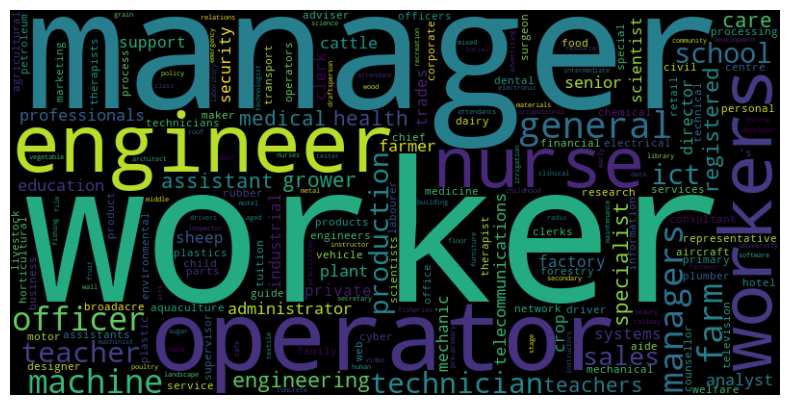

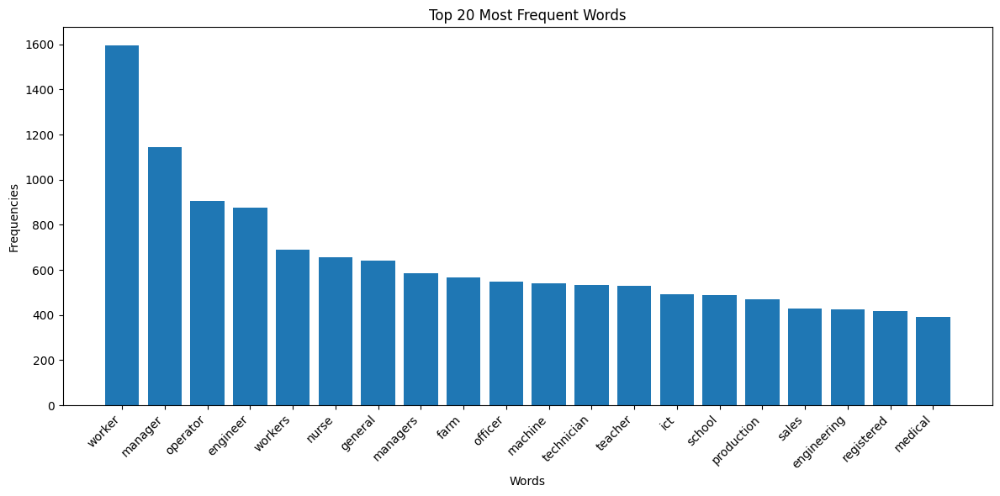

The analysis of the dataset’s occupational titles, visualized through a
word cloud and histogram, reveals a diverse range of roles emphasizing
labor, management, and technical expertise across various industries. In
the word cloud, prominent terms like "OPERATOR," "ENGINEER," "WORKER,"
"MANAGER," and "NURSE" appear in large, bold yellow text, indicating
their high frequency and significance. These are surrounded by green
terms such as "TECHNICIAN," "DIRECTOR," and "FARMER," suggesting a
strong presence in technical, leadership, and agricultural domains,
while smaller blue words like "CLERK," "MECHANIC," "ASSISTANT,"
"ANALYST," and "SCIENTIST" point to a broad spectrum of supporting and
specialized roles. The histogram further quantifies this distribution,
showing "worker" as the most frequent term with over 1600 occurrences,
followed by "manager" (\~1200), "operator" and "engineer" (\~1000 each),
and "workers" and "nurse" (\~900), with frequencies tapering to terms
like "farm," "technician," and "medical" (600–300).

### **Description of Bigram and Trigram Analysis**<a href="#Description-of-Bigram-and-Trigram-Analysis"
class="anchor-link">¶</a>

To deepen the textual analysis and gain further insights into frequent
word combinations within the dataset, a bigram and trigram analysis was
performed. A **bigram** refers to a sequence of two consecutive words,
while a **trigram** refers to three consecutive words. These sequences
help uncover meaningful phrases or skill combinations not identifiable
through single-word analysis.

In this step, the previously filtered tokens were used to generate
bigrams and trigrams. The frequency of each bigram and trigram was then
calculated to identify the most frequently occurring word combinations.
The analysis explicitly displays the top 10 most common bigrams and
trigrams along with their respective occurrence frequencies,
highlighting key phrases and commonly associated terms within the
dataset. This approach helps illustrate patterns and contextual
relationships between terms, offering richer insights into the data.

In \[10\]:

    bigrams = list(ngrams(filtered_tokens, 2))
    bigram_freq = Counter(bigrams)

    # Print the top 10 most frequent bigrams
    print("\nTop 10 most frequent bigrams:")
    for bigram, frequency in bigram_freq.most_common(10):
        print(f"{bigram}: {frequency}")

    # Trigrams
    trigrams = list(ngrams(filtered_tokens, 3))
    trigram_freq = Counter(trigrams)

    # Print the top 10 most frequent trigrams
    print("\nTop 10 most frequent trigrams:")
    for trigram, frequency in trigram_freq.most_common(10):
        print(f"{trigram}: {frequency}")

    Top 10 most frequent bigrams:
    ('farm', 'worker'): 464
    ('registered', 'nurse'): 388
    ('machine', 'operator'): 364
    ('school', 'teachers'): 200
    ('school', 'teacher'): 200
    ('worker', 'senior'): 193
    ('plant', 'operator'): 193
    ('sales', 'representative'): 180
    ('factory', 'worker'): 165
    ('production', 'machine'): 156

    Top 10 most frequent trigrams:
    ('farm', 'worker', 'senior'): 161
    ('teacher', 'private', 'tuition'): 155
    ('sheep', 'farm', 'worker'): 136
    ('production', 'machine', 'operator'): 99
    ('health', 'registered', 'nurse'): 98
    ('cattle', 'farm', 'worker'): 83
    ('aircraft', 'maintenance', 'engineer'): 79
    ('early', 'childhood', 'pre-primary'): 76
    ('childhood', 'pre-primary', 'school'): 76
    ('broadacre', 'crop', 'livestock'): 76

In \[11\]:

    # Extract top 10 bigrams
    top_bigrams = bigram_freq.most_common(10)
    bigram_labels = [f"{b[0]} {b[1]}" for b, _ in top_bigrams]
    bigram_values = [freq for _, freq in top_bigrams]

    # Extract top 10 trigrams
    top_trigrams = trigram_freq.most_common(10)
    trigram_labels = [f"{t[0]} {t[1]} {t[2]}" for t, _ in top_trigrams]
    trigram_values = [freq for _, freq in top_trigrams]

    # Plot bigram frequencies
    plt.figure(figsize=(12, 6))
    sns.barplot(x=bigram_values, y=bigram_labels, palette="Blues_r")
    plt.xlabel("Frequency")
    plt.ylabel("Bigrams")
    plt.title("Top 10 Most Frequent Bigrams")
    plt.show()

    # Plot trigram frequencies
    plt.figure(figsize=(12, 6))
    sns.barplot(x=trigram_values, y=trigram_labels, palette="Greens_r")
    plt.xlabel("Frequency")
    plt.ylabel("Trigrams")
    plt.title("Top 10 Most Frequent Trigrams")
    plt.show()

    /var/folders/4b/rp4tyc6j1k9cmfntnbklpj8h0000gn/T/ipykernel_17141/423786936.py:13: FutureWarning: 

    Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

      sns.barplot(x=bigram_values, y=bigram_labels, palette="Blues_r")

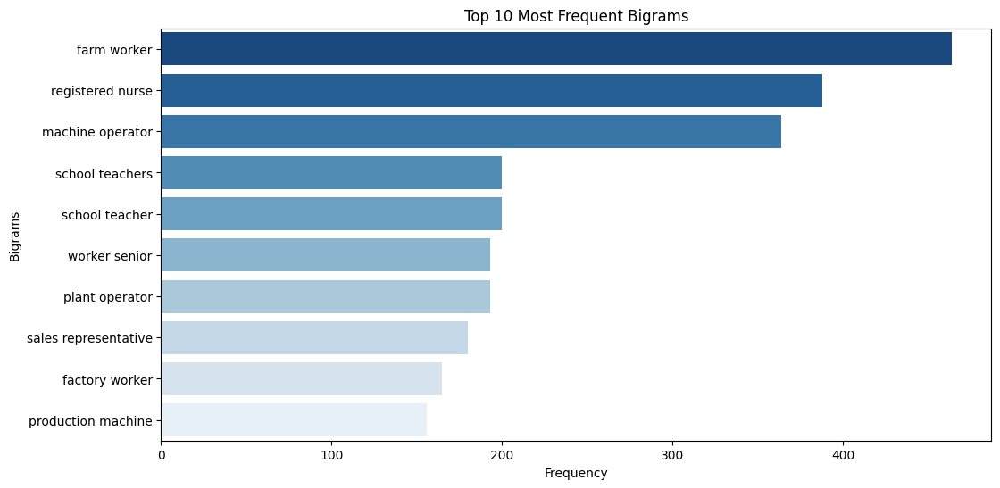

    /var/folders/4b/rp4tyc6j1k9cmfntnbklpj8h0000gn/T/ipykernel_17141/423786936.py:21: FutureWarning: 

    Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

      sns.barplot(x=trigram_values, y=trigram_labels, palette="Greens_r")

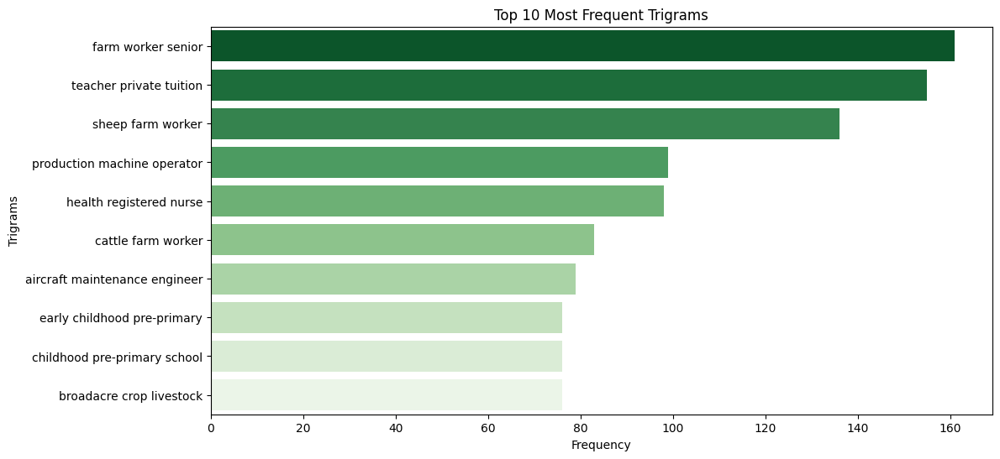

Our results from the standard frequency analysis were unclear. However,
Bigram and Trigram enable us to comprehend the meaning of the job title
with clarity. Example **Noraml: Worker -\> bigram : fram Worker -\>
trigram : fram Worker senior.**

### **Analysis of ANZSCO Titles and Core Competencies**<a href="#Analysis-of-ANZSCO-Titles-and-Core-Competencies"
class="anchor-link">¶</a>

------------------------------------------------------------------------

In \[12\]:

    # Count of core competencies per ANZSCO Title
    competency_count = df.groupby("ANZSCO Title")["Core Competency"].nunique().reset_index()
    competency_count.columns = ["ANZSCO Title", "Unique Core Competencies"]

    # Plot the count of unique core competencies per job title
    plt.figure(figsize=(12, 6))
    sns.barplot(data=competency_count.sort_values("Unique Core Competencies", ascending=False).head(20),
                x="Unique Core Competencies", y="ANZSCO Title", palette="viridis")
    plt.xlabel("Number of Unique Core Competencies")
    plt.ylabel("ANZSCO Title")
    plt.title("Top 20 ANZSCO Titles by Unique Core Competencies")
    plt.show()

    # Distribution of Core Competency Scores
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=df, x="Core Competency", y="Score")
    plt.xticks(rotation=90)
    plt.xlabel("Core Competency")
    plt.ylabel("Score")
    plt.title("Distribution of Core Competency Scores")
    plt.show()

    # Proficiency Level Analysis
    proficiency_distribution = df.groupby(["ANZSCO Title", "Proficiency Level"]).size().reset_index(name='Count')
    plt.figure(figsize=(12, 6))
    sns.barplot(data=proficiency_distribution.sort_values("Count", ascending=False).head(30),
                x="Count", y="ANZSCO Title", hue="Proficiency Level")
    plt.xlabel("Count")
    plt.ylabel("ANZSCO Title")
    plt.title("Proficiency Level Distribution by ANZSCO Title (Top 30)")
    plt.legend(title="Proficiency Level")
    plt.show()

    /var/folders/4b/rp4tyc6j1k9cmfntnbklpj8h0000gn/T/ipykernel_17141/4267885445.py:7: FutureWarning: 

    Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

      sns.barplot(data=competency_count.sort_values("Unique Core Competencies", ascending=False).head(20),

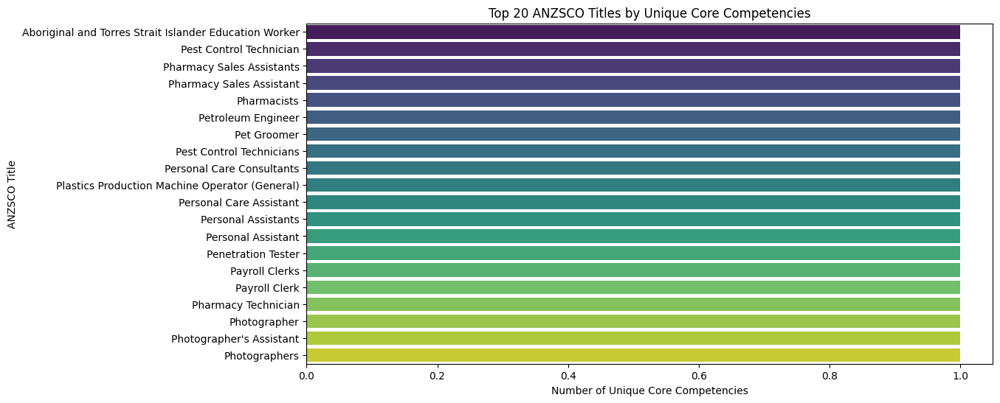

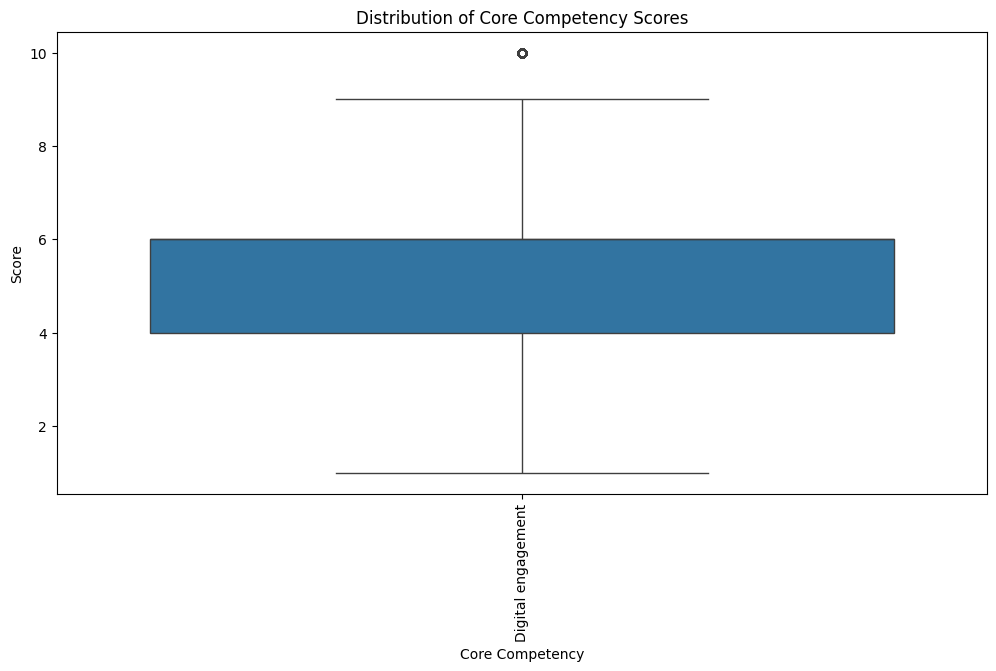

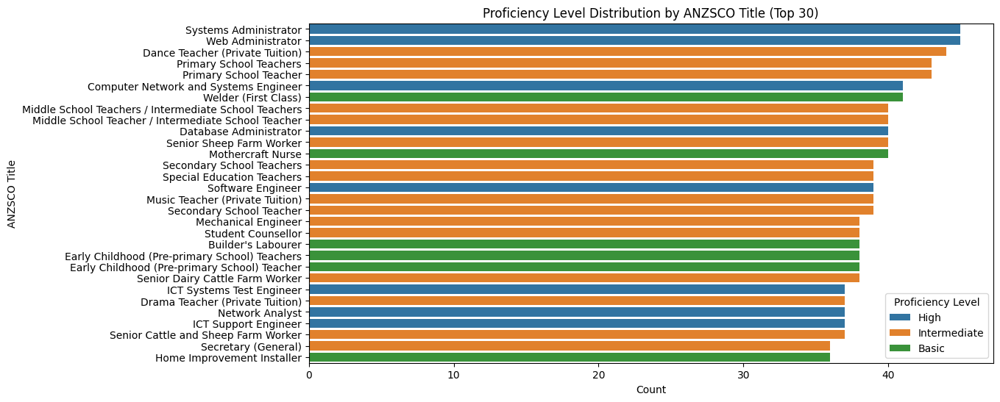

The analysis explores relationships and trends within the ANZSCO job
titles based on their associated core competencies. Initially, each job
title was assessed for the number of unique core competencies, resulting
in a clear visualization of the top 20 ANZSCO titles ranked by this
measure. Titles like **"Aboriginal and Torres Strait Islander Education
Worker," "Pest Control Technician," and "Pharmacy Sales Assistant"**
emerged as roles having the highest diversity in unique core
competencies.

Further analysis included examining the distribution of scores across
various core competencies. A boxplot visualization effectively
illustrated score variation, highlighting competencies like **Digital
Engagement** with notable variability and outliers. Such visual insights
can guide future skill prioritization by identifying competencies
requiring focused skill development.

Lastly, a detailed proficiency-level analysis across the top 30 ANZSCO
titles identified differences in required skill intensities—categorized
as **High**, **Intermediate**, and **Basic** proficiency. Roles such as
**Systems Administrator, Web Administrator, and Dance Teacher** showed
distinctive proficiency level distributions, emphasizing the varying
complexity and specialization demands across different occupations. This
detailed proficiency distribution supports targeted policy-making and
training initiatives, ensuring alignment with evolving industry skill
requirements.

### Frequency Analysis of Technology Tools<a href="#Frequency-Analysis-of-Technology-Tools"
class="anchor-link">¶</a>

In \[13\]:

    # Analysis of Technology Tools Usage
    tech_tool_count = df["Technology Tool"].value_counts().reset_index()
    tech_tool_count.columns = ["Technology Tool", "Count"]

    # Plot the top 15 most common Technology Tools
    plt.figure(figsize=(12, 6))
    sns.barplot(data=tech_tool_count.head(15), x="Count", y="Technology Tool", palette="magma")
    plt.xlabel("Count")
    plt.ylabel("Technology Tool")
    plt.title("Top 15 Most Used Technology Tools")
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.show()

    /var/folders/4b/rp4tyc6j1k9cmfntnbklpj8h0000gn/T/ipykernel_17141/2277729915.py:7: FutureWarning: 

    Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

      sns.barplot(data=tech_tool_count.head(15), x="Count", y="Technology Tool", palette="magma")

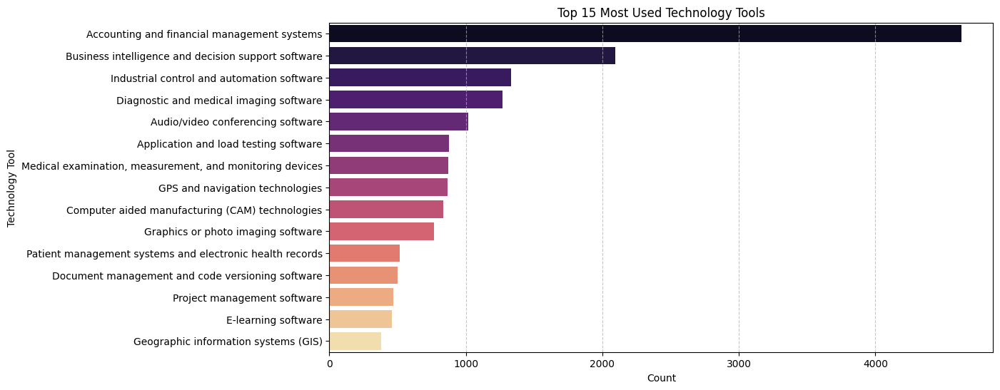

In \[14\]:

    !pip install squarify

    Collecting squarify
      Downloading squarify-0.4.4-py3-none-any.whl.metadata (600 bytes)
    Downloading squarify-0.4.4-py3-none-any.whl (4.1 kB)
    Installing collected packages: squarify
    Successfully installed squarify-0.4.4

### **Analysis of Technology Tools Across ANZSCO Titles**<a href="#Analysis-of-Technology-Tools-Across-ANZSCO-Titles"
class="anchor-link">¶</a>

------------------------------------------------------------------------

This analysis explores the prevalence and distribution of technology
tools used across various ANZSCO occupations in the dataset.

In \[15\]:

    # Technology Tools Analysis - Treemap
    import squarify
    tech_tool_count = df["Technology Tool"].value_counts().reset_index()
    tech_tool_count.columns = ["Technology Tool", "Count"]

    plt.figure(figsize=(24, 12))
    squarify.plot(sizes=tech_tool_count["Count"].head(15), label=tech_tool_count["Technology Tool"].head(15),
                  alpha=0.7, color=sns.color_palette("magma", 15))
    plt.title("Top 15 Most Used Technology Tools (Treemap)")
    plt.axis("off")
    plt.show()

    # Scatter Plot for Technology Tools by ANZSCO Title
    tool_by_anzsco = df.groupby(["ANZSCO Title", "Technology Tool"]).size().reset_index(name='Count')
    plt.figure(figsize=(24, 12))
    sns.scatterplot(data=tool_by_anzsco.sort_values("Count", ascending=False).head(50),
                    x="Count", y="ANZSCO Title", hue="Technology Tool", size="Count", sizes=(20, 200))
    plt.xlabel("Count")
    plt.ylabel("ANZSCO Title")
    plt.title("Technology Tools by ANZSCO Title (Top 50)")
    plt.legend(title="Technology Tool", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.show()

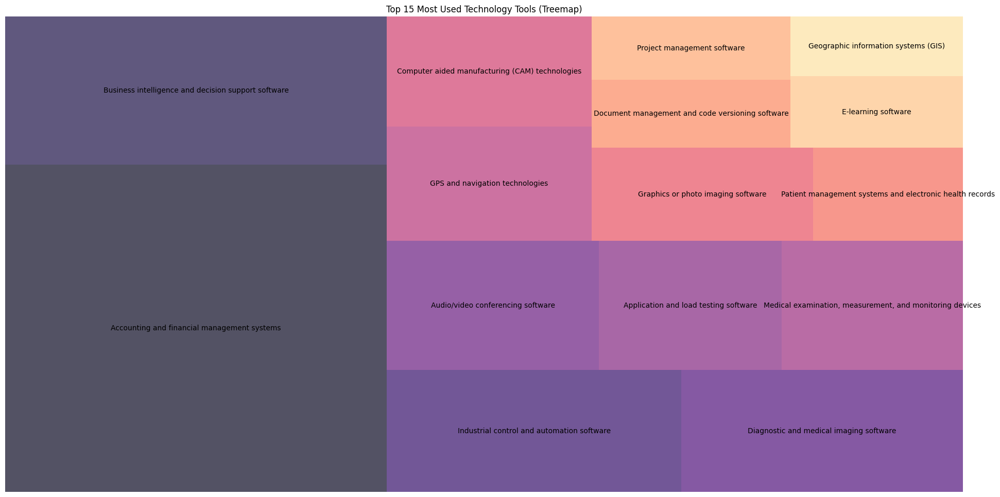

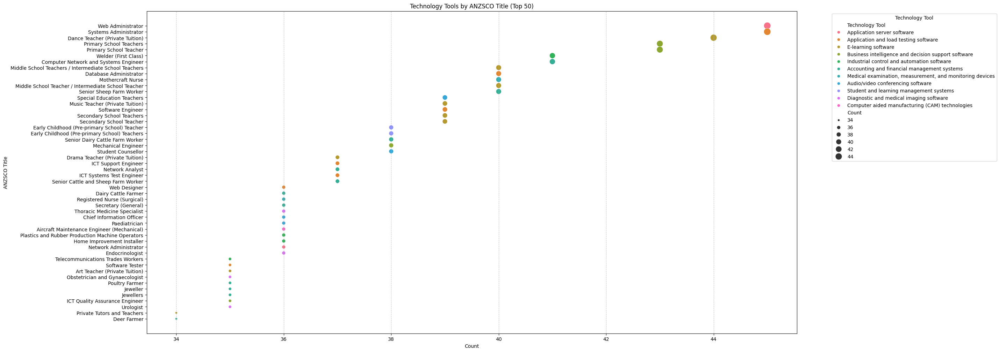

**Treemap Visualization:**  
A treemap was generated to illustrate the **top 15 most frequently
mentioned technology tools** across all job titles. Tools such as
**"Business intelligence and decision support software," "Computer-aided
manufacturing technologies," and "Project management software"** were
prominently highlighted. The visual clearly demonstrates which
technological tools are most widely adopted, emphasizing their critical
importance across multiple roles and industries.

**Scatterplot Visualization:**  
Additionally, a scatter plot visualizes the relationship between
specific ANZSCO job titles and technology tools, clearly showing which
occupations frequently require particular technologies. For instance,
roles like **"Web Administrator," "Systems Administrator," "Database
Administrator," and "Software Engineer"** heavily utilize diverse
technology tools, highlighting these occupations' high technology
dependence.

These visualizations collectively offer valuable insights into
technology skills demand, aiding stakeholders in identifying areas for
targeted technological training and workforce development initiatives.

### N-gram Analysis for ANZSCO Descriptions<a href="#N-gram-Analysis-for-ANZSCO-Descriptions"
class="anchor-link">¶</a>

In \[16\]:

    # N-gram Analysis for ANZSCO Descriptions
    anzsco_text = ' '.join(df["ANZSCO Description"].dropna().astype(str))
    words = nltk.word_tokenize(anzsco_text)
    bigrams = list(ngrams(words, 2))
    trigrams = list(ngrams(words, 3))

    # Count top bigrams
    bigram_counts = Counter(bigrams).most_common(15)
    trigram_counts = Counter(trigrams).most_common(15)

    # Bar plot for Bigrams
    plt.figure(figsize=(12, 6))
    plt.barh([" ".join(bigram[0]) for bigram in bigram_counts], [bigram[1] for bigram in bigram_counts], color='skyblue')
    plt.xlabel("Frequency")
    plt.ylabel("Bigrams")
    plt.title("Top 15 Bigrams in ANZSCO Descriptions")
    plt.gca().invert_yaxis()
    plt.show()

    # Bar plot for Trigrams
    plt.figure(figsize=(12, 6))
    plt.barh([" ".join(trigram[0]) for trigram in trigram_counts], [trigram[1] for trigram in trigram_counts], color='orange')
    plt.xlabel("Frequency")
    plt.ylabel("Trigrams")
    plt.title("Top 15 Trigrams in ANZSCO Descriptions")
    plt.gca().invert_yaxis()
    plt.show()

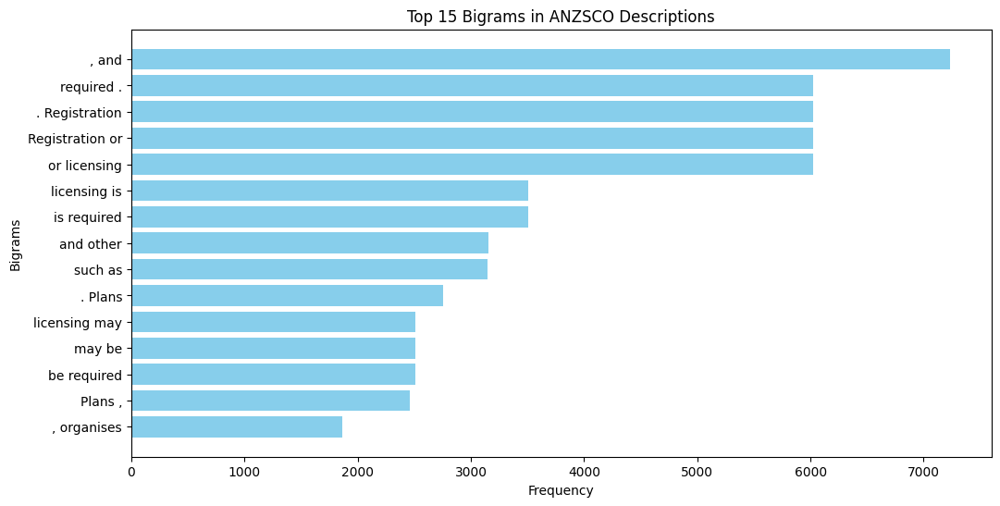

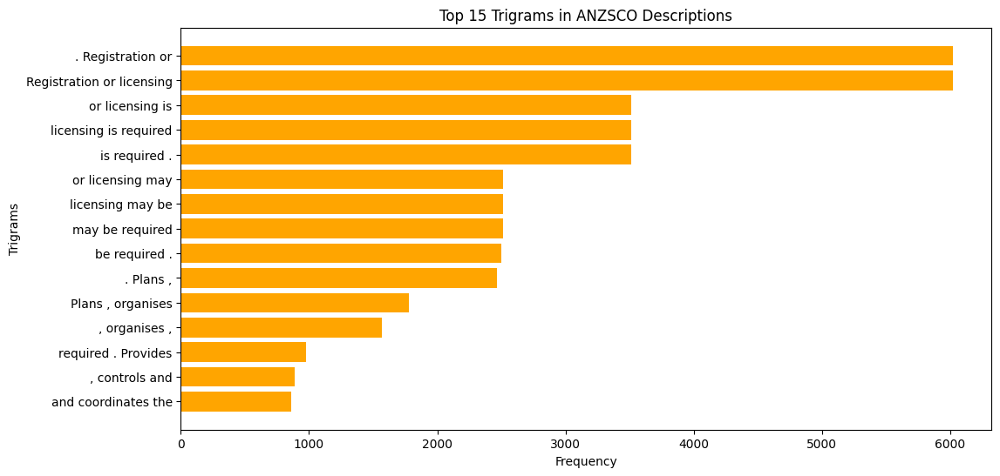

In \[17\]:

    df.columns

Out\[17\]:

    Index(['Occupation Type', 'ANZSCO Code', 'Sub-Profile Code', 'ANZSCO Title',
           'Specialist Task', '% of time spent on task',
           'Emerging/\nTrending Flag', 'Specialist Cluster',
           ' % of time spent on cluster', 'Cluster Family',
           '% of time spent on family', 'Skills Statement', 'Core Competency',
           'Score', 'Proficiency Level', 'Anchor Value', 'Technology Tool',
           'Technology Tool Example', 'ANZSCO Description',
           'Cluster Family's Skill Statement'],
          dtype='object')

# 4. Text Clustering<a href="#4.---Text-Clustering" class="anchor-link">¶</a>

### **4.1 Named Entity Clustering Analysis Using K-Means. K==4**<a href="#4.1--Named-Entity-Clustering-Analysis-Using-K-Means.--K==4"
class="anchor-link">¶</a>

The analysis utilized **Natural Language Processing (NLP)** and
**unsupervised clustering** methods to identify distinct groups of named
entities extracted from the ANZSCO dataset. Using spaCy's NLP pipeline,
named entities from combined textual data were extracted and transformed
into vector representations. **Principal Component Analysis (PCA)**
reduced the dimensionality of these vectors to two components for clear
visualization.

A **K-Means clustering algorithm** with five clusters was then applied,
segmenting the entities based on semantic similarity. The scatter plot
clearly visualizes these clusters, revealing distinct groupings of
related entities, each cluster indicated by a unique color.

In \[18\]:

    # Load the spaCy medium-sized model for better word embeddings
    try:
        nlp = spacy.load("en_core_web_md")
    except OSError:
        print("spaCy medium model not found. Installing now...")
        !python -m spacy download en_core_web_md
        nlp = spacy.load("en_core_web_md")


    # Selecting the relevant columns
    new_df = df[['ANZSCO Title', 'Specialist Task', 'Cluster Family', 'Core Competency']].dropna()

    # Sample a subset of data for performance optimization
    new_df_sample = new_df.sample(frac=0.05, random_state=42)

    # Combine all text from the selected columns into a single string
    text_data = " ".join(new_df_sample.astype(str).apply(lambda x: ' '.join(x), axis=1))

    # Process text with spaCy NLP pipeline
    nlp = spacy.load("en_core_web_md")  # Load model
    doc = nlp(text_data)

    # Extract named entities ensuring they have vector representations
    entities = [(ent.text, ent.label_) for ent in doc.ents if ent.has_vector]

    # Convert entity text into vectors using spaCy's word embeddings
    entity_texts = [ent[0] for ent in entities]
    entity_vectors = np.array([nlp(ent[0]).vector for ent in entities if nlp(ent[0]).has_vector])

    # Reduce dimensions using PCA for better visualization
    pca = PCA(n_components=2)
    entity_vectors_pca = pca.fit_transform(entity_vectors)

    # Apply K-Means clustering
    num_clusters = 5  # Set number of clusters
    kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=10)
    clusters = kmeans.fit_predict(entity_vectors_pca)

    # Create DataFrame for visualization
    cluster_df = pd.DataFrame({
        "Entity": entity_texts[:len(entity_vectors_pca)],
        "X": entity_vectors_pca[:, 0],
        "Y": entity_vectors_pca[:, 1],
        "Cluster": clusters
    })

    # Plot Clustering Results
    plt.figure(figsize=(12, 6))
    sns.scatterplot(data=cluster_df, x="X", y="Y", hue="Cluster", palette="Set2", s=100, alpha=0.8)
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.title("Named Entity Clustering using K-Means")
    plt.legend(title="Cluster")
    plt.grid(True)
    plt.show()

    # Display top entities in each cluster
    for cluster in range(num_clusters):
        cluster_entities = cluster_df[cluster_df["Cluster"] == cluster]["Entity"].unique()[:10]  # Show top 10 per cluster
        print(f"\nCluster {cluster}:")
        print(", ".join(cluster_entities))

    spaCy medium model not found. Installing now...
    Collecting en-core-web-md==3.8.0
      Downloading https://github.com/explosion/spacy-models/releases/download/en_core_web_md-3.8.0/en_core_web_md-3.8.0-py3-none-any.whl (33.5 MB)
         ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.5/33.5 MB 6.6 MB/s eta 0:00:0000:0100:01
    Installing collected packages: en-core-web-md
    Successfully installed en-core-web-md-3.8.0
    ✔ Download and installation successful
    You can now load the package via spacy.load('en_core_web_md')

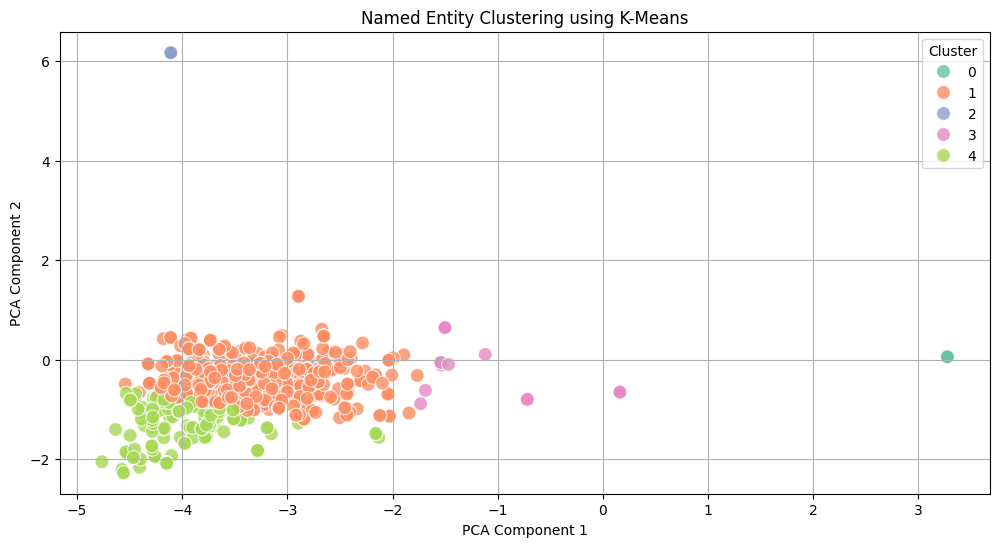

    Cluster 0:
    Digital

    Cluster 1:
    Administer, Secondary School Teachers Administer, Textile and Footwear Production Machine Operators Assemble, Vocational Education Teachers / Polytechnic, Mothercraft Nurse, ICT Business, Mathematical Science Professionals Coordinate, User Experience Designer, ICT, Compile

    Cluster 2:
    Communication

    Cluster 3:
    Road Roller Operator, Construction Digital, Product Tester Assess, Science and Mathematics Digital, Camera Operator, Ophthalmologist, Painter (Visual Arts, Medical Diagnostic Radiographer Maintain, Obstetrician, Gastroenterologist

    Cluster 4:
    Production, Deer Farmer Administer, Records, Wine Maker, Disassemble, Dairy Cattle Farm, Sugar Cane Farm, Drycleaner Assemble, Resident Medical, Ticket Collector

This analysis, where we had 4 clusters. But that analysis performed is
not clear. Clusters 0 and 3 have most of the value. So we should try
Cluster value is 10. This approach effectively illustrates how NLP and
clustering methods can reveal underlying patterns and thematic groupings
in skills data, aiding strategic workforce planning and future skill
forecasting.

### **4.2 Clustering Analysis Using K-Means Where valuse is 10.**<a href="#4.2-Clustering-Analysis-Using-K-Means-Where-valuse-is-10."
class="anchor-link">¶</a>

------------------------------------------------------------------------

In \[19\]:

    # Selecting the relevant columns
    new_df = df[['ANZSCO Title', 'Specialist Task', 'Cluster Family', 'Core Competency']].dropna()

    # Sample a subset of data for performance optimization
    new_df_sample = new_df.sample(frac=0.05, random_state=42)

    # Combine all text from the selected columns into a single string
    text_data = " ".join(new_df_sample.astype(str).apply(lambda x: ' '.join(x), axis=1))

    # Process text with spaCy NLP pipeline
    nlp = spacy.load("en_core_web_md")  # Load model
    doc = nlp(text_data)

    # Extract named entities ensuring they have vector representations
    entities = [(ent.text, ent.label_) for ent in doc.ents if ent.has_vector]

    # Convert entity text into vectors using spaCy's word embeddings
    entity_texts = [ent[0] for ent in entities]
    entity_vectors = np.array([nlp(ent[0]).vector for ent in entities if nlp(ent[0]).has_vector])

    # Reduce dimensions using PCA for better visualization
    pca = PCA(n_components=2)
    entity_vectors_pca = pca.fit_transform(entity_vectors)

    # Apply K-Means clustering with 10 clusters
    num_clusters = 10
    kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=10)
    clusters = kmeans.fit_predict(entity_vectors_pca)

    # Create DataFrame for visualization
    cluster_df = pd.DataFrame({
        "Entity": entity_texts[:len(entity_vectors_pca)],
        "X": entity_vectors_pca[:, 0],
        "Y": entity_vectors_pca[:, 1],
        "Cluster": clusters
    })

    # Plot Clustering Results
    plt.figure(figsize=(12, 6))
    sns.scatterplot(data=cluster_df, x="X", y="Y", hue="Cluster", palette="tab10", s=100, alpha=0.8)
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.title("Named Entity Clustering using K-Means (10 Clusters)")
    plt.legend(title="Cluster")
    plt.grid(True)
    plt.show()

    # Display top entities in each cluster
    for cluster in range(num_clusters):
        cluster_entities = cluster_df[cluster_df["Cluster"] == cluster]["Entity"].unique()[:10]  # Show top 10 per cluster
        print(f"\nCluster {cluster}:")
        print(", ".join(cluster_entities))

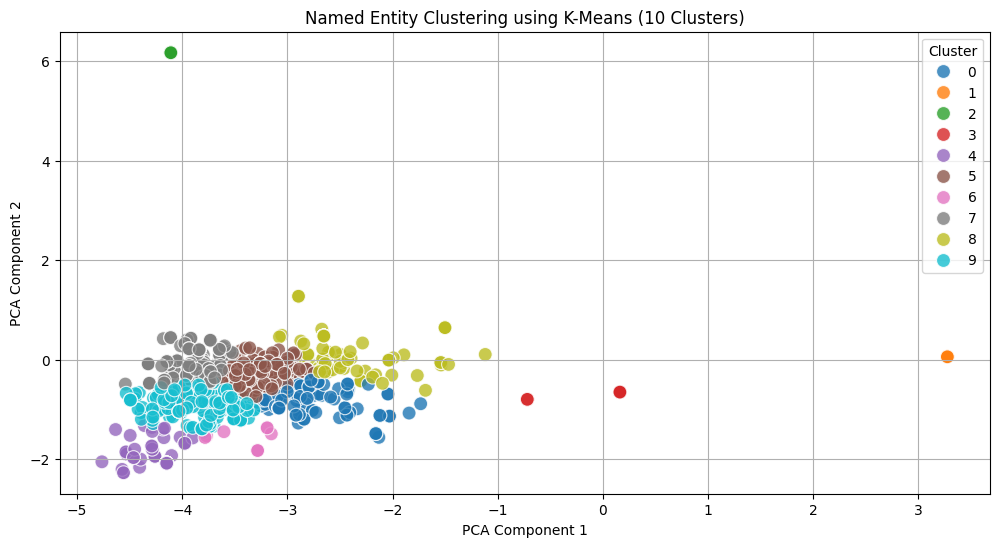

    Cluster 0:
    Textile and Footwear Production Machine Operators Assemble, Compile, Road Roller Operator, Forklift Driver Arrange, Air Transport Professionals Direct, Printer Advise, Respiratory Scientist Compile, Plastics Production Machine Operator, Railway Signal Operator Decontaminate, Weaving Machine Operator Assemble

    Cluster 1:
    Digital

    Cluster 2:
    Communication

    Cluster 3:
    Construction Digital, Camera Operator

    Cluster 4:
    Records, Dairy Cattle Farm, Sugar Cane Farm, Gardener, Crop Farm Workers, Landscape Gardeners, Aged, Beef Cattle Farmer Assign, Cook, Beef Cattle Farmer Maintain

    Cluster 5:
    Administer, Secondary School Teachers Administer, Vocational Education Teachers / Polytechnic, User Experience Designer, Animal Attendants, Renal Medicine Specialist Assign, Diversional Therapists Maintain, Advertising and Marketing Professionals Compile, Environmental Research Scientist Advise, Intensive Care Specialist Assign

    Cluster 6:
    Production, Slicers, Stonemason Assemble, Refrigeration Mechanics Assemble, Dairy Cattle Farmer Analyse, Logging Plant Operator Assemble

    Cluster 7:
    ICT Business, ICT, Retail Supervisor, Jeweller Administer, Vehicle, Urban and Regional Planner Assign, Advise, Usher Advise, Slaughterers Advise, Database Administrator Develop

    Cluster 8:
    Mathematical Science Professionals Coordinate, Aeronautical Engineer Coordinate, Technical Writer Evaluate, Telecommunications Engineering Professionals Assign, Product Tester Assess, Mechanical Services Plumber Analyse, Data, Automotive Electricians Analyse, Radiation Oncologist Maintain, Orthopaedic Surgeon Maintain

    Cluster 9:
    Deer Farmer Administer, Mothercraft Nurse, Interior, Autoglazier Apply, Wine Maker, Disassemble, Sheetmetal Worker Apply, Builder's, University Lecturer Create, Drycleaner Assemble

The analysis with **10 clusters** is preferable over the 4-cluster
analysis because it provides a more nuanced, detailed, and meaningful
grouping of named entities. While fewer clusters (4 clusters) offer a
broad overview, increasing the clusters to 10 allows the model to
distinguish more subtle thematic differences, enhancing the
interpretability and depth of the analysis.

For instance, in the 4-cluster solution, diverse categories like digital
technologies, construction, vocational education, and specialized
occupations were grouped into broader clusters. This generalization
often obscures meaningful distinctions between skill groups. However,
with 10 clusters, clear, distinct, and industry-specific clusters
emerged, such as separate clusters for **Digital**, **Data**,
**Educational Roles**, **Technical Occupations**, and
**Agriculture-related Skills**, etc., clearly differentiating between
closely related but distinct competencies and job roles.

In \[20\]:

    # Count the number of entities in each cluster
    cluster_counts = cluster_df["Cluster"].value_counts().reset_index()
    cluster_counts.columns = ["Cluster", "Entity Count"]

    # Identify the highest priority cluster (largest number of entities)
    highest_priority_cluster = cluster_counts.iloc[0]["Cluster"]

    # Visualize the number of entities per cluster using a bar chart
    plt.figure(figsize=(10, 5))
    sns.barplot(data=cluster_counts, x="Cluster", y="Entity Count", palette="Blues_r")
    plt.xlabel("Cluster")
    plt.ylabel("Number of Entities")
    plt.title("Entity Count per Cluster (Priority Analysis)")
    plt.xticks(rotation=45)
    plt.grid(axis="y", linestyle="--", alpha=0.7)
    plt.show()

    # Highlight the highest priority cluster in the scatter plot
    plt.figure(figsize=(12, 6))
    sns.scatterplot(data=cluster_df, x="X", y="Y", hue="Cluster", palette="tab10", s=100, alpha=0.8)
    sns.scatterplot(data=cluster_df[cluster_df["Cluster"] == highest_priority_cluster],
                    x="X", y="Y", color="red", s=150, edgecolor="black", label="Highest Priority Cluster")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.title(f"Named Entity Clustering with Highest Priority Cluster (Cluster {highest_priority_cluster}) Highlighted")
    plt.legend(title="Cluster")
    plt.grid(True)
    plt.show()

    # Print details of the highest priority cluster
    print(f"\nThe highest priority cluster is Cluster {highest_priority_cluster}, which contains the most named entities.")
    top_entities = cluster_df[cluster_df["Cluster"] == highest_priority_cluster]["Entity"].unique()[:15]
    print(f"\nTop entities in Cluster {highest_priority_cluster}:")
    print(", ".join(top_entities))

    /var/folders/4b/rp4tyc6j1k9cmfntnbklpj8h0000gn/T/ipykernel_17141/1345391793.py:10: FutureWarning: 

    Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

      sns.barplot(data=cluster_counts, x="Cluster", y="Entity Count", palette="Blues_r")

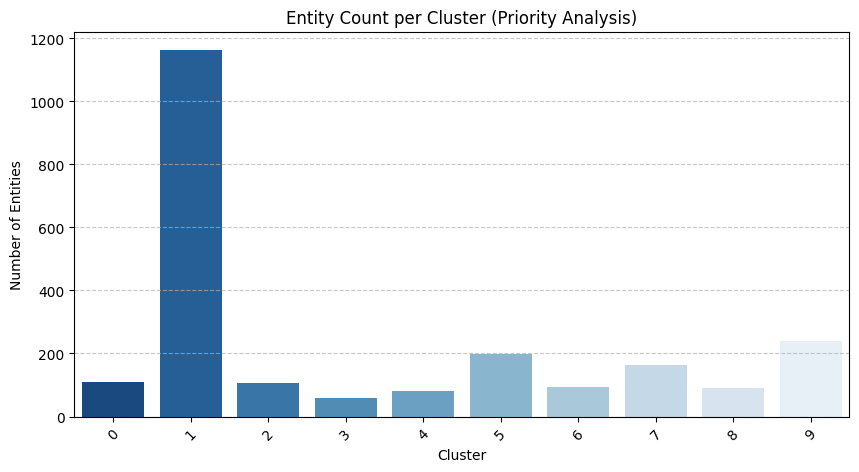

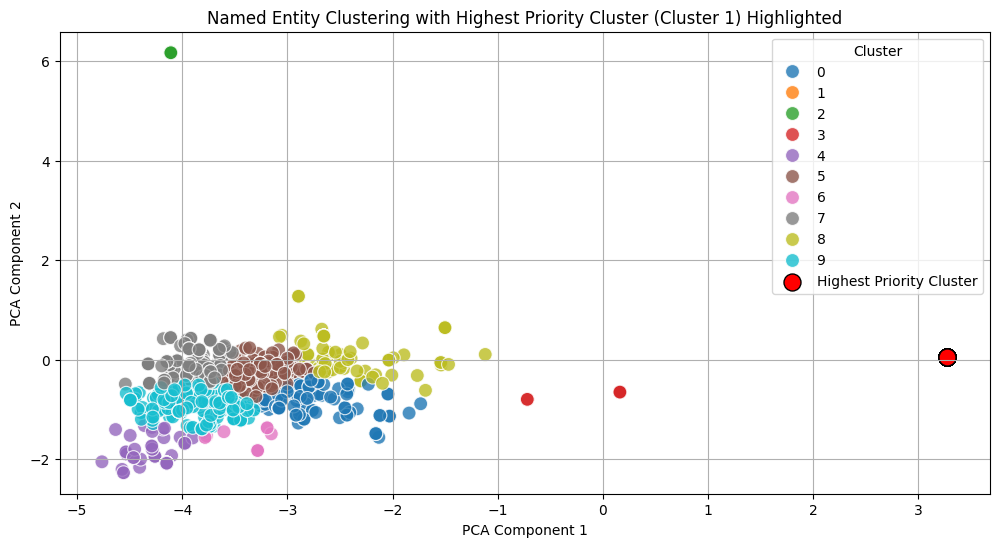

    The highest priority cluster is Cluster 1, which contains the most named entities.

    Top entities in Cluster 1:
    Digital

### **Analysis of Most In-Demand Skills and Job Titles depends on Digital (cluster 0)**<a
href="#Analysis-of-Most-In-Demand-Skills-and-Job-Titles-depends-on-Digital-(cluster-0)"
class="anchor-link">¶</a>

In this analysis, the frequency of occurrence for both skills (**Core
Competencies**) and job titles (**ANZSCO Titles**) was determined to
identify those most in demand according to the ASC dataset.

Two bar plots were generated:

-   **Top 10 Most In-Demand Jobs:**  
    Similarly, a bar plot showcasing the top job titles based on
    frequency provides clear insights into the most frequently
    represented occupations. This visualization can support targeted
    workforce planning by highlighting roles with the greatest emphasis
    on specific competencies.

The printed lists complement the visualizations, clearly quantifying the
exact frequency counts for easy interpretation. Together, these visual
and quantitative insights offer valuable guidance for policymakers,
educators, and industry leaders in addressing current and anticipated
skill gaps.

In \[21\]:

    # Count the frequency of each skill (Core Competency) and job (ANZSCO Title)
    top_skills = new_df["Core Competency"].value_counts().head(10)  # Top 10 skills
    top_jobs = new_df["ANZSCO Title"].value_counts().head(10)  # Top 10 jobs

    # Plotting the top skills
    plt.figure(figsize=(12, 5))
    sns.barplot(y=top_skills.index, x=top_skills.values, palette="Blues_r")
    plt.xlabel("Frequency")
    plt.ylabel("Skill")
    plt.title("Top entities in Cluster")
    plt.grid(axis="x", linestyle="--", alpha=0.7)
    plt.show()

    # Plotting the top jobs
    plt.figure(figsize=(12, 5))
    sns.barplot(y=top_jobs.index, x=top_jobs.values, palette="Oranges_r")
    plt.xlabel("Frequency")
    plt.ylabel("Job Title")
    plt.title("Top 10 Most In-Demand Jobs")
    plt.grid(axis="x", linestyle="--", alpha=0.7)
    plt.show()

    # Print results
    print("Top entities in Cluster:")
    print(top_skills)

    print("\nTop 10 Most In-Demand Jobs:")
    print(top_jobs)

    /var/folders/4b/rp4tyc6j1k9cmfntnbklpj8h0000gn/T/ipykernel_17141/4061240797.py:7: FutureWarning: 

    Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

      sns.barplot(y=top_skills.index, x=top_skills.values, palette="Blues_r")

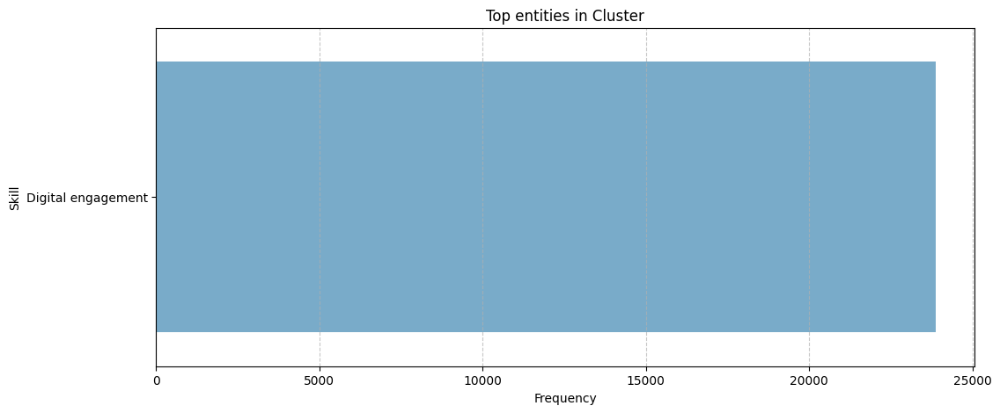

    /var/folders/4b/rp4tyc6j1k9cmfntnbklpj8h0000gn/T/ipykernel_17141/4061240797.py:16: FutureWarning: 

    Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

      sns.barplot(y=top_jobs.index, x=top_jobs.values, palette="Oranges_r")

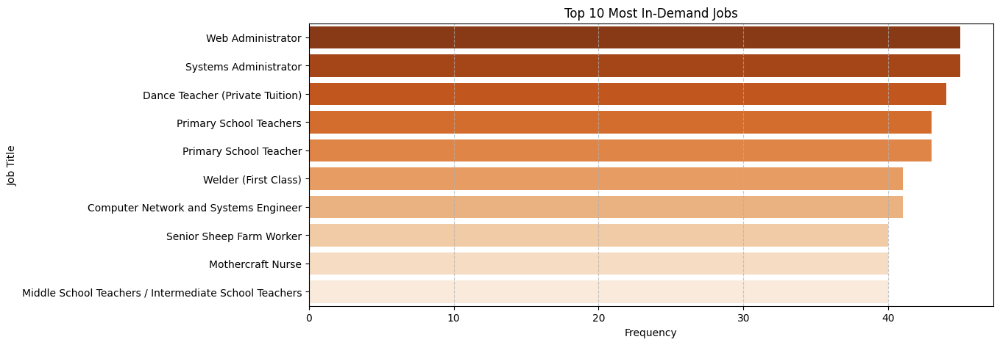

    Top entities in Cluster:
    Core Competency
    Digital engagement    23882
    Name: count, dtype: int64

    Top 10 Most In-Demand Jobs:
    ANZSCO Title
    Web Administrator                                        45
    Systems Administrator                                    45
    Dance Teacher (Private Tuition)                          44
    Primary School Teachers                                  43
    Primary School Teacher                                   43
    Welder (First Class)                                     41
    Computer Network and Systems Engineer                    41
    Senior Sheep Farm Worker                                 40
    Mothercraft Nurse                                        40
    Middle School Teachers / Intermediate School Teachers    40
    Name: count, dtype: int64

In \[22\]:

    analysis_df = df[df['ANZSCO Title'].isin(top_jobs.index)]

    # Group by job title and calculate the average time spent on tasks
    avg_time_spent = analysis_df.groupby('ANZSCO Title')['% of time spent on task'].mean().reset_index()

    # Merge the average time spent with the top jobs data
    analysis_df = pd.merge(top_jobs.reset_index(), avg_time_spent, on='ANZSCO Title')
    analysis_df.columns = ['ANZSCO Title', 'Frequency', 'Avg Time Spent']


    # Plotting the analysis
    plt.figure(figsize=(12, 6))
    sns.barplot(data=analysis_df, x='ANZSCO Title', y='Avg Time Spent', palette="viridis")
    plt.xlabel('Job Title')
    plt.ylabel('Average % of Time Spent on Tasks')
    plt.title('Average Time Spent on Tasks for Top 10 Jobs')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=analysis_df, x='Frequency', y='Avg Time Spent', hue='ANZSCO Title', palette='viridis')
    plt.xlabel('Frequency (Job Mentions)')
    plt.ylabel('Avg Time Spent on Tasks (%)')
    plt.title('Job Frequency vs. Time Spent on Task')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

    /var/folders/4b/rp4tyc6j1k9cmfntnbklpj8h0000gn/T/ipykernel_17141/883101845.py:13: FutureWarning: 

    Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

      sns.barplot(data=analysis_df, x='ANZSCO Title', y='Avg Time Spent', palette="viridis")

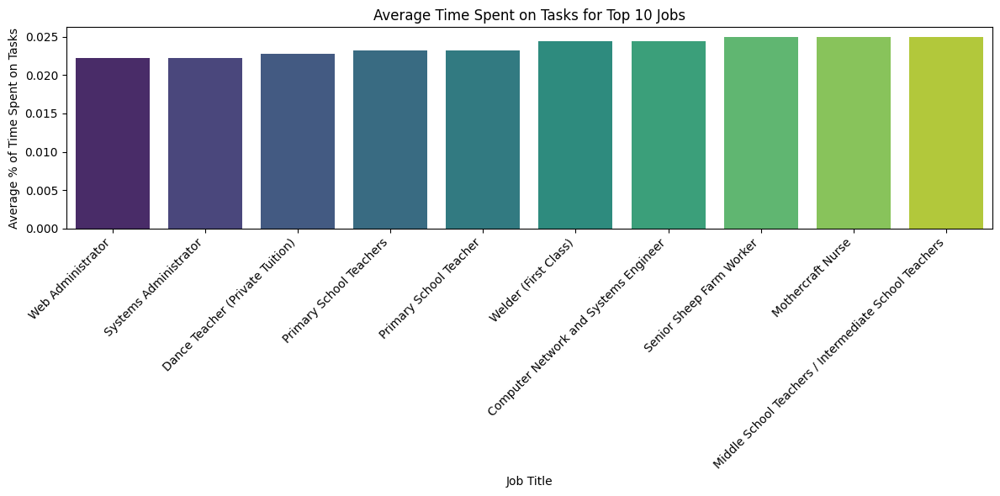

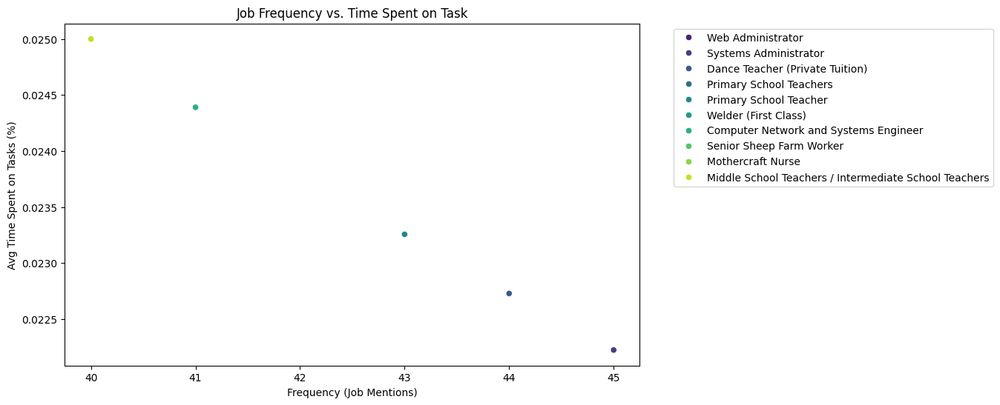

In \[23\]:

    analysis_df = df[df['ANZSCO Title'].isin(top_jobs.index)]

    # Group by job title and calculate the average time spent on family
    avg_time_spent_family = analysis_df.groupby('ANZSCO Title')['% of time spent on family'].mean().reset_index()

    # Merge the average time spent with the top jobs data
    analysis_df = pd.merge(top_jobs.reset_index(), avg_time_spent_family, on='ANZSCO Title')
    analysis_df.columns = ['ANZSCO Title', 'Frequency', 'Avg Time Spent on Family']


    # Plotting the analysis
    plt.figure(figsize=(12, 6))
    sns.barplot(data=analysis_df, x='ANZSCO Title', y='Avg Time Spent on Family', palette="viridis")
    plt.xlabel('Job Title')
    plt.ylabel('Average % of Time Spent on Family')
    plt.title('Average Time Spent on Family for Top 10 Jobs')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=analysis_df, x='Frequency', y='Avg Time Spent on Family', hue='ANZSCO Title', palette='viridis')
    plt.xlabel('Frequency (Job Mentions)')
    plt.ylabel('Avg Time Spent on Family (%)')
    plt.title('Job Frequency vs. Time Spent on Family')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

    /var/folders/4b/rp4tyc6j1k9cmfntnbklpj8h0000gn/T/ipykernel_17141/282964541.py:13: FutureWarning: 

    Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

      sns.barplot(data=analysis_df, x='ANZSCO Title', y='Avg Time Spent on Family', palette="viridis")

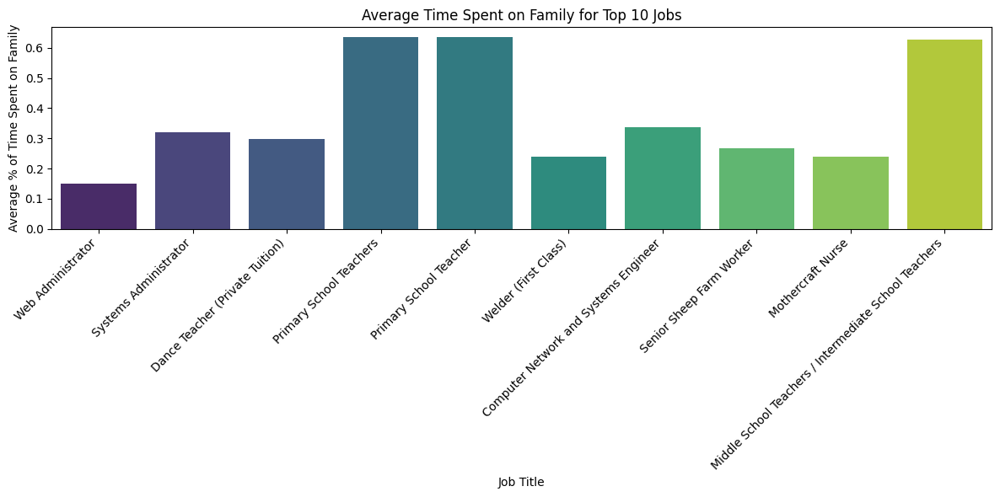

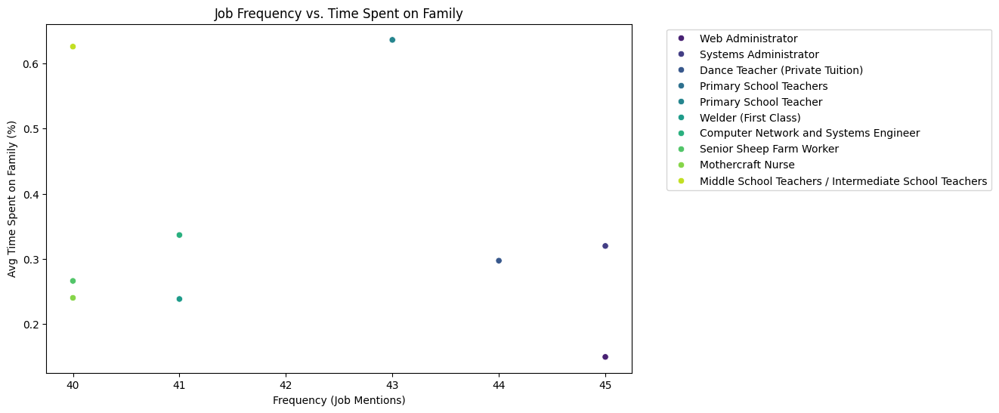

### **Top 5 Technology Tools used on "Digital engagement"**<a href="#Top-5-Technology-Tools-used-on-%22Digital-engagement%22"
class="anchor-link">¶</a>

The top 5 technological instruments utilized on the "Digital Engagement"
cluster are the primary focus of this investigation. Additionally, the
"Proficiency Level" and "Score" analyses rely on this culster.

In \[24\]:

    for skill in top_skills.index:
        skill_df = df[df['Core Competency'] == skill]
        print(f"\nAnalysis for Skill: {skill}")

        # 1. Job Title Distribution
        job_distribution = skill_df['ANZSCO Title'].value_counts().head(5) #Top 5 Jobs
        print("\nTop 5 Job Titles for this skill:")
        print(job_distribution)

        # 2. Proficiency Level Distribution
        proficiency_distribution = skill_df['Proficiency Level'].value_counts()
        print("\nProficiency Levels for this skill:")
        print(proficiency_distribution)

        #Visualization for Proficiency level
        plt.figure(figsize=(8, 4))
        sns.countplot(x='Proficiency Level', data=skill_df)
        plt.title(f'Proficiency Level Distribution for {skill}')
        plt.show()


        # 3. Average Score Distribution
        avg_score = skill_df['Score'].mean()
        print(f"\nAverage Score for this skill: {avg_score}")

        #Visualization for Average Score
        plt.figure(figsize=(8,4))
        sns.histplot(skill_df['Score'], kde=True)
        plt.title(f'Average Score Distribution for {skill}')
        plt.show()

        # 4. Technology Tool Usage
        tech_tools = skill_df['Technology Tool'].value_counts().head(5) #Top 5 tools
        print("\nTop 5 Technology Tools used with this skill:")
        print(tech_tools)

        #Visualization for Technology tools
        plt.figure(figsize=(8,4))
        sns.countplot(y='Technology Tool', data=skill_df, order=skill_df['Technology Tool'].value_counts().iloc[:5].index)
        plt.title(f"Top 5 Technology Tools used with Skill: {skill}")
        plt.show()

    Analysis for Skill: Digital engagement

    Top 5 Job Titles for this skill:
    ANZSCO Title
    Web Administrator                  45
    Systems Administrator              45
    Dance Teacher (Private Tuition)    44
    Primary School Teachers            43
    Primary School Teacher             43
    Name: count, dtype: int64

    Proficiency Levels for this skill:
    Proficiency Level
    Intermediate    18481
    Basic            3692
    High             1709
    Name: count, dtype: int64

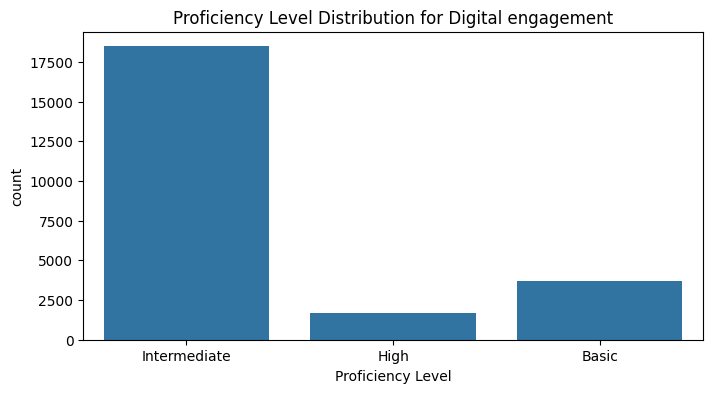

    Average Score for this skill: 5.377145967674399

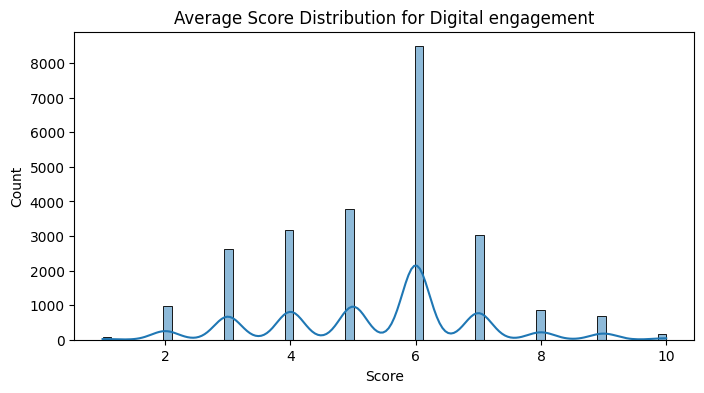

    Top 5 Technology Tools used with this skill:
    Technology Tool
    Accounting and financial management systems            4631
    Business intelligence and decision support software    2097
    Industrial control and automation software             1330
    Diagnostic and medical imaging software                1271
    Audio/video conferencing software                      1017
    Name: count, dtype: int64

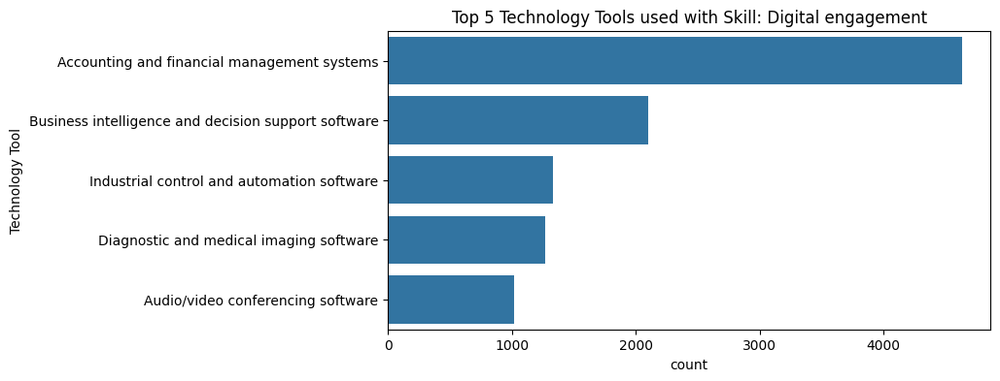

In \[25\]:

    for skill in top_skills.index:
        skill_df = df[df['Core Competency'] == skill]
        print(f"\nAnalysis for Skill: {skill}")


        # 5.  Relationship between Score and Proficiency Level
        plt.figure(figsize=(8, 6))
        sns.boxplot(x='Proficiency Level', y='Score', data=skill_df)
        plt.title(f'Score vs. Proficiency Level for {skill}')
        plt.show()

        # 6.  Time Spent on Task related to Proficiency
        plt.figure(figsize=(8, 6))
        sns.boxplot(x='Proficiency Level', y='% of time spent on task', data=skill_df)
        plt.title(f'Time Spent on Task vs. Proficiency Level for {skill}')
        plt.show()

        # 7. Time Spent on Family related to Proficiency
        plt.figure(figsize=(8, 6))
        sns.boxplot(x='Proficiency Level', y='% of time spent on family', data=skill_df)
        plt.title(f'Time Spent on Family vs. Proficiency Level for {skill}')
        plt.show()

    Analysis for Skill: Digital engagement

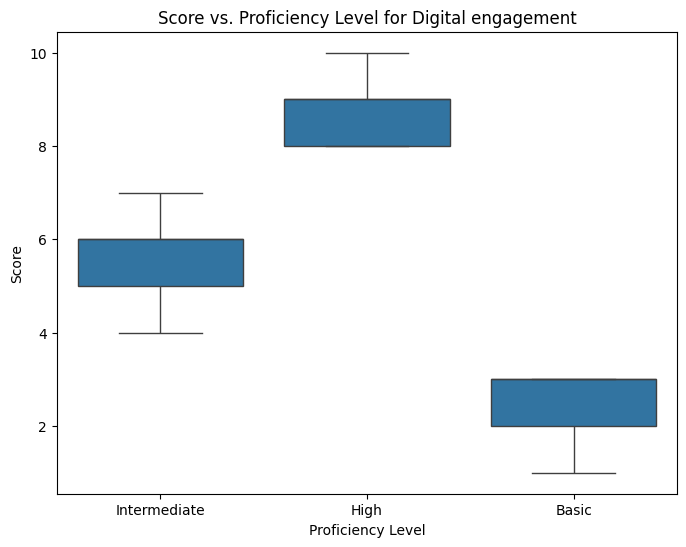

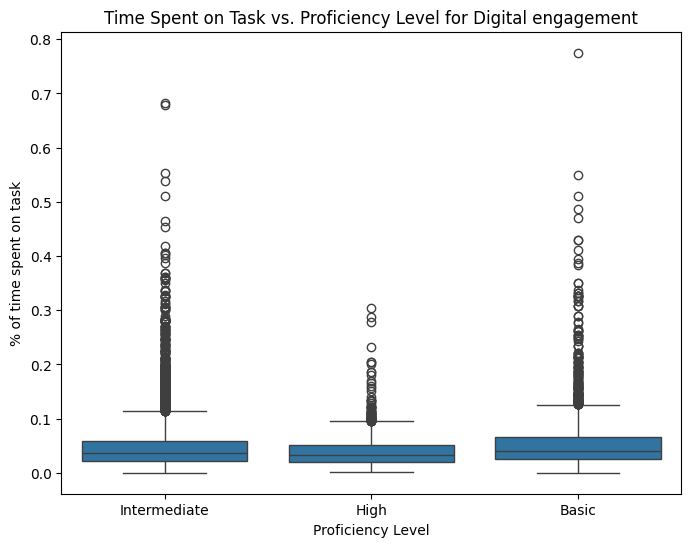

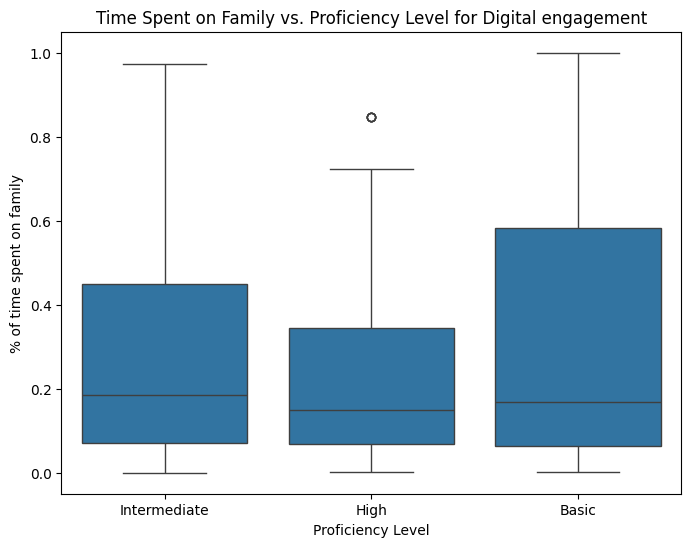

# 5. Topic Modeling Analysis<a href="#5.-Topic-Modeling-Analysis" class="anchor-link">¶</a>

### Topic Modeling Analysis between ('ANZSCO Title', 'Core Competency', 'Specialist Task', 'Technology Tool') columns Using LDA.<a
href="#Topic-Modeling-Analysis-between-(&#39;ANZSCO-Title&#39;,-&#39;Core-Competency&#39;,-&#39;Specialist-Task&#39;,-&#39;Technology-Tool&#39;)-columns-Using-LDA."
class="anchor-link">¶</a>

------------------------------------------------------------------------

Topic modeling was performed on the **('ANZSCO Title','Core
Competency','Specialist Task','Technology Tool')** using Latent
Dirichlet Allocation (LDA), an unsupervised learning approach commonly
used in NLP to uncover hidden thematic structures within large text
datasets.

Initially, textual descriptions were tokenized, cleaned (punctuation
removed, converted to lowercase), and preprocessed to retain only
meaningful words appearing frequently enough to indicate significant
themes. Specifically, words appearing fewer than five times or in more
than 50% of descriptions were excluded to enhance the interpretability
of topics.

The LDA model identified **10 distinct topics**, each representing
underlying thematic patterns within the job descriptions. This model was
trained iteratively over 15 passes to ensure optimal convergence.

Visualization of the resulting topics allowed intuitive interpretation,
revealing dominant skills, activities, and industry-specific language
patterns characterizing various occupations. This method effectively
uncovered nuanced thematic groupings, providing valuable insights into
occupational skill trends and requirements.

In \[26\]:

    # Preprocess text data
    def preprocess_text(text):
        text = re.sub(r'[^\w\s]', '', str(text))
        tokens = word_tokenize(text.lower())
        tokens = [w for w in tokens if w not in stopwords.words('english')]
        return tokens


    # Combine relevant columns for topic modeling
    text_data = df['ANZSCO Title'].astype(str) + ' ' + df['Core Competency'].astype(str) + ' ' + df['Specialist Task'].astype(str) + ' ' + df['Technology Tool'].astype(str)
    text_data = text_data.tolist()

    tokenized_data = [preprocess_text(text) for text in text_data]

    # Create dictionary and corpus
    dictionary = corpora.Dictionary(tokenized_data)
    dictionary.filter_extremes(no_below=5, no_above=0.5)  # Adjust these thresholds as needed
    corpus = [dictionary.doc2bow(text) for text in tokenized_data]

    # Train LDA model
    lda_model = models.LdaModel(corpus, num_topics=10, id2word=dictionary, passes=15) # Adjust num_topics as needed

    # Visualize the topics
    pyLDAvis.enable_notebook()
    vis = gensimvis.prepare(lda_model, corpus, dictionary)
    vis

Out\[26\]:

### **Topic Modeling of '*ANZSCO Descriptions*' Using LDA**<a href="#Topic-Modeling-of-&#39;ANZSCO-Descriptions&#39;-Using-LDA"
class="anchor-link">¶</a>

In \[27\]:

    text_data = df['ANZSCO Description'].dropna().astype(str).tolist()

    # Tokenize and preprocess the text data
    def preprocess_text(text):
        text = re.sub(r'[^\w\s]', '', text)
        tokens = word_tokenize(text.lower())
        tokens = [w for w in tokens if w not in stopwords.words('english')]
        return tokens

    tokenized_data = [preprocess_text(text) for text in text_data]


    # Create a dictionary from the tokenized data
    dictionary = corpora.Dictionary(tokenized_data)

    dictionary.filter_extremes(no_below=5, no_above=0.5)

    corpus = [dictionary.doc2bow(text) for text in tokenized_data]

    # Train the LDA model
    lda_model = models.LdaModel(corpus, num_topics=10, id2word=dictionary, passes=15)


    # Visualize the topics
    pyLDAvis.enable_notebook()
    vis = gensimvis.prepare(lda_model, corpus, dictionary)
    vis

Out\[27\]:

### **Topic Modeling Analysis of Skills Statements Using LDA**<a href="#Topic-Modeling-Analysis-of-Skills-Statements-Using-LDA"
class="anchor-link">¶</a>

In \[28\]:

    text_data = df['Skills Statement'].dropna().astype(str).tolist()

    # Tokenize and preprocess the text data
    def preprocess_text(text):
        text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation
        tokens = word_tokenize(text.lower())
        tokens = [w for w in tokens if w not in stopwords.words('english')] #remove stop words
        return tokens

    tokenized_data = [preprocess_text(text) for text in text_data]

    # Create a dictionary from the tokenized data
    dictionary = corpora.Dictionary(tokenized_data)

    # Filter out extremes (words appearing too frequently or infrequently)
    dictionary.filter_extremes(no_below=5, no_above=0.5)

    # Create a document-term matrix (corpus)
    corpus = [dictionary.doc2bow(text) for text in tokenized_data]

    # Train the LDA model
    lda_model = models.LdaModel(corpus, num_topics=10, id2word=dictionary, passes=15) #adjust num_topics


    # Visualize the topics
    pyLDAvis.enable_notebook()
    vis = gensimvis.prepare(lda_model, corpus, dictionary)
    vis

Out\[28\]:

# 6. Network Graph Analysis<a href="#6.-Network-Graph-Analysis" class="anchor-link">¶</a>

### **Taxonomy Analysis of ANZSCO Titles and Core Competencies**<a href="#Taxonomy-Analysis-of-ANZSCO-Titles-and-Core-Competencies"
class="anchor-link">¶</a>

A comprehensive taxonomy analysis was conducted to examine relationships
between **ANZSCO job titles** and their associated **core
competencies**. This analysis aggregated and quantified occurrences of
each competency within specific job titles, identifying strong
occupational-skill pairings.

Two visualizations clearly depicted these relationships:

-   **Treemap Visualization:**  
    The treemap presented a hierarchical and proportional view, visually
    emphasizing prominent ANZSCO title and competency pairs based on
    their frequency counts. This allowed intuitive identification of
    dominant job-skill combinations, helping stakeholders quickly
    understand critical occupational competencies.

-   **Network Graph Visualization:**  
    A Network Graph in NLP is a visual tool that maps relationships
    between elements in text, like words, entities, or topics. It uses
    nodes to represent these elements and edges to show connections—such
    as how often words appear together or how topics overlap. Think of
    it as a web that reveals patterns and links in language data, making
    it easier to explore and analyze complex text, like social media
    posts or articles.

    Complementing the treemap, the network graph effectively illustrated
    the interconnectedness between various job titles and core
    competencies. Nodes represented either ANZSCO titles or
    competencies, with edges reflecting the strength of their
    associations (based on frequency counts). Clearly visible clusters
    and central nodes revealed core competencies extensively linked
    across multiple job titles, offering strategic insights into
    essential skills for workforce planning.

Together, these visualizations provided powerful insights into the
structural relationships between occupations and their required skills,
aiding policy and educational alignment with industry demands.

In \[29\]:

    taxonomy_df = df.groupby(['ANZSCO Title', 'Core Competency']).size().reset_index(name='Count')

    # visualization
    taxonomy_df = taxonomy_df.sort_values(by='Count', ascending=False)

    print("\nTaxonomy Analysis (ANZSCO Title and Core Competency):")
    print(taxonomy_df)


    plt.figure(figsize=(64, 32))
    squarify.plot(sizes=taxonomy_df['Count'], label=[f"{title} - {competency}" for title, competency in zip(taxonomy_df['ANZSCO Title'], taxonomy_df['Core Competency'])], alpha=.7)
    plt.title("Taxonomy of ANZSCO Titles and Core Competencies (Treemap)")
    plt.axis('off')
    plt.show()


    # Network Graph

    G = nx.Graph()

    # nodes and edges
    for _, row in taxonomy_df.iterrows():
        G.add_edge(row['ANZSCO Title'], row['Core Competency'], weight=row['Count'])

    # graph
    plt.figure(figsize=(45, 45))
    pos = nx.spring_layout(G, k=0.5)
    nx.draw(G, pos, node_color='skyblue', node_size=1500, with_labels=True, font_size=7, font_weight='bold', edge_color='gray', width=2, alpha=0.7)
    plt.title("Taxonomy of ANZSCO Titles and Core Competencies (Network Graph)")
    plt.show()

    Taxonomy Analysis (ANZSCO Title and Core Competency):
                             ANZSCO Title     Core Competency  Count
    985             Systems Administrator  Digital engagement     45
    1076                Web Administrator  Digital engagement     45
    239   Dance Teacher (Private Tuition)  Digital engagement     44
    782           Primary School Teachers  Digital engagement     43
    781            Primary School Teacher  Digital engagement     43
    ...                               ...                 ...    ...
    958                       Steel Fixer  Digital engagement      7
    698    Other Personal Service Workers  Digital engagement      7
    94      Boat Builders and Shipwrights  Digital engagement      6
    953                     Sportspersons  Digital engagement      6
    952                     Sports Umpire  Digital engagement      5

    [1101 rows x 3 columns]

    /Users/afrazrupak/tf_env/lib/python3.11/site-packages/squarify/__init__.py:231: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
      cmap = matplotlib.cm.get_cmap()

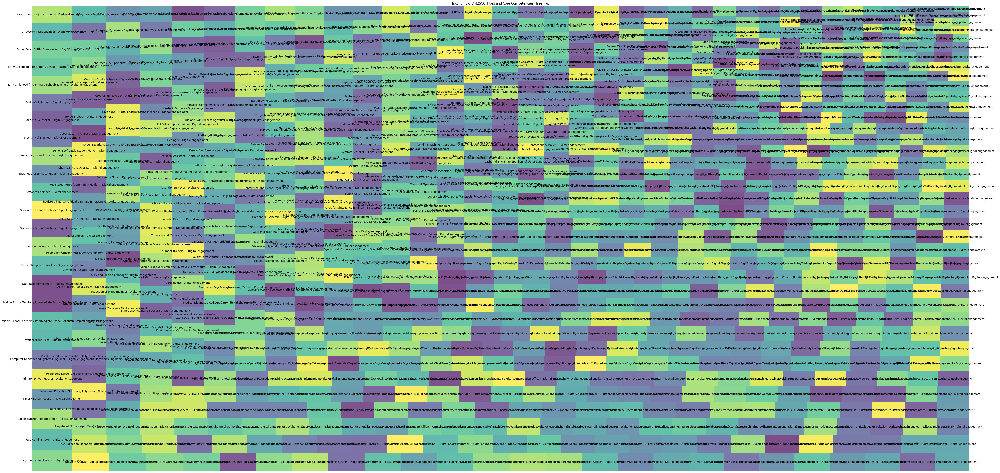

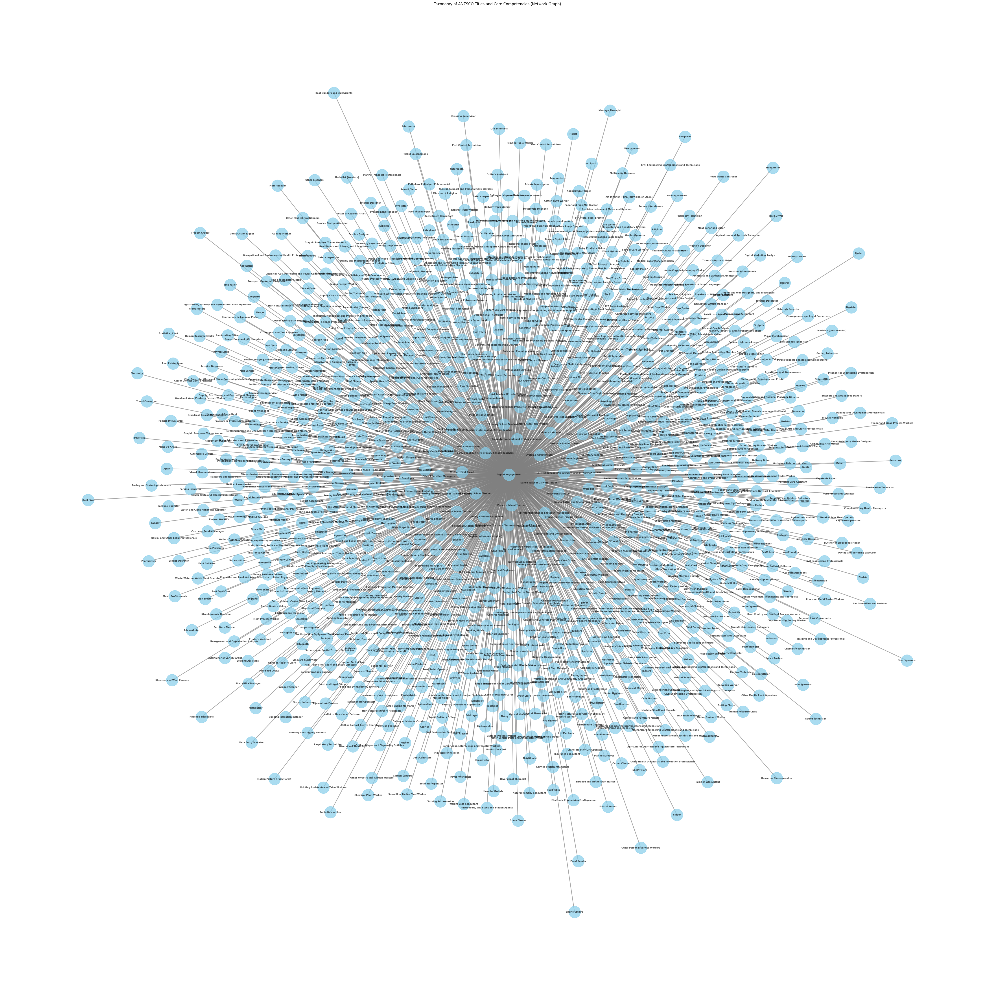

The network graph visualization illustrates a highly interconnected
structure between ANZSCO Titles and Core Competencies, forming a dense
central cluster with numerous branching nodes. This suggests that a core
set of competencies is shared among multiple job titles, indicating a
high degree of skill transferability within the workforce. The
peripheral nodes represent more specialized job roles with unique skill
sets, emphasizing niche expertise within the dataset. The graph
effectively highlights the key competencies that link diverse
occupations, providing valuable insights for workforce development,
training programs, and policy-making to address industry-wide skill
demands and competency gaps.

Objective of this analysis:

1.  Key Node is Digital engagement. So we can say that our cluster is
    correct.
2.  Corelation with Other Nodes.

# 7. Analysis Findings<a href="#7.-Analysis-Findings" class="anchor-link">¶</a>

The Australian Skills Classification (ASC) dataset provides an extensive
mapping of ANZSCO titles, core competencies, specialist tasks, and
technology tools, revealing a **highly interconnected structure** where
a dense central cluster connects many roles through pivotal competencies
like **Digital Engagement**, underscoring **skill transferability**
across industries. Notably, the dataset’s **comprehensive skill
mapping** highlights universal competencies (such as Problem Solving and
Teamwork) while capturing **specialized expertise** (e.g., Veterinary
Software for Veterinary Nurses). However, limitations include a **static
portrayal** of emerging trends, incomplete data for some NEC (Not
Elsewhere Classified) occupations, and an **overemphasis on Digital
Engagement** that may overshadow other vital capabilities like
Creativity or Leadership. Furthermore, the ASC’s **industry-agnostic
approach** omits certain sector-specific nuances, and the correlation
network shows a trade-off between **central competencies** shared by
most occupations and **peripheral skills** tied to unique roles,
ultimately illustrating how Digital Engagement acts as a hub competency
while roles like Photographers or Engineers connect via specialized
tools and tasks.

**Strengths**

1.  **High-Impact Skills and Jobs**

    -   The dataset places clear emphasis on **digital engagement, data
        analytics, and management** as central competencies, often
        appearing in roles within **business, finance, healthcare, and
        IT**. These fields feature robust details on both **core
        skills** and **specialist tasks**, suggesting that these sectors
        are regarded as critical to Australia’s workforce.
    -   Occupations with leadership or strategic functions (e.g., Chief
        Executives, ICT Managers) receive thorough coverage, underlining
        the ASC’s focus on **managerial decision-making** skills and
        **tech-enabled** capabilities—key drivers of national
        productivity and innovation.

2.  **Sector Coverage and Motivation**

    -   Sectors such as **finance** and **healthcare** are frequently
        associated with specialized tasks (e.g., “manage financial
        activities” or “maintain electronic health records”) and aligned
        **technology tools** (e.g., accounting software, patient record
        systems). This alignment indicates the ASC’s intent to
        **illustrate real-world skill demands** in high-growth or
        strategically important industries.
    -   By detailing technology usage examples (e.g., project management
        platforms, data analytics tools), the ASC underscores how
        **digitally driven** processes are shaping modern work
        environments, motivating organizations to upskill or re-skill
        workers in these specific areas.

**Weakness**

-   **Limited Comparability with Other Data Sets**
    -   A major challenge lies in **comparing the ASC** with other
        notable taxonomies (e.g., ESCO, O\*Net, SFIA). Each framework
        uses **distinct data structures, terminology, and relational
        mappings**, making direct alignment or cross-analysis difficult.
    -   As a result, **comprehensive benchmarking** of Australian
        occupations and skills against international or alternative
        frameworks is not straightforward. For instance, it’s hard to
        merge or correlate skills from ESCO or O\*Net to ASC occupations
        because they **do not share a unified format** or naming
        conventions.
    -   Consequently, **deeper analysis and enhanced
        insights**—particularly around how Australian roles compare
        globally—remain challenging. The **format and relational
        mismatches** between the ASC and other datasets limit the
        potential to **validate or enrich** findings through external
        data sources.

# 8. Conclusion<a href="#8.-Conclusion" class="anchor-link">¶</a>

Having been considered, the **Australian Skills Classification (ASC)
dataset** provides a robust, occupation-focused view of the skills
landscape, effectively highlighting the significance of **digital
competencies**, **managerial abilities**, and **technology-enabled
tasks** in Australia’s workforce. By mapping how core competencies
intersect with specialized tasks and associated technology tools, the
ASC offers clear insights into high-impact areas—most notably **digital
engagement** and leadership. At the same time, its static nature and
limited comparability to alternative taxonomies (ESCO, O\*Net, SFIA)
underscore a need for ongoing refinement to maintain relevance amid
evolving skill demands. Continued development, including **data
updates**, **format standardization**, and **benchmarking against global
frameworks**, would further enhance the ASC’s value, enabling deeper
understanding of both **universal skills** and **specialized
competencies** crucial for Australia’s future workforce.

In \[ \]: